<a href="https://colab.research.google.com/github/abhishekmali9191/Machine_Learning/blob/main/Practical_ML_Day1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Date 28/10/2024**

In [ ]:
!pip install ucimlrepo

In [ ]:
from ucimlrepo import fetch_ucirepo

# fetch dataset
concrete_compressive_strength = fetch_ucirepo(id=165)

# data (as pandas dataframes)
X = concrete_compressive_strength.data.features
y = concrete_compressive_strength.data.targets

# metadata
print(concrete_compressive_strength.metadata)

# variable information
print(concrete_compressive_strength.variables)


{'uci_id': 165, 'name': 'Concrete Compressive Strength', 'repository_url': 'https://archive.ics.uci.edu/dataset/165/concrete+compressive+strength', 'data_url': 'https://archive.ics.uci.edu/static/public/165/data.csv', 'abstract': 'Concrete is the most important material in civil engineering. The concrete compressive strength is a highly nonlinear function of age and ingredients. ', 'area': 'Physics and Chemistry', 'tasks': ['Regression'], 'characteristics': ['Multivariate'], 'num_instances': 1030, 'num_features': 8, 'feature_types': ['Real'], 'demographics': [], 'target_col': ['Concrete compressive strength'], 'index_col': None, 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 1998, 'last_updated': 'Sun Feb 11 2024', 'dataset_doi': '10.24432/C5PK67', 'creators': ['I-Cheng Yeh'], 'intro_paper': {'ID': 383, 'type': 'NATIVE', 'title': 'Modeling of strength of high-performance concrete using artificial neural networks', 'authors': 'I. Yeh', 'venue': 'C

In [ ]:
type(X),type(y)

(pandas.core.frame.DataFrame, pandas.core.frame.DataFrame)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression

In [ ]:
X

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360
...,...,...,...,...,...,...,...,...
1025,276.4,116.0,90.3,179.6,8.9,870.1,768.3,28
1026,322.2,0.0,115.6,196.0,10.4,817.9,813.4,28
1027,148.5,139.4,108.6,192.7,6.1,892.4,780.0,28
1028,159.1,186.7,0.0,175.6,11.3,989.6,788.9,28


In [ ]:
y

,Concrete compressive strength
0,79.99
1,61.89
2,40.27
3,41.05
4,44.30
...,...
1025,44.28
1026,31.18
1027,23.70
1028,32.77


In [ ]:
entire_data = pd.concat([X,y],axis=1)    # Axis = 1 to concate it with columns
entire_data

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age,Concrete compressive strength
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.99
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.89
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.27
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.05
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.30
...,...,...,...,...,...,...,...,...,...
1025,276.4,116.0,90.3,179.6,8.9,870.1,768.3,28,44.28
1026,322.2,0.0,115.6,196.0,10.4,817.9,813.4,28,31.18
1027,148.5,139.4,108.6,192.7,6.1,892.4,780.0,28,23.70
1028,159.1,186.7,0.0,175.6,11.3,989.6,788.9,28,32.77


In [ ]:
entire_data.corr()     # Used to find the correlation of the whole data

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age,Concrete compressive strength
Cement,1.000000,-0.275216,-0.397467,-0.081587,0.092386,-0.109349,-0.222718,0.081946,0.497832
Blast Furnace Slag,-0.275216,1.000000,-0.323580,0.107252,0.043270,-0.283999,-0.281603,-0.044246,0.134829
Fly Ash,-0.397467,-0.323580,1.000000,-0.256984,0.377503,-0.009961,0.079108,-0.154371,-0.105755
Water,-0.081587,0.107252,-0.256984,1.000000,-0.657533,-0.182294,-0.450661,0.277618,-0.289633
Superplasticizer,0.092386,0.043270,0.377503,-0.657533,1.000000,-0.265999,0.222691,-0.192700,0.366079
Coarse Aggregate,-0.109349,-0.283999,-0.009961,-0.182294,-0.265999,1.000000,-0.178481,-0.003016,-0.164935
Fine Aggregate,-0.222718,-0.281603,0.079108,-0.450661,0.222691,-0.178481,1.000000,-0.156095,-0.167241
Age,0.081946,-0.044246,-0.154371,0.277618,-0.192700,-0.003016,-0.156095,1.000000,0.328873
Concrete compressive strength,0.497832,0.134829,-0.105755,-0.289633,0.366079,-0.164935,-0.167241,0.328873,1.000000


**Ploting SNS heat map**

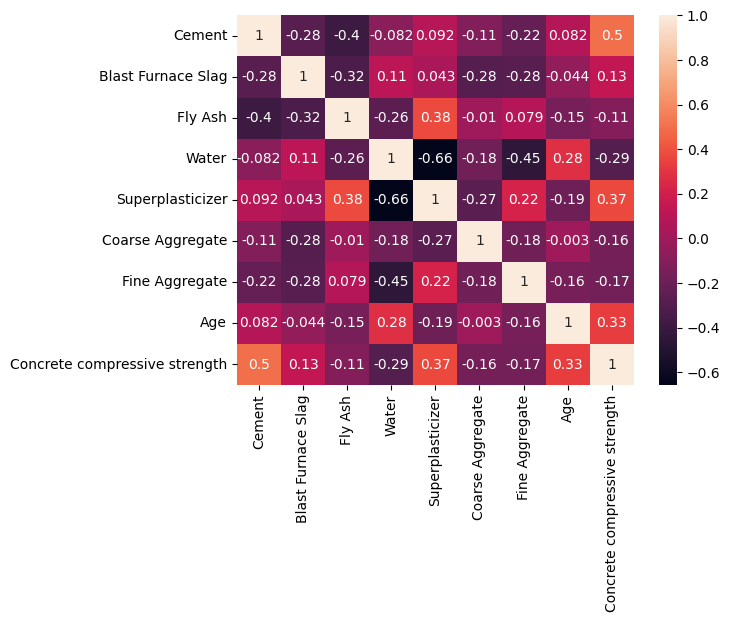

In [ ]:
import seaborn as sns
sns.heatmap(entire_data.corr(), annot=True)
plt.show()

After performing Correlation, now we perform Train - Test Split

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=24)
X_train.shape, y_train.shape




((721, 8), (721, 1))

Performing LinearRegression

In [ ]:
lr = LinearRegression()     # instantiating the Linear Regression Class
lr.fit(X_train, y_train)    # Training the model

LinearRegression()

In [ ]:
print(lr.intercept_ , lr.coef_ )


#  y = __    +     __*x
 #   intercept    coef

[-35.44918333] [[ 0.12726535  0.11257926  0.09835135 -0.13691381  0.23733402  0.02020436
   0.02616505  0.12251105]]


In [ ]:
y_pred = lr.predict(X_test)
r2_score(y_test, y_pred)

0.5771752777048793

# **Method of Least Square**
Linear Regression Using Numpy

In [ ]:
import numpy as np
x= np.array([2,5,7,8,9,10,23,45])    #109
y= np.array([13,15,20,34,36,56,66,78])  #318

In [ ]:
s_x = np.sum(x)
s_y = np.sum(y)
s_xy = np.sum(x*y)  # np.dot(x,y)
s_x_x = np.sum(x**2)
n = len(x)

In [ ]:
b1 = (((s_x * s_y)/n)-(s_xy)) / (((s_x ** 2)/n)-(s_x_x))
b1

1.5031881454872025

In [ ]:
b0 = ((s_y) - (b1 * (s_x)))/n
b0

19.269061517736866

In [ ]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
# lr.fit(x,y)     # Expected 2D array, got 1D array instead:
                # array=[ 2  5  7  8  9 10 23 45].
                # Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample
lr.fit(x.reshape(-1,1),y)
lr.intercept_, lr.coef_

(19.26906151773687, array([1.50318815]))

# **Boston Dataset**

In [ ]:
boston = pd.read_csv('/content/sample_data/Boston.csv')
boston.head()

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2


In [ ]:
y = boston['medv']
x = boston.drop('medv', axis=1)

x_train,x_test, y_train, y_test = train_test_split(x,y,random_state=24, test_size=0.3)

In [ ]:
lr = LinearRegression()
lr.fit(x_train,y_train)
y_pred = lr.predict(x_test)
r2_score(y_test, y_pred)

0.7133431144123463

**Correlation Between %Lower status and Median Values**

In [ ]:
boston['lstat'].corr(boston['medv'])

-0.7376627261740151

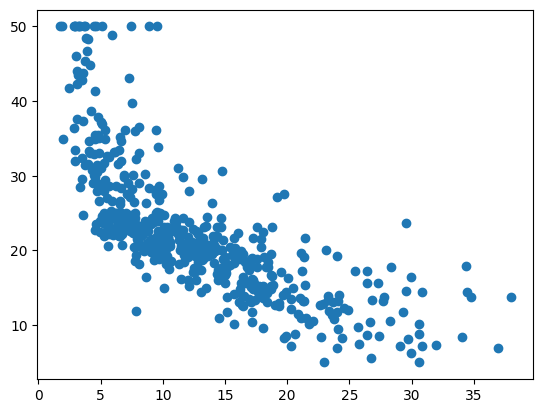

In [ ]:
plt.scatter(boston['lstat'], boston['medv'])
plt.show()

In [ ]:
x = boston['lstat']
x_2 = boston['lstat']**2
x_2.corr(boston['medv'])

-0.6221787647682886

# **Date - 29/10/2024**

Polynomial Regression :-

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import PolynomialFeatures

In [ ]:
boston = pd.read_csv('/content/sample_data/Boston.csv')
boston.head()

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2


In [ ]:
# x = boston['lstat']    # This will give error....
x = boston[['lstat']]    # Now this is DF and, this we don't have to reshape while giving it to fit and predict method
y = boston['medv']

x_train,x_test, y_train, y_test = train_test_split(x,y,random_state=24, test_size=0.3)

In [ ]:
lr = LinearRegression()
lr.fit(x_train,y_train)    # This will give error.... , if the x value is in series, but if it is in DF then it will be okay
y_pred = lr.predict(x_test)
r2_score(y_test, y_pred)

0.5279301917445975

In [ ]:
ploy = PolynomialFeatures(degree=2, include_bias = False).set_output(transform='pandas')     #Include_bais will remove the first column of the df,
x_train_poly = ploy.fit_transform(x_train)              # set_output method used to convert the data in dataframe
x_test_poly = ploy.transform(x_test)
lr.fit(x_train_poly,y_train)
y_pred = lr.predict(x_test_poly)
r2_score(y_test, y_pred)

0.6431149312301052

In [ ]:
ploy = PolynomialFeatures(degree=3, include_bias = False).set_output(transform='pandas')     #Include_bais will remove the first column of the df,
x_train_poly = ploy.fit_transform(x_train)              # set_output method used to convert the data in dataframe
x_test_poly = ploy.transform(x_test)
lr.fit(x_train_poly,y_train)
y_pred = lr.predict(x_test_poly)
r2_score(y_test, y_pred)

0.6464637609380741

In [ ]:
ploy = PolynomialFeatures(degree=4, include_bias = False).set_output(transform='pandas')     #Include_bais will remove the first column of the df,
x_train_poly = ploy.fit_transform(x_train)              # set_output method used to convert the data in dataframe
x_test_poly = ploy.transform(x_test)
lr.fit(x_train_poly,y_train)
y_pred = lr.predict(x_test_poly)
r2_score(y_test, y_pred)

0.6397924587030076

In [ ]:
ploy = PolynomialFeatures(degree=5, include_bias = False).set_output(transform='pandas')     #Include_bais will remove the first column of the df,
x_train_poly = ploy.fit_transform(x_train)              # set_output method used to convert the data in dataframe
x_test_poly = ploy.transform(x_test)
lr.fit(x_train_poly,y_train)
y_pred = lr.predict(x_test_poly)
r2_score(y_test, y_pred)

0.643113694747832

Here in Above case the polynomial regression with degree 3 is giving the best r2 score than linear regression as well as ploynomial regression with degree other than 3

**Taking columns [rad] & [lstat]**

In [ ]:
x = boston[['rad','lstat']]
y = boston['medv']

x_train,x_test, y_train, y_test = train_test_split(x,y,random_state=24, test_size=0.3)


In [ ]:
lr = LinearRegression()
lr.fit(x_train,y_train)    # This will give error.... , if the x value is in series, but if it is in DF then it will be okay
y_pred = lr.predict(x_test)
r2_score(y_test, y_pred)

0.5260520682885452

In [ ]:
ploy = PolynomialFeatures(degree=2, include_bias = False).set_output(transform='pandas')
x_train_poly = ploy.fit_transform(x_train)
x_test_poly = ploy.transform(x_test)
lr.fit(x_train_poly,y_train)
y_pred = lr.predict(x_test_poly)
r2_score(y_test, y_pred)

0.6833321681968914

In [ ]:
ploy = PolynomialFeatures(degree=3, include_bias = False).set_output(transform='pandas')
x_train_poly = ploy.fit_transform(x_train)
x_test_poly = ploy.transform(x_test)
lr.fit(x_train_poly,y_train)
y_pred = lr.predict(x_test_poly)
r2_score(y_test, y_pred)

0.6883404673188809

In [ ]:
x_train_poly.columns

Index(['rad', 'lstat', 'rad^2', 'rad lstat', 'lstat^2', 'rad^3', 'rad^2 lstat',
       'rad lstat^2', 'lstat^3', 'rad^4', 'rad^3 lstat', 'rad^2 lstat^2',
       'rad lstat^3', 'lstat^4'],
      dtype='object')

**Taking All The Columns**

In [ ]:
x = boston.drop('medv', axis=1, inplace = False)  # Excluding "medv" column from the data set
y = boston['medv']

x_train,x_test, y_train, y_test = train_test_split(x,y,random_state=24, test_size=0.3)

In [ ]:
lr = LinearRegression()
lr.fit(x_train,y_train)
y_pred = lr.predict(x_test)
r2_score(y_test, y_pred)

0.7133431144123463

In [ ]:
ploy = PolynomialFeatures(degree=2, include_bias = False).set_output(transform='pandas')
x_train_poly = ploy.fit_transform(x_train)
x_test_poly = ploy.transform(x_test)
lr.fit(x_train_poly,y_train)
y_pred = lr.predict(x_test_poly)
r2_score(y_test, y_pred)

0.6950286613601392

In [ ]:
ploy = PolynomialFeatures(degree=3, include_bias = False).set_output(transform='pandas')
x_train_poly = ploy.fit_transform(x_train)
x_test_poly = ploy.transform(x_test)
lr.fit(x_train_poly,y_train)
y_pred = lr.predict(x_test_poly)
r2_score(y_test, y_pred)

-8442.445263155329

**Concrete Data Set**

In [ ]:

concrete_compressive_strength = fetch_ucirepo(id=165)

X = concrete_compressive_strength.data.features
y = concrete_compressive_strength.data.targets

x_train,x_test, y_train, y_test = train_test_split(X,y,random_state=24, test_size=0.3)

In [ ]:
lr = LinearRegression()
lr.fit(x_train,y_train)
y_pred = lr.predict(x_test)
r2_score(y_test, y_pred)

0.5771752777048793

In [ ]:
ploy = PolynomialFeatures(degree=2, include_bias = False).set_output(transform='pandas')
x_train_poly = ploy.fit_transform(x_train)
x_test_poly = ploy.transform(x_test)
lr.fit(x_train_poly,y_train)
y_pred = lr.predict(x_test_poly)
r2_score(y_test, y_pred)

0.7807023265191909

In [ ]:
ploy = PolynomialFeatures(degree=3, include_bias = False).set_output(transform='pandas')
x_train_poly = ploy.fit_transform(x_train)
x_test_poly = ploy.transform(x_test)
lr.fit(x_train_poly,y_train)
y_pred = lr.predict(x_test_poly)
r2_score(y_test, y_pred)

0.8622822643856062

**Conclusion :**
The Concrete Strength Dataset gives better r2_score with polynomial regression having degree 3

# Using Pipelines

In [ ]:
from sklearn.pipeline import Pipeline
poly = PolynomialFeatures(degree=3, include_bias = False).set_output(transform='pandas')
lr = LinearRegression()
pipe = Pipeline([('POLY',poly),('LR',lr)])
pipe.fit(x_train,y_train)
y_pred = pipe.predict(x_test)
r2_score(y_test, y_pred)

0.8622822643856062

Same Result as above, but here we directly passed x_test, y_test without converting it to polynomial

## One Hot Encoding

**Housing DataSet**

In [ ]:
housing = pd.read_csv('/content/sample_data/Housing.csv')
housing.head()

,price,lotsize,bedrooms,bathrms,stories,driveway,recroom,fullbase,gashw,airco,garagepl,prefarea
0,42000.0,5850,3,1,2,yes,no,yes,no,no,1,no
1,38500.0,4000,2,1,1,yes,no,no,no,no,0,no
2,49500.0,3060,3,1,1,yes,no,no,no,no,0,no
3,60500.0,6650,3,1,2,yes,yes,no,no,no,0,no
4,61000.0,6360,2,1,1,yes,no,no,no,no,0,no


In [ ]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 546 entries, 0 to 545
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   price     546 non-null    float64
 1   lotsize   546 non-null    int64  
 2   bedrooms  546 non-null    int64  
 3   bathrms   546 non-null    int64  
 4   stories   546 non-null    int64  
 5   driveway  546 non-null    object 
 6   recroom   546 non-null    object 
 7   fullbase  546 non-null    object 
 8   gashw     546 non-null    object 
 9   airco     546 non-null    object 
 10  garagepl  546 non-null    int64  
 11  prefarea  546 non-null    object 
dtypes: float64(1), int64(5), object(6)
memory usage: 51.3+ KB


using .get_dumies() from pandas  

In [ ]:
x = housing[['driveway']]
y = housing['price']


In [ ]:
dum_X = pd.get_dummies(x)
dum_X

,driveway_no,driveway_yes
0,False,True
1,False,True
2,False,True
3,False,True
4,False,True
...,...,...
541,False,True
542,False,True
543,False,True
544,False,True


In [ ]:
dum_X = pd.get_dummies(x,drop_first=True)  #Drop the first column
dum_X


,driveway_yes
0,True
1,True
2,True
3,True
4,True
...,...
541,True
542,True
543,True
544,True


In [ ]:
dum_X = pd.get_dummies(x,drop_first=True)
lr = LinearRegression()
lr.fit(dum_X, y)
lr.intercept_, lr.coef_
# from sklearn.preprocessing import OneHotEncoder
# ohe = OneHotEncoder()

(48555.77922077924, array([22778.11630161]))

In [ ]:
price = lr.intercept_ + lr.coef_[0] * dum_X['driveway_yes']
price.sample(20)

,driveway_yes
312,71333.895522
189,71333.895522
262,71333.895522
382,71333.895522
168,71333.895522
167,71333.895522
151,48555.779221
118,71333.895522
204,71333.895522
178,71333.895522


In [ ]:
housing.groupby('driveway')['price'].mean()

,price
driveway,
no,48555.779221
yes,71333.895522


#**Using driveway = no**

In [ ]:
housing = pd.read_csv('/content/sample_data/Housing.csv')
housing.head()

X = housing[['driveway']]
y = housing['price']

In [ ]:
dum_X = pd.get_dummies(X)
dum_X.drop('driveway_yes', axis=1, inplace=True)
lr = LinearRegression()
lr.fit(dum_X, y)
lr.intercept_, lr.coef_

(71333.89552238806, array([-22778.11630161]))

In [ ]:
housing.groupby('driveway')['price'].mean()

,price
driveway,
no,48555.779221
yes,71333.895522


**Conclusion :-** By using any of the column, the results we get are always same

## OneHotEncoding using SKLearn

In [ ]:
from sklearn.preprocessing import OneHotEncoder
ohe = OneHotEncoder(sparse_output = False).set_output(transform= 'pandas')

In [ ]:
ohe.fit_transform(x)

,driveway_no,driveway_yes
0,0.0,1.0
1,0.0,1.0
2,0.0,1.0
3,0.0,1.0
4,0.0,1.0
...,...,...
541,0.0,1.0
542,0.0,1.0
543,0.0,1.0
544,0.0,1.0


In [ ]:
ohe = OneHotEncoder(sparse_output = False, drop='first').set_output(transform= 'pandas')   # Drop first column alphabetically
dum_x = ohe.fit_transform(x)

In [ ]:
lr = LinearRegression()
lr.fit(dum_x, y)
lr.intercept_, lr.coef_

(48555.77922077924, array([22778.11630161]))

**Two Columns driveway and airco**

In [ ]:
x = housing[['driveway','airco']]
y = housing['price']

In [ ]:
ohe = OneHotEncoder(sparse_output = False, drop='first').set_output(transform= 'pandas')   # Drop first column alphabetically
dum_x = ohe.fit_transform(x)
lr = LinearRegression()
lr.fit(dum_x, y)
lr.intercept_, lr.coef_

(43790.670320318815, array([19302.6687155, 24460.8923557]))

In [ ]:
dum_x.columns

Index(['driveway_yes', 'airco_yes'], dtype='object')

**With Numeric Values using three columns**

In [ ]:
x = housing[['driveway','airco','bedrooms']]
y = housing['price']

In [ ]:
housing['bedrooms'].unique()

array([3, 2, 4, 1, 5, 6])

***pd.get_dummies() does the encoding of only object type variables***

In [ ]:
ohe = OneHotEncoder(sparse_output=False, drop='first').set_output(transform='pandas')
dum_X = ohe.fit_transform(X)
lr = LinearRegression()
lr.fit(dum_X, y)
lr.intercept_, lr.coef_

(48555.77922077924, array([22778.11630161]))

# *Column Transformation*

In [ ]:
from sklearn.compose import make_column_transformer
from sklearn.compose import make_column_selector

In [ ]:
str_col = list(housing.columns[housing.dtypes==object])
num_col = list(housing.columns[housing.dtypes!=object])
ohe = OneHotEncoder(sparse_output=False, drop = 'first').set_output(transform= 'pandas')


In [ ]:
ct = make_column_transformer(('passthrough',num_col),(ohe,str_col)).set_output(transform= 'pandas')
ct.fit_transform(housing)

,passthrough__price,passthrough__lotsize,passthrough__bedrooms,passthrough__bathrms,passthrough__stories,passthrough__garagepl,onehotencoder__driveway_yes,onehotencoder__recroom_yes,onehotencoder__fullbase_yes,onehotencoder__gashw_yes,onehotencoder__airco_yes,onehotencoder__prefarea_yes
0,42000.0,5850,3,1,2,1,1.0,0.0,1.0,0.0,0.0,0.0
1,38500.0,4000,2,1,1,0,1.0,0.0,0.0,0.0,0.0,0.0
2,49500.0,3060,3,1,1,0,1.0,0.0,0.0,0.0,0.0,0.0
3,60500.0,6650,3,1,2,0,1.0,1.0,0.0,0.0,0.0,0.0
4,61000.0,6360,2,1,1,0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
541,91500.0,4800,3,2,4,0,1.0,1.0,0.0,0.0,1.0,0.0
542,94000.0,6000,3,2,4,0,1.0,0.0,0.0,0.0,1.0,0.0
543,103000.0,6000,3,2,4,1,1.0,1.0,0.0,0.0,1.0,0.0
544,105000.0,6000,3,2,2,1,1.0,1.0,0.0,0.0,1.0,0.0


In [ ]:
ct = make_column_transformer(('passthrough',num_col),(ohe,str_col),verbose_feature_names_out=False).set_output(transform= 'pandas')
ct.fit_transform(housing)


,price,lotsize,bedrooms,bathrms,stories,garagepl,driveway_yes,recroom_yes,fullbase_yes,gashw_yes,airco_yes,prefarea_yes
0,42000.0,5850,3,1,2,1,1.0,0.0,1.0,0.0,0.0,0.0
1,38500.0,4000,2,1,1,0,1.0,0.0,0.0,0.0,0.0,0.0
2,49500.0,3060,3,1,1,0,1.0,0.0,0.0,0.0,0.0,0.0
3,60500.0,6650,3,1,2,0,1.0,1.0,0.0,0.0,0.0,0.0
4,61000.0,6360,2,1,1,0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
541,91500.0,4800,3,2,4,0,1.0,1.0,0.0,0.0,1.0,0.0
542,94000.0,6000,3,2,4,0,1.0,0.0,0.0,0.0,1.0,0.0
543,103000.0,6000,3,2,4,1,1.0,1.0,0.0,0.0,1.0,0.0
544,105000.0,6000,3,2,2,1,1.0,1.0,0.0,0.0,1.0,0.0


Using make_column_selector () Function

In [ ]:
# We can use make_column_selector() without making two diffrent list
ohe = OneHotEncoder(sparse_output=False, drop = 'first').set_output(transform= 'pandas')
ct = make_column_transformer( ('passthrough',make_column_selector(dtype_exclude=object) ) ,
                              (ohe  ,   make_column_selector(dtype_include=object   )   )  ,
                              verbose_feature_names_out=False).set_output(transform= 'pandas')
ct.fit_transform(housing)

,price,lotsize,bedrooms,bathrms,stories,garagepl,driveway_yes,recroom_yes,fullbase_yes,gashw_yes,airco_yes,prefarea_yes
0,42000.0,5850,3,1,2,1,1.0,0.0,1.0,0.0,0.0,0.0
1,38500.0,4000,2,1,1,0,1.0,0.0,0.0,0.0,0.0,0.0
2,49500.0,3060,3,1,1,0,1.0,0.0,0.0,0.0,0.0,0.0
3,60500.0,6650,3,1,2,0,1.0,1.0,0.0,0.0,0.0,0.0
4,61000.0,6360,2,1,1,0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
541,91500.0,4800,3,2,4,0,1.0,1.0,0.0,0.0,1.0,0.0
542,94000.0,6000,3,2,4,0,1.0,0.0,0.0,0.0,1.0,0.0
543,103000.0,6000,3,2,4,1,1.0,1.0,0.0,0.0,1.0,0.0
544,105000.0,6000,3,2,2,1,1.0,1.0,0.0,0.0,1.0,0.0


***Using hot encoding with train test split***

In [ ]:
ohe = OneHotEncoder(sparse_output=False, drop = 'first').set_output(transform= 'pandas')
ct = make_column_transformer( ('passthrough',make_column_selector(dtype_exclude=object) ) ,
                              (ohe  ,   make_column_selector(dtype_include=object   )   )  ,
                              verbose_feature_names_out=False).set_output(transform= 'pandas')

x = housing.drop('price', axis=1)
y = housing['price']
x_train, x_test, y_train, y_test = train_test_split(x,y, random_state=24, test_size=0.3)

In [ ]:
x_ohe_train = ct.fit_transform(x_train)
x_ohe_test = ct.transform(x_test)
lr.fit(x_ohe_train, y_train)
y_pred = lr.predict(x_ohe_test)
r2_score(y_test, y_pred)

0.6246856191453718

***Using Pipeline***

In [ ]:
from sklearn.pipeline import Pipeline
ohe = OneHotEncoder(sparse_output=False, drop = 'first').set_output(transform= 'pandas')
ct = make_column_transformer( ('passthrough',make_column_selector(dtype_exclude=object) ) ,
                              (ohe  ,   make_column_selector(dtype_include=object   )   )  ,
                              verbose_feature_names_out=False).set_output(transform= 'pandas')

x = housing.drop('price', axis=1)
y = housing['price']
x_train, x_test, y_train, y_test = train_test_split(x,y, random_state=24, test_size=0.3)

lr = LinearRegression()
pipe = Pipeline([('CT',ct),('LR',lr)])
pipe.fit(x_train,y_train)
y_pred = pipe.predict(x_test)
r2_score(y_test, y_pred)

0.6246856191453718

Getting the same result

***Polynomial transformation***

In [ ]:
poly = PolynomialFeatures(degree=2, include_bias = False).set_output(transform='pandas')
pipe = Pipeline([('CT',ct),('POLY',poly),('LR',lr)])
pipe.fit(x_train, y_train)


Pipeline(steps=[('CT',
                 ColumnTransformer(transformers=[('passthrough', 'passthrough',
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7a9441d56d10>),
                                                 ('onehotencoder',
                                                  OneHotEncoder(drop='first',
                                                                sparse_output=False),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7a9441d576d0>)],
                                   verbose_feature_names_out=False)),
                ('POLY', PolynomialFeatures(include_bias=False)),
                ('LR', LinearRegression())])

In [ ]:
y_pred = pipe.predict(x_test)
r2_score(y_test,y_pred)

0.5558314098854267

Today's Learning :    
1. Polynomial Regression = polynomial Featuring + Linear regression
2. Pipeline
3. Column Transformation
4. One Hot Encoding        
Here 3 & 4 are the part of Data Pre-Processing

* In Pre-Processing there is one topic "Scaling"
5. Scaling : Is of Two types
(i) Standard Scaling
(ii) MinMax Scaling

***Performing Scaling Using Numpy***

In [ ]:
import numpy as np
a = np.array([23,45,67,89,76,43,56,32])
b = np.array([3,4,2,6,3,1,7,8])
ma , mb = a.mean(), b.mean()
sa , sb = a.std(), b.std()


In [ ]:
scl_a = (a-ma)/sa
scl_b = (b-mb)/sb

In [ ]:
( ma , sa ), ( scl_a.mean(), scl_a.std() )   # Comparing the values of original mean and std with the scaled mean and std

((53.875, 21.00260400521802), (1.3877787807814457e-17, 0.9999999999999999))

In [ ]:
( mb , sb ), (scl_b.mean(), scl_b.std())

((4.25, 2.331844763272204), (2.7755575615628914e-17, 0.9999999999999999))

***Now Performing the same using StandardScalar Class***

In [ ]:
from sklearn.preprocessing import StandardScaler
import pandas as pd

In [ ]:
scl_std = StandardScaler()
df = pd.DataFrame({'a':a,'b':b})
scl_std.fit(df)

StandardScaler()

In [ ]:
print(scl_std.mean_)
print(ma,  mb)

[53.875  4.25 ]
53.875 4.25


In [ ]:
print(scl_std.scale_)

[21.00260401  2.33184476]


In [ ]:
scl_std

StandardScaler()

In [ ]:
scl_a, scl_b

(array([-1.47005581, -0.42256665,  0.62492251,  1.67241167,  1.0534408 ,
        -0.51779294,  0.10117793, -1.04153752]),
 array([-0.53605627, -0.10721125, -0.96490128,  0.75047877, -0.53605627,
        -1.3937463 ,  1.17932379,  1.6081688 ]))

## MinMax Scaling
**using Numpy**

In [ ]:
a,b

(array([23, 45, 67, 89, 76, 43, 56, 32]), array([3, 4, 2, 6, 3, 1, 7, 8]))

In [ ]:
mn_a, mn_b, mx_a, mx_b = a.min(), b.min(), a.max(), b.max()
print(mn_a, mn_b, mx_a, mx_b)

23 1 89 8


In [ ]:
scl_a = (a-mn_a)/(mx_a - mn_a)
scl_b = (b-mn_b)/(mx_b - mn_b)
scl_a, scl_b      # In Result one value will always be Zero and 1 will be ONE, and the other values lies between them

(array([0.        , 0.33333333, 0.66666667, 1.        , 0.8030303 ,
        0.3030303 , 0.5       , 0.13636364]),
 array([0.28571429, 0.42857143, 0.14285714, 0.71428571, 0.28571429,
        0.        , 0.85714286, 1.        ]))

***Concrete DataSet***

In [ ]:
from ucimlrepo import fetch_ucirepo
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

In [ ]:
concrete_compressive_strength = fetch_ucirepo(id=165)
x = concrete_compressive_strength.data.features
y = concrete_compressive_strength.data.targets

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x,y,random_state = 24, test_size= 0.3)
lr = LinearRegression()
lr.fit(x_train, y_train)
y_pred = lr.predict(x_test)
r2_score(y_test,y_pred)

0.5771752777048793

In [ ]:
#With StandardScalar()
scl_std = StandardScaler()
lr = LinearRegression()
pipe = Pipeline([('SCL',scl_std),('LR',lr)])
pipe.fit(x_train, y_train)
y_pred = pipe.predict(x_test)
r2_score(y_test,y_pred)

0.5771752777048791

In [ ]:
#With MinMaxScalar()
scl_min = MinMaxScaler()
lr = LinearRegression()
pipe = Pipeline([('SCL',scl_min),('LR',lr)])
pipe.fit(x_train, y_train)
y_pred = pipe.predict(x_test)
r2_score(y_test,y_pred)

0.5771752777048793

***Ridge Regression***

In [ ]:
from sklearn.linear_model import LinearRegression,Ridge

concrete_compressive_strength = fetch_ucirepo(id=165)
X = concrete_compressive_strength.data.features
y = concrete_compressive_strength.data.targets

In [ ]:
X_train,X_test, y_train, y_test = train_test_split(X,y,random_state=24, test_size=0.3)
lr = LinearRegression()
lr.fit(X_train,y_train)
print(lr.intercept_ , lr.coef_)
y_pred = lr.predict(X_test)
r2_score(y_test,y_pred)

[-35.44918333] [[ 0.12726535  0.11257926  0.09835135 -0.13691381  0.23733402  0.02020436
   0.02616505  0.12251105]]


0.5771752777048793

In [ ]:
ridge = Ridge()
ridge.fit(X_train,y_train)
print(ridge.intercept_ , ridge.coef_)
y_pred = ridge.predict(X_test)
r2_score(y_test,y_pred)

[-35.44730826] [[ 0.12726534  0.11257926  0.09835178 -0.13691825  0.23731065  0.0202036
   0.02616478  0.12251103]]


0.5771749099675622

***Ridge + Polynomial***

In [ ]:
poly = PolynomialFeatures(degree=3, include_bias = False).set_output(transform='pandas')
ridge = Ridge()
pipe = Pipeline([('POLY',poly),('RIDGE',ridge)])
pipe.fit(X_train,y_train)
y_pred = pipe.predict(X_test)
r2_score(y_test, y_pred)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=9.96075e-21): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


0.8695065065730014

In [ ]:
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

Filtered The Extracted features based on coefficient values

In [ ]:
df_coef = pd.DataFrame({'col_names':list(X_train_poly.columns),
                        'coef':list(ridge.coef_[0])})
print(df_coef.shape)

(164, 2)


In [ ]:
df_coef[df_coef['coef'] > 0.0001]

,col_names,coef
1,Blast Furnace Slag,0.636144
5,Coarse Aggregate,2.612272
6,Fine Aggregate,0.909094
7,Age,0.123619
8,Cement^2,0.010445
9,Cement Blast Furnace Slag,0.031224
10,Cement Fly Ash,0.008666
14,Cement Fine Aggregate,0.023399
16,Blast Furnace Slag^2,0.004927
17,Blast Furnace Slag Fly Ash,0.015132


*Considering Different Values of Alpha*

Alpha is also called as Hyper Parameter, which means we can set its value externally

**This Concept is also called as Hyper-parameter Tuning**

In [ ]:
ridge = Ridge(alpha=0.22)     # By Default value of Alpha is 1
ridge.fit(X_train, y_train)
y_pred = ridge.predict(X_test)
r2_score(y_test, y_pred)

0.5771751967997467

Tuning for alpha = [0.01,0.1,0.3,0.6,1,1.5,2,4,10]

In [ ]:
alphas =  [0.01,0.1,0.3,0.6,1,1.5,2,4,10]
scores= []
for a in alphas:
    ridge = Ridge(alpha=a)
    ridge.fit(X_train, y_train)
    y_pred = ridge.predict(X_test)
    scores.append(r2_score(y_test, y_pred))
print(scores)

[0.577175274027337, 0.5771752409296143, 0.5771751673801073, 0.5771750570584016, 0.5771749099675622, 0.5771747261116771, 0.5771745422643089, 0.5771738069600126, 0.577171601865183]


In [ ]:
i_max = np.argmax(scores)
print('Best Alpha : ',alphas[i_max])
print("Best Score : ",scores[i_max])

Best Alpha :  0.01
Best Score :  0.5771752773371244


In [ ]:
alp = np.linspace(0.001, 10, 20)
scores = []
for a in alp:
    ridge = Ridge(alpha=a)
    ridge.fit(X_train, y_train)
    y_pred = ridge.predict(X_test)
    scores.append(r2_score(y_test, y_pred))
print(scores)

[0.5771752773371244, 0.577175083806295, 0.577174890284899, 0.5771746967729365, 0.5771745032704092, 0.5771743097773173, 0.5771741162936617, 0.5771739228194432, 0.5771737293546622, 0.57717353589932, 0.5771733424534167, 0.5771731490169539, 0.5771729555899318, 0.5771727621723513, 0.5771725687642131, 0.5771723753655178, 0.5771721819762665, 0.5771719885964599, 0.5771717952260984, 0.577171601865183]


In [ ]:
i_max = np.argmax(scores)
print('Best Alpha : ',alp[i_max])
print("Best Score : ",scores[i_max])

Best Alpha :  0.001
Best Score :  0.5771752773371244


# *Regularized Regression*
α : Regularization parameter

Sibling of this is lasso Regression

In [ ]:
from ucimlrepo import fetch_ucirepo
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression,Lasso
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler


In [ ]:
concrete_compressive_strength = fetch_ucirepo(id=165)
X = concrete_compressive_strength.data.features
y = concrete_compressive_strength.data.targets

X_train, X_test, y_train, y_test = train_test_split(X,y, random_state=24, test_size=0.3)

In [ ]:
lasso = Lasso()     # By Default value of Alpha is 1
lasso.fit(X_train, y_train)
y_pred = lasso.predict(X_test)
r2_score(y_test, y_pred)

0.576333587787164

In [ ]:
alphas =  [0.01,0.1,0.3,0.6,1,1.5,2,4,10]
scores= []
for a in alphas:
    lasso = Lasso(alpha=a)
    lasso.fit(X_train, y_train)
    y_pred = lasso.predict(X_test)
    scores.append(r2_score(y_test, y_pred))
print(scores)

[0.5771691108987353, 0.5771115530311295, 0.5769704819491088, 0.5767247403090354, 0.576333587787164, 0.5757431933389369, 0.5750397893814314, 0.5721995411104168, 0.5731618042353834]


In [ ]:
i_max = np.argmax(scores)
print('Best Alpha : ',alphas[i_max])
print("Best Score : ",scores[i_max])

Best Alpha :  0.01
Best Score :  0.5771691108987353


In [ ]:
alp = np.linspace(0.001, 10, 20)
scores = []
for a in alp:
    lasso = Lasso(alpha=a)
    lasso.fit(X_train, y_train)
    y_pred = lasso.predict(X_test)
    scores.append(r2_score(y_test, y_pred))
print(scores)

[0.5771746627377363, 0.5767880340907625, 0.5762758628258238, 0.5756386526675913, 0.5748762432483998, 0.5739894664206779, 0.5729782053419445, 0.5721011491892074, 0.5722616286127484, 0.5724100814563656, 0.5725448379782299, 0.5726667177385942, 0.5727764720207116, 0.5728731568983, 0.572956611521234, 0.5730274821311212, 0.5730858174788658, 0.573131521821236, 0.5731560484652614, 0.5731618042353834]


In [ ]:
i_max = np.argmax(scores)
print('Best Alpha : ',alp[i_max])
print("Best Score : ",scores[i_max])

Best Alpha :  0.001
Best Score :  0.5771746627377363


Ridge Regression also called as L2 regression,
Lasso Regression is also called as L1 regression


# *ElasticNet Regression*

Also has alpha or l1_ratio(r) 0<r<1


And when l1_ratio =1 Then it is equivalent to  lasso regression

In [ ]:
from ucimlrepo import fetch_ucirepo
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression,ElasticNet
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler


In [ ]:
concrete_compressive_strength = fetch_ucirepo(id=165)
X = concrete_compressive_strength.data.features
y = concrete_compressive_strength.data.targets

X_train, X_test, y_train, y_test = train_test_split(X,y, random_state=24, test_size=0.3)

In [ ]:
elastic = ElasticNet()
elastic.fit(X_train, y_train)
y_pred = elastic.predict(X_test)
r2_score(y_test, y_pred)

0.5766806310401152

In [ ]:
alphas = np.linspace(0.001,10,20)
l1 = np.linspace(0.001,1,10)
scores = []

for a in alphas:
    for i in l1:
        elastic = ElasticNet(alpha=a, l1_ratio=i)
        elastic.fit(X_train, y_train)
        y_pred = elastic.predict(X_test)
        scores.append([a ,i , r2_score(y_test, y_pred)])

df_scores = pd.DataFrame(scores, columns=['alpha','L1-ratio','score'])
df_scores.sort_values('score',ascending=False, inplace = True)
best_a = df_scores['alpha'].iloc[0]
best_li = df_scores['L1-ratio'].iloc[0]
best_sc = df_scores['score'].iloc[0]

print("Best Alpha : ", best_a)
print("Best L1_ratio : ", best_li)
print("Best Score : ",best_sc)

Best Alpha :  0.001
Best L1_ratio :  0.001
Best Score :  0.5771750122133008


**ON Housing Data Set**

In [ ]:
housing = pd.read_csv('/content/sample_data/Housing.csv')
housing.head()

,price,lotsize,bedrooms,bathrms,stories,driveway,recroom,fullbase,gashw,airco,garagepl,prefarea
0,42000.0,5850,3,1,2,yes,no,yes,no,no,1,no
1,38500.0,4000,2,1,1,yes,no,no,no,no,0,no
2,49500.0,3060,3,1,1,yes,no,no,no,no,0,no
3,60500.0,6650,3,1,2,yes,yes,no,no,no,0,no
4,61000.0,6360,2,1,1,yes,no,no,no,no,0,no


In [ ]:
X = housing.drop('price', axis=1)
y = housing['price']

X_train, X_test, y_train, y_test = train_test_split(X,y, random_state=24, test_size=0.3)
ohe = OneHotEncoder(sparse_output=False, drop = 'first').set_output(transform= 'pandas')
ct = make_column_transformer( ('passthrough',make_column_selector(dtype_exclude=object) ) ,
                              (ohe  ,   make_column_selector(dtype_include=object   )   )  ,
                              verbose_feature_names_out=False).set_output(transform= 'pandas')



x_ohe_train = ct.fit_transform(X_train)
x_ohe_test = ct.transform(X_test)

In [ ]:

elastic = ElasticNet()
elastic.fit(x_ohe_train, y_train)
y_pred = elastic.predict(x_ohe_test)
r2_score(y_test, y_pred)

0.5182465208820854

**Hypertension optimization**

In [ ]:
alphas = np.linspace(0.001,10,20)
l1 = np.linspace(0.001,1,10)
scores = []

for a in alphas:
    for i in l1:
        elastic = ElasticNet(alpha=a, l1_ratio=i)
        elastic.fit(x_ohe_train, y_train)
        y_pred = elastic.predict(x_ohe_test)
        scores.append([a ,i , r2_score(y_test, y_pred)])

df_scores = pd.DataFrame(scores, columns=['alpha','L1-ratio','score'])
df_scores.sort_values('score',ascending=False, inplace = True)
best_a = df_scores['alpha'].iloc[0]
best_li = df_scores['L1-ratio'].iloc[0]
best_sc = df_scores['score'].iloc[0]

print("Best Alpha : ", best_a)
print("Best L1_ratio : ", best_li)
print("Best Score : ",best_sc)

Best Alpha :  0.001
Best L1_ratio :  1.0
Best Score :  0.6246856093766131


# **30/10/2024**

### Imputation

In [ ]:
import pandas as pd
from sklearn.linear_model import ElasticNet, LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
import numpy as np
from sklearn.impute import SimpleImputer

In [ ]:
chem = pd.read_csv('/content/ChemicalProcess.csv')
chem.head()

,Yield,BiologicalMaterial01,BiologicalMaterial02,BiologicalMaterial03,BiologicalMaterial04,BiologicalMaterial05,BiologicalMaterial06,BiologicalMaterial07,BiologicalMaterial08,BiologicalMaterial09,...,ManufacturingProcess36,ManufacturingProcess37,ManufacturingProcess38,ManufacturingProcess39,ManufacturingProcess40,ManufacturingProcess41,ManufacturingProcess42,ManufacturingProcess43,ManufacturingProcess44,ManufacturingProcess45
0,38.00,6.25,49.58,56.97,12.74,19.51,43.73,100.0,16.66,11.44,...,0.019,0.5,3,7.2,NaN,NaN,11.6,3.0,1.8,2.4
1,42.44,8.01,60.97,67.48,14.65,19.36,53.14,100.0,19.04,12.55,...,0.019,2.0,2,7.2,0.1,0.15,11.1,0.9,1.9,2.2
2,42.03,8.01,60.97,67.48,14.65,19.36,53.14,100.0,19.04,12.55,...,0.018,0.7,2,7.2,0.0,0.00,12.0,1.0,1.8,2.3
3,41.42,8.01,60.97,67.48,14.65,19.36,53.14,100.0,19.04,12.55,...,0.018,1.2,2,7.2,0.0,0.00,10.6,1.1,1.8,2.1
4,42.49,7.47,63.33,72.25,14.02,17.91,54.66,100.0,18.22,12.80,...,0.017,0.2,2,7.3,0.0,0.00,11.0,1.1,1.7,2.1


In [ ]:
chem.isnull().sum().sum()

106

Constant Strategy

In [ ]:
imp_const = SimpleImputer(strategy='constant', fill_value=0).set_output(transform='pandas')
chem_const = imp_const.fit_transform(chem)
chem_const.isna().sum().sum()

0

Mean Strategy

In [ ]:
imp_mean = SimpleImputer(strategy='mean').set_output(transform='pandas')
chem_mean = imp_mean.fit_transform(chem)
chem_mean.isna().sum().sum()

0

`.fit()` calculates the mean/ median according to the strategy.
`.transform()` does the replacing of missing values with mean/ median

In [ ]:
imp_mean.statistics_

array([ 4.01765341e+01,  6.41142045e+00,  5.56887500e+01,  6.77050000e+01,
        1.23492614e+01,  1.85986364e+01,  4.89103977e+01,  1.00014148e+02,
        1.74947727e+01,  1.28500568e+01,  2.80062500e+00,  1.46953182e+02,
        2.01998864e+01,  1.12074286e+01,  1.66826590e+01,  1.53956522e+00,
        9.31851429e+02,  1.00169314e+03,  2.07401724e+02,  1.77480000e+02,
        1.77554286e+02,  4.56601136e+01,  9.17904192e+00,  9.38554217e+00,
        8.57811429e+02,  3.45079545e+01,  4.85386857e+03,  6.03892045e+03,
        4.56580114e+03,  3.43437500e+01,  4.80968182e+03,  6.02819886e+03,
        4.55646023e+03, -1.64204545e-01,  5.40571429e+00,  3.01714286e+00,
        8.83428571e+00,  4.82817544e+03,  6.01559649e+03,  4.56250877e+03,
        6.59181287e+00,  2.00111111e+01,  9.16140351e+00,  7.01847953e+01,
        1.58465909e+02,  6.35438596e+01,  2.49356725e+00,  4.95596491e+02,
        1.95730994e-02,  1.01363636e+00,  2.53409091e+00,  6.85113636e+00,
        1.77142857e-02,  

Median Strategy

In [ ]:
imp_median = SimpleImputer(strategy='median').set_output(transform='pandas')
chem_median = imp_median.fit_transform(chem)
chem_median.isna().sum().sum()

0

In [ ]:
imp_median.statistics_

array([ 3.9970e+01,  6.3050e+00,  5.5090e+01,  6.7220e+01,  1.2100e+01,
        1.8490e+01,  4.8460e+01,  1.0000e+02,  1.7510e+01,  1.2835e+01,
        2.7100e+00,  1.4608e+02,  2.0120e+01,  1.1400e+01,  2.1000e+01,
        1.5400e+00,  9.3400e+02,  9.9920e+02,  2.0680e+02,  1.7700e+02,
        1.7800e+02,  4.5730e+01,  9.1000e+00,  9.4000e+00,  0.0000e+00,
        3.4600e+01,  4.8560e+03,  6.0315e+03,  4.5880e+03,  3.4400e+01,
        4.8350e+03,  6.0220e+03,  4.5820e+03, -3.0000e-01,  5.0000e+00,
        3.0000e+00,  8.0000e+00,  4.8550e+03,  6.0470e+03,  4.5870e+03,
        1.0400e+01,  1.9900e+01,  9.1000e+00,  7.0800e+01,  1.5800e+02,
        6.4000e+01,  2.5000e+00,  4.9500e+02,  2.0000e-02,  1.0000e+00,
        3.0000e+00,  7.2000e+00,  0.0000e+00,  0.0000e+00,  1.1600e+01,
        8.0000e-01,  1.9000e+00,  2.2000e+00])

In [ ]:
x = chem.drop('Yield', axis=1)
y = chem['Yield']
x_train, x_test, y_train, y_test = train_test_split(x,y, random_state=24, test_size=0.3)

In [ ]:
print(x_train.isna().sum().sum())
print(x_test.isna().sum().sum())

66
40


`.fit()` and then `.transform()` or `.fit_transform()` should be applied on train set.
`.transform()` should be applied on test set.

### Mean Strategy

In [ ]:
imp_mean = SimpleImputer(strategy='mean').set_output(transform='pandas')
x_imp_trn = imp_mean.fit_transform(x_train)
x_imp_tst = imp_mean.transform(x_test)

print(x_imp_trn.isna().sum().sum())
print(x_imp_tst.isna().sum().sum())

0
0


OR

In [ ]:
imp_mean.fit(x_train)
x_imp_trn = imp_mean.transform(x_train)
x_imp_tst = imp_mean.transform(x_test)

print(x_imp_trn.isna().sum().sum())
print(x_imp_tst.isna().sum().sum())

0
0


In [ ]:
y_pred = LinearRegression().fit(x_imp_trn, y_train).predict(x_imp_tst)
r2_score(y_test, y_pred)

0.23930185859410225

Median Strategy

In [ ]:
imp_median = SimpleImputer(strategy='median').set_output(transform='pandas')
x_imp_trn = imp_median.fit_transform(x_train)
x_imp_tst = imp_median.transform(x_test)

print(x_imp_trn.isna().sum().sum())
print(x_imp_tst.isna().sum().sum())

0
0


In [ ]:
y_pred = LinearRegression().fit(x_imp_trn, y_train).predict(x_imp_tst)
r2_score(y_test, y_pred)

0.23651929367647095

## **K-folds Cross-Validation**

In this we divide dataset in some value k lets say 5, and then we do `.fit()` on 4 of them i.e. of train set and `.predict()` on the remaining one i.e. of test set, and will do this by changing the chunks of dataset for train and test and then we take the mean of all the `r2_score()` obtained in each case

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.model_selection import KFold, cross_val_score

In [ ]:
boston = pd.read_csv('/content/Boston.csv')
boston.head()

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2


In [ ]:
x = boston.drop('medv', axis=1)
y = boston['medv']

Linear Regression

In [ ]:
lr = LinearRegression()
result = cross_val_score(lr, x, y)
result.mean()

0.3532759243958849

Elastic Net

In [ ]:
elastic = ElasticNet()
result = cross_val_score(elastic, x, y)
result.mean()

0.4726525191941059

Hyper-Parameter Optimization

In [ ]:
alphas = np.linspace(0.0001, 10, 20)
l1 = np.linspace(0.0001, 1, 10)
scores = []
for a in alphas:
    for i in l1:
        elastic = ElasticNet(alpha=a, l1_ratio=i)
        result = cross_val_score(elastic, x, y)
        scores.append([a,i, result.mean()])
df_scores = pd.DataFrame(scores, columns=['alpha','l1_ratio','score'])
df_scores.sort_values('score', ascending=False, inplace=True)
best_a = df_scores['alpha'].iloc[0]
best_sc = df_scores['score'].iloc[0]
best_l1 = df_scores['l1_ratio'].iloc[0]
print("Best Alpha:", best_a)
print("Best l1 ratio:", best_l1)
print("Best Score:", best_sc)

Best Alpha: 0.5264105263157894
Best l1 ratio: 0.0001
Best Score: 0.4976889030997101


In [ ]:
df_scores

,alpha,l1_ratio,score
10,0.526411,0.0001,0.497689
11,0.526411,0.1112,0.495480
12,0.526411,0.2223,0.492985
13,0.526411,0.3334,0.490010
20,1.052721,0.0001,0.487077
...,...,...,...
188,9.473689,0.8889,0.284385
179,8.947379,1.0000,0.283123
198,10.000000,0.8889,0.280179
189,9.473689,1.0000,0.278435


Using `GridSearchCV()` for Hyper-Parameter Tuning

In [ ]:
from sklearn.model_selection import GridSearchCV

In [ ]:
elastic = ElasticNet()
param_grid = {'alpha':np.linspace(0.0001, 10, 20),
              'l1_ratio':np.linspace(0.0001, 1, 10)}
grid = GridSearchCV(elastic, param_grid, cv=5)
grid.fit(x,y)

GridSearchCV(cv=5, estimator=ElasticNet(),
             param_grid={'alpha': array([1.00000000e-04, 5.26410526e-01, 1.05272105e+00, 1.57903158e+00,
       2.10534211e+00, 2.63165263e+00, 3.15796316e+00, 3.68427368e+00,
       4.21058421e+00, 4.73689474e+00, 5.26320526e+00, 5.78951579e+00,
       6.31582632e+00, 6.84213684e+00, 7.36844737e+00, 7.89475789e+00,
       8.42106842e+00, 8.94737895e+00, 9.47368947e+00, 1.00000000e+01]),
                         'l1_ratio': array([1.000e-04, 1.112e-01, 2.223e-01, 3.334e-01, 4.445e-01, 5.556e-01,
       6.667e-01, 7.778e-01, 8.889e-01, 1.000e+00])})

In [ ]:
print('Best Params :',grid.best_params_)
print('Best Score :',grid.best_score_)

Best Params : {'alpha': 0.5264105263157894, 'l1_ratio': 0.0001}
Best Score : 0.4976889030997101


Using GridSearchCV with Pipeline

In [ ]:
from sklearn.pipeline import Pipeline

In [ ]:
chem = pd.read_csv('/content/ChemicalProcess.csv')
x = chem.drop('Yield', axis=1)
y = chem['Yield']

In [ ]:
imp_mean = SimpleImputer(strategy='mean').set_output(transform='pandas')
lr = LinearRegression()
pipe_lr = Pipeline([('IMPUTER',imp_mean),('LR',lr)])
result = cross_val_score(pipe_lr, x, y)
result.mean()

-94.57748595778229

In [ ]:
imp_median = SimpleImputer(strategy='median').set_output(transform='pandas')
lr = LinearRegression()
pipe_lr = Pipeline([('IMPUTER',imp_median),('LR',lr)])
result = cross_val_score(pipe_lr, x, y)
result.mean()

-86.99645845799377

In [ ]:
imp = SimpleImputer()
lr = LinearRegression()
pipe_lr = Pipeline([('IMP',imp),('LR',lr)])
print(pipe_lr.get_params())

param_grid = {'IMP__strategy':['mean','median']}
grid = GridSearchCV(pipe_lr, param_grid, cv=5)
grid.fit(x,y)

print('Best Params :',grid.best_params_)
print('Best Score :',grid.best_score_)

{'memory': None, 'steps': [('IMP', SimpleImputer()), ('LR', LinearRegression())], 'verbose': False, 'IMP': SimpleImputer(), 'LR': LinearRegression(), 'IMP__add_indicator': False, 'IMP__copy': True, 'IMP__fill_value': None, 'IMP__keep_empty_features': False, 'IMP__missing_values': nan, 'IMP__strategy': 'mean', 'LR__copy_X': True, 'LR__fit_intercept': True, 'LR__n_jobs': None, 'LR__positive': False}
Best Params : {'IMP__strategy': 'median'}
Best Score : -86.99645845799377


In [ ]:
import warnings
warnings.filterwarnings('ignore')
imp = SimpleImputer()
elastic = ElasticNet()
pipe_el = Pipeline([('IMP',imp),('EL',elastic)])
print(pipe_el.get_params())

param_grid = {'IMP__strategy':['mean','median'], 'EL__alpha':np.linspace(0.0001, 10, 20), 'EL__l1_ratio':np.linspace(0.0001, 1, 10)}
grid = GridSearchCV(pipe_el, param_grid, cv=5)
grid.fit(x,y)

print('Best Params :',grid.best_params_)
print('Best Score :',grid.best_score_)

{'memory': None, 'steps': [('IMP', SimpleImputer()), ('EL', ElasticNet())], 'verbose': False, 'IMP': SimpleImputer(), 'EL': ElasticNet(), 'IMP__add_indicator': False, 'IMP__copy': True, 'IMP__fill_value': None, 'IMP__keep_empty_features': False, 'IMP__missing_values': nan, 'IMP__strategy': 'mean', 'EL__alpha': 1.0, 'EL__copy_X': True, 'EL__fit_intercept': True, 'EL__l1_ratio': 0.5, 'EL__max_iter': 1000, 'EL__positive': False, 'EL__precompute': False, 'EL__random_state': None, 'EL__selection': 'cyclic', 'EL__tol': 0.0001, 'EL__warm_start': False}
Best Params : {'EL__alpha': 10.0, 'EL__l1_ratio': 1.0, 'IMP__strategy': 'median'}
Best Score : -1.5517262087776742


In [ ]:
df_result = pd.DataFrame(grid.cv_results_)
print(df_result.shape)
df_result.to_csv('result.csv', index=False)

(400, 16)


Housing Dataset

In [ ]:
housing = pd.read_csv('/content/Housing.csv')
housing.head()

,price,lotsize,bedrooms,bathrms,stories,driveway,recroom,fullbase,gashw,airco,garagepl,prefarea
0,42000.0,5850,3,1,2,yes,no,yes,no,no,1,no
1,38500.0,4000,2,1,1,yes,no,no,no,no,0,no
2,49500.0,3060,3,1,1,yes,no,no,no,no,0,no
3,60500.0,6650,3,1,2,yes,yes,no,no,no,0,no
4,61000.0,6360,2,1,1,yes,no,no,no,no,0,no


In [ ]:
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer, make_column_selector
from sklearn.pipeline import Pipeline
X = housing.iloc[:,1:]
y = housing.iloc[:,0:1]
categorical_cols = X.select_dtypes(include=['object']).columns
ohe = OneHotEncoder(sparse_output=False, drop='first').set_output(transform='pandas')
encode = ohe.fit_transform(X[categorical_cols])
X = pd.concat([X.drop(categorical_cols, axis=1), pd.DataFrame(encode)], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=24)
elastic = ElasticNet()
alphas = np.linspace(0.0001, 10, 20)
l1 = np.linspace(0.0001, 1, 10)
pipe = Pipeline([('IMP',imp),('ELASTIC',elastic)])
params = {'IMP__strategy':['mean','median'],'ELASTIC__alpha': alphas, 'ELASTIC__l1_ratio': l1}
grid = GridSearchCV(estimator=pipe, param_grid=params)
grid.fit(X,y)
# print(grid.get_params().keys())
print("Best Param: ",grid.best_params_)
print("Best Score: ",grid.best_score_)

Best Param:  {'ELASTIC__alpha': 10.0, 'ELASTIC__l1_ratio': 1.0, 'IMP__strategy': 'mean'}
Best Score:  0.5084207009081491


In [ ]:
x = housing.drop('price', axis=1)
y = housing['price']
x_train, x_test, y_train, y_test = train_test_split(x,y, random_state=24, test_size=0.3)
ohe = OneHotEncoder(sparse_output=False, drop = 'first').set_output(transform= 'pandas')
ct = make_column_transformer( ('passthrough',make_column_selector(dtype_exclude=object) ) ,
                              (ohe  ,   make_column_selector(dtype_include=object   )   )  ,
                              verbose_feature_names_out=False).set_output(transform= 'pandas')
elastic = ElasticNet()
x_ohe_trn = ct.fit_transform(x_train)
x_ohe_tst = ct.transform(x_test)

alphas = np.linspace(0.0001, 10, 20)
l1 = np.linspace(0.0001, 1, 10)

pipe = Pipeline([('CT',ct),('ELASTIC',elastic)])
params = {'ELASTIC__alpha': alphas, 'ELASTIC__l1_ratio': l1}

grid = GridSearchCV(estimator=pipe, param_grid=params, verbose=4)
# grid.fit(x_ohe_trn,y_train)
grid.fit(x, y)

print("Best Param: ",grid.best_params_)
print("Best Score: ",grid.best_score_)

Fitting 5 folds for each of 200 candidates, totalling 1000 fits
[CV 1/5] END ELASTIC__alpha=0.0001, ELASTIC__l1_ratio=0.0001;, score=0.441 total time=   0.1s
[CV 2/5] END ELASTIC__alpha=0.0001, ELASTIC__l1_ratio=0.0001;, score=0.502 total time=   0.1s
[CV 3/5] END ELASTIC__alpha=0.0001, ELASTIC__l1_ratio=0.0001;, score=0.463 total time=   0.2s
[CV 4/5] END ELASTIC__alpha=0.0001, ELASTIC__l1_ratio=0.0001;, score=0.519 total time=   0.2s
[CV 5/5] END ELASTIC__alpha=0.0001, ELASTIC__l1_ratio=0.0001;, score=0.617 total time=   0.1s
[CV 1/5] END ELASTIC__alpha=0.0001, ELASTIC__l1_ratio=0.11120000000000001;, score=0.441 total time=   0.1s
[CV 2/5] END ELASTIC__alpha=0.0001, ELASTIC__l1_ratio=0.11120000000000001;, score=0.502 total time=   0.1s
[CV 3/5] END ELASTIC__alpha=0.0001, ELASTIC__l1_ratio=0.11120000000000001;, score=0.463 total time=   0.1s
[CV 4/5] END ELASTIC__alpha=0.0001, ELASTIC__l1_ratio=0.11120000000000001;, score=0.519 total time=   0.0s
[CV 5/5] END ELASTIC__alpha=0.0001, EL

# **Logistic Regression**

$$y= \frac{1} {1 + e^{-x}}$$

$$y= \frac{1} {1 + e^{b_{0}+b_{1}x_{1}+...+b_{m}x_{m} }}$$



In [ ]:
!pip install ucimlrepo

In [ ]:
from ucimlrepo import fetch_ucirepo

# fetch dataset
breast_cancer_wisconsin_original = fetch_ucirepo(id=15)

# data (as pandas dataframes)
x = breast_cancer_wisconsin_original.data.features
y = breast_cancer_wisconsin_original.data.targets

print(x.columns)
print(y.columns)

Index(['Clump_thickness', 'Uniformity_of_cell_size',
       'Uniformity_of_cell_shape', 'Marginal_adhesion',
       'Single_epithelial_cell_size', 'Bare_nuclei', 'Bland_chromatin',
       'Normal_nucleoli', 'Mitoses'],
      dtype='object')
Index(['Class'], dtype='object')


In [ ]:
y['Class'].unique()

array([2, 4])

In [ ]:
x.isna().sum()

,0
Clump_thickness,0
Uniformity_of_cell_size,0
Uniformity_of_cell_shape,0
Marginal_adhesion,0
Single_epithelial_cell_size,0
Bare_nuclei,16
Bland_chromatin,0
Normal_nucleoli,0
Mitoses,0


In [ ]:
x.drop('Bare_nuclei', inplace=True, axis=1)
x

,Clump_thickness,Uniformity_of_cell_size,Uniformity_of_cell_shape,Marginal_adhesion,Single_epithelial_cell_size,Bland_chromatin,Normal_nucleoli,Mitoses
0,5,1,1,1,2,3,1,1
1,5,4,4,5,7,3,2,1
2,3,1,1,1,2,3,1,1
3,6,8,8,1,3,3,7,1
4,4,1,1,3,2,3,1,1
...,...,...,...,...,...,...,...,...
694,3,1,1,1,3,1,1,1
695,2,1,1,1,2,1,1,1
696,5,10,10,3,7,8,10,2
697,4,8,6,4,3,10,6,1


In [ ]:
y

,Class
0,2
1,2
2,2
3,2
4,2
...,...
694,2
695,2
696,4
697,4


In [ ]:
y['Class'] = np.where(y['Class'] == 2, 0, 1)
y['Class'].value_counts()

,count
Class,
0,458
1,241


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

x_train, x_test, y_train, y_test = train_test_split(x,y, random_state=24, test_size=0.3)
log = LogisticRegression()
log.fit(x_train, y_train)
y_pred = log.predict(x_test)
print(accuracy_score(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

print(pd.crosstab(y_test['Class'], y_pred))

0.9666666666666667
[[135   3]
 [  4  68]]
              precision    recall  f1-score   support

           0       0.97      0.98      0.97       138
           1       0.96      0.94      0.95        72

    accuracy                           0.97       210
   macro avg       0.96      0.96      0.96       210
weighted avg       0.97      0.97      0.97       210

col_0    0   1
Class         
0      135   3
1        4  68


In [ ]:
y['Class'].value_counts()

,count
Class,
0,458
1,241


In [ ]:
y_test['Class'].value_counts()

,count
Class,
0,138
1,72


In [ ]:
accuracy_score(y_test['Class'],[0] *210)

0.6571428571428571

Any ML Model score should be better than score of baseline model.
Here baseline(naive) model score =0.6571428571428571 and ML Model score = 0.9666666666666667.
Hence we can say that this ML Model can be a relevant model.

### **Breast Cancer Wisconsin (Diagnostic)**

In [ ]:
from ucimlrepo import fetch_ucirepo

# fetch dataset
breast_cancer_wisconsin_diagnostic = fetch_ucirepo(id=17)

# data (as pandas dataframes)
x = breast_cancer_wisconsin_diagnostic.data.features
y = breast_cancer_wisconsin_diagnostic.data.targets



In [ ]:
x.columns

Index(['radius1', 'texture1', 'perimeter1', 'area1', 'smoothness1',
       'compactness1', 'concavity1', 'concave_points1', 'symmetry1',
       'fractal_dimension1', 'radius2', 'texture2', 'perimeter2', 'area2',
       'smoothness2', 'compactness2', 'concavity2', 'concave_points2',
       'symmetry2', 'fractal_dimension2', 'radius3', 'texture3', 'perimeter3',
       'area3', 'smoothness3', 'compactness3', 'concavity3', 'concave_points3',
       'symmetry3', 'fractal_dimension3'],
      dtype='object')

In [ ]:
y

,Diagnosis
0,M
1,M
2,M
3,M
4,M
...,...
564,M
565,M
566,M
567,M


In [ ]:
y['Diagnosis'].value_counts()

,count
Diagnosis,
B,357
M,212


In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y['Diagnosis'] = le.fit_transform(y['Diagnosis'])
y

,Diagnosis
0,1
1,1
2,1
3,1
4,1
...,...
564,1
565,1
566,1
567,1


In [ ]:
y['Diagnosis'].value_counts()

,count
Diagnosis,
0,357
1,212


In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x,y, random_state=24, test_size=0.3)
log = LogisticRegression()
log.fit(x_train, y_train)
y_pred = log.predict(x_test)
print(accuracy_score(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

print(pd.crosstab(y_test['Diagnosis'], y_pred))

0.935672514619883
[[100   6]
 [  5  60]]
              precision    recall  f1-score   support

           0       0.95      0.94      0.95       106
           1       0.91      0.92      0.92        65

    accuracy                           0.94       171
   macro avg       0.93      0.93      0.93       171
weighted avg       0.94      0.94      0.94       171

col_0        0   1
Diagnosis         
0          100   6
1            5  60


In [ ]:
accuracy_score(y_test['Diagnosis'],[0] *171)

0.6198830409356725

Any ML Model score should be better than score of baseline model. Here baseline(naive) model score =0.6198830409356725 and ML Model score =0.935672514619883. Hence we can say that this ML Model can be a relevant model.

# **Iris**

In [ ]:
from ucimlrepo import fetch_ucirepo

# fetch dataset
iris = fetch_ucirepo(id=53)

# data (as pandas dataframes)
x = iris.data.features
y = iris.data.targets


In [ ]:
x.columns

Index(['sepal length', 'sepal width', 'petal length', 'petal width'], dtype='object')

In [ ]:
y

,class
0,Iris-setosa
1,Iris-setosa
2,Iris-setosa
3,Iris-setosa
4,Iris-setosa
...,...
145,Iris-virginica
146,Iris-virginica
147,Iris-virginica
148,Iris-virginica


In [ ]:
le = LabelEncoder()
y['class'] = le.fit_transform(y['class'])
y

,class
0,0
1,0
2,0
3,0
4,0
...,...
145,2
146,2
147,2
148,2


In [ ]:
y.value_counts()

,count
class,
0,50
1,50
2,50


In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x,y, random_state=24, test_size=0.3)
log = LogisticRegression()
log.fit(x_train, y_train)
y_pred = log.predict(x_test)
print(accuracy_score(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

0.9777777777777777
[[15  0  0]
 [ 0 11  1]
 [ 0  0 18]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        15
           1       1.00      0.92      0.96        12
           2       0.95      1.00      0.97        18

    accuracy                           0.98        45
   macro avg       0.98      0.97      0.98        45
weighted avg       0.98      0.98      0.98        45



In [ ]:
y_test.value_counts()

,count
class,
2,18
0,15
1,12


In [ ]:
accuracy_score(y_test['class'],[0] *45)

0.3333333333333333


Any ML Model score should be better than score of baseline model. Here baseline(naive) model score =0.3333333333333333 and ML Model score =0.9777777777777777. Hence we can say that this ML Model can be a relevant model.

### **Default.csv**

In [ ]:
default = pd.read_csv('/content/Default.csv')
default.head()

,default,student,balance,income
0,No,No,729.526495,44361.62507
1,No,Yes,817.180407,12106.13470
2,No,No,1073.549164,31767.13895
3,No,No,529.250605,35704.49394
4,No,No,785.655883,38463.49588


In [ ]:
x = default.drop('default', axis=1)
y = default['default']

In [ ]:
x = pd.get_dummies(x, drop_first=True)
x

,balance,income,student_Yes
0,729.526495,44361.62507,False
1,817.180407,12106.13470,True
2,1073.549164,31767.13895,False
3,529.250605,35704.49394,False
4,785.655883,38463.49588,False
...,...,...,...
9995,711.555020,52992.37891,False
9996,757.962918,19660.72177,False
9997,845.411989,58636.15698,False
9998,1569.009053,36669.11236,False


In [ ]:
y.value_counts()

,count
default,
No,9667
Yes,333


In [ ]:
le = LabelEncoder()
y = le.fit_transform(y)
y

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x,y, random_state=24, test_size=0.3)
log = LogisticRegression()
log.fit(x_train, y_train)
y_pred = log.predict(x_test)
print(accuracy_score(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

0.97
[[2885   16]
 [  74   25]]
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      2901
           1       0.61      0.25      0.36        99

    accuracy                           0.97      3000
   macro avg       0.79      0.62      0.67      3000
weighted avg       0.96      0.97      0.96      3000



# **Car Evaluation Dataset**

In [ ]:
!pip install ucimlrepo

In [ ]:
from ucimlrepo import fetch_ucirepo
import sklearn
# fetch dataset
car_evaluation = fetch_ucirepo(id=19)

# data (as pandas dataframes)
x = car_evaluation.data.features
y = car_evaluation.data.targets

# metadata
print(car_evaluation.metadata)

# variable information
print(car_evaluation.variables)


{'uci_id': 19, 'name': 'Car Evaluation', 'repository_url': 'https://archive.ics.uci.edu/dataset/19/car+evaluation', 'data_url': 'https://archive.ics.uci.edu/static/public/19/data.csv', 'abstract': 'Derived from simple hierarchical decision model, this database may be useful for testing constructive induction and structure discovery methods.', 'area': 'Other', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 1728, 'num_features': 6, 'feature_types': ['Categorical'], 'demographics': [], 'target_col': ['class'], 'index_col': None, 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 1988, 'last_updated': 'Thu Aug 10 2023', 'dataset_doi': '10.24432/C5JP48', 'creators': ['Marko Bohanec'], 'intro_paper': {'ID': 249, 'type': 'NATIVE', 'title': 'Knowledge acquisition and explanation for multi-attribute decision making', 'authors': 'M. Bohanec, V. Rajkovič', 'venue': '8th Intl Workshop on Expert Systems and their Applications, 

In [ ]:
sklearn.__version__

'1.5.2'

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, r2_score
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer, make_column_selector
from sklearn.pipeline import Pipeline

In [ ]:
y['class'].value_counts()

,count
class,
unacc,1210
acc,384
good,69
vgood,65


In [ ]:
x.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1728 entries, 0 to 1727
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   buying    1728 non-null   object
 1   maint     1728 non-null   object
 2   doors     1728 non-null   object
 3   persons   1728 non-null   object
 4   lug_boot  1728 non-null   object
 5   safety    1728 non-null   object
dtypes: object(6)
memory usage: 81.1+ KB


In [ ]:
y['class'] = np.where(y['class'] == 'unacc', 0, 1)
y['class'].value_counts()

<ipython-input-11-8b66f7481978>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['class'] = np.where(y['class'] == 'unacc', 0, 1)


,count
class,
0,1210
1,518


In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x,y, random_state=24, test_size=0.3, stratify=y['class'])
print(y_train['class'].value_counts())
print(y_test['class'].value_counts())

class
0    847
1    362
Name: count, dtype: int64
class
0    363
1    156
Name: count, dtype: int64


In [ ]:
ohe = OneHotEncoder(sparse_output=False, drop='first', handle_unknown='ignore').set_output(transform='pandas')
x_trn_ohe = ohe.fit_transform(x_train)
x_tst_ohe = ohe.transform(x_test)

In [ ]:
lr = LogisticRegression()
lr.fit(x_trn_ohe, y_train)

y_pred = lr.predict(x_tst_ohe)
print(accuracy_score(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))
print(pd.crosstab(y_test['class'], y_pred))
print(lr.score(x_trn_ohe, y_train))
print(lr.score(x_tst_ohe, y_test))
print(r2_score(y_test, y_pred))

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0.9633911368015414
[[355   8]
 [ 11 145]]
              precision    recall  f1-score   support

           0       0.97      0.98      0.97       363
           1       0.95      0.93      0.94       156

    accuracy                           0.96       519
   macro avg       0.96      0.95      0.96       519
weighted avg       0.96      0.96      0.96       519

col_0    0    1
class          
0      355    8
1       11  145
0.9495450785773366
0.9633911368015414
0.825863530408985


In [ ]:
print(y['class'].value_counts(normalize=True)*100)
print(y_train['class'].value_counts(normalize=True)*100)
print(y_test['class'].value_counts(normalize=True)*100)


class
0    70.023148
1    29.976852
Name: proportion, dtype: float64
class
0    70.057899
1    29.942101
Name: proportion, dtype: float64
class
0    69.942197
1    30.057803
Name: proportion, dtype: float64


In [ ]:
#Applying OHE
ohe = OneHotEncoder( drop='first',
                    handle_unknown='ignore', sparse_output=False)
x_trn_ohe = ohe.fit_transform(x_train)
x_tst_ohe = ohe.transform(x_test)


In [ ]:
#Applying LogisticRegression
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(solver='liblinear')
lr.fit(x_trn_ohe, y_train)



y_pred = lr.predict(x_tst_ohe)

accuracy_score(y_test, y_pred)

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0.9595375722543352

## **K-FOLDS CV**

In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline

In [ ]:
import warnings
warnings.filterwarnings('ignore')
ohe = OneHotEncoder( drop='first',
                    handle_unknown='ignore', sparse_output=False)

lr = LogisticRegression()

pipe = Pipeline([('OHE',ohe),('LR',lr)])
print(pipe.get_params())
params = {'LR__solver':['lbfgs', 'liblinear', 'newton-cg', 'sag', 'saga', 'newton-cholesky']}
grid = GridSearchCV(pipe, param_grid=params, cv=5)
grid.fit(x,y)

print(grid.best_params_)
print(grid.best_score_)

{'memory': None, 'steps': [('OHE', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False)), ('LR', LogisticRegression())], 'verbose': False, 'OHE': OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False), 'LR': LogisticRegression(), 'OHE__categories': 'auto', 'OHE__drop': 'first', 'OHE__dtype': <class 'numpy.float64'>, 'OHE__feature_name_combiner': 'concat', 'OHE__handle_unknown': 'ignore', 'OHE__max_categories': None, 'OHE__min_frequency': None, 'OHE__sparse_output': False, 'LR__C': 1.0, 'LR__class_weight': None, 'LR__dual': False, 'LR__fit_intercept': True, 'LR__intercept_scaling': 1, 'LR__l1_ratio': None, 'LR__max_iter': 100, 'LR__multi_class': 'deprecated', 'LR__n_jobs': None, 'LR__penalty': 'l2', 'LR__random_state': None, 'LR__solver': 'lbfgs', 'LR__tol': 0.0001, 'LR__verbose': 0, 'LR__warm_start': False}
{'LR__solver': 'newton-cg'}
0.829761246544358


### **Multi-nomial**

In [ ]:
import warnings
warnings.filterwarnings('ignore')
ohe = OneHotEncoder( drop='first',
                    handle_unknown='ignore', sparse_output=False)

lr = LogisticRegression(multi_class='multinomial')

pipe = Pipeline([('OHE',ohe),('LR',lr)])
print(pipe.get_params())
params = {'LR__solver':['lbfgs', 'liblinear', 'newton-cg', 'sag', 'saga', 'newton-cholesky']}
grid = GridSearchCV(pipe, param_grid=params, cv=5)
grid.fit(x,y)

print(grid.best_params_)
print(grid.best_score_)

{'memory': None, 'steps': [('OHE', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False)), ('LR', LogisticRegression(multi_class='multinomial'))], 'verbose': False, 'OHE': OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False), 'LR': LogisticRegression(multi_class='multinomial'), 'OHE__categories': 'auto', 'OHE__drop': 'first', 'OHE__dtype': <class 'numpy.float64'>, 'OHE__feature_name_combiner': 'concat', 'OHE__handle_unknown': 'ignore', 'OHE__max_categories': None, 'OHE__min_frequency': None, 'OHE__sparse_output': False, 'LR__C': 1.0, 'LR__class_weight': None, 'LR__dual': False, 'LR__fit_intercept': True, 'LR__intercept_scaling': 1, 'LR__l1_ratio': None, 'LR__max_iter': 100, 'LR__multi_class': 'multinomial', 'LR__n_jobs': None, 'LR__penalty': 'l2', 'LR__random_state': None, 'LR__solver': 'lbfgs', 'LR__tol': 0.0001, 'LR__verbose': 0, 'LR__warm_start': False}
{'LR__solver': 'lbfgs'}
0.8303409566892854


### **OVR - One vs Rest**

In [ ]:
import warnings
warnings.filterwarnings('ignore')
ohe = OneHotEncoder( drop='first',
                    handle_unknown='ignore', sparse_output=False)

lr = LogisticRegression(multi_class='ovr')

pipe = Pipeline([('OHE',ohe),('LR',lr)])
print(pipe.get_params())
params = {'LR__solver':['lbfgs', 'liblinear', 'newton-cg', 'sag', 'saga', 'newton-cholesky']}
grid = GridSearchCV(pipe, param_grid=params, cv=5)
grid.fit(x,y)

print(grid.best_params_)
print(grid.best_score_)

{'memory': None, 'steps': [('OHE', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False)), ('LR', LogisticRegression(multi_class='ovr'))], 'verbose': False, 'OHE': OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False), 'LR': LogisticRegression(multi_class='ovr'), 'OHE__categories': 'auto', 'OHE__drop': 'first', 'OHE__dtype': <class 'numpy.float64'>, 'OHE__feature_name_combiner': 'concat', 'OHE__handle_unknown': 'ignore', 'OHE__max_categories': None, 'OHE__min_frequency': None, 'OHE__sparse_output': False, 'LR__C': 1.0, 'LR__class_weight': None, 'LR__dual': False, 'LR__fit_intercept': True, 'LR__intercept_scaling': 1, 'LR__l1_ratio': None, 'LR__max_iter': 100, 'LR__multi_class': 'ovr', 'LR__n_jobs': None, 'LR__penalty': 'l2', 'LR__random_state': None, 'LR__solver': 'lbfgs', 'LR__tol': 0.0001, 'LR__verbose': 0, 'LR__warm_start': False}
{'LR__solver': 'newton-cg'}
0.829761246544358


In [ ]:
import warnings
warnings.filterwarnings('ignore')
ohe = OneHotEncoder( drop='first',
                    handle_unknown='ignore', sparse_output=False)

lr = LogisticRegression()

pipe = Pipeline([('OHE',ohe),('LR',lr)])
print(pipe.get_params())
params = {'LR__solver':['lbfgs', 'liblinear', 'newton-cg', 'sag', 'saga', 'newton-cholesky'], 'LR__multi_class':['ovr', 'multinomial']}
grid = GridSearchCV(pipe, param_grid=params, cv=5)
grid.fit(x,y)

print(grid.best_params_)
print(grid.best_score_)

{'memory': None, 'steps': [('OHE', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False)), ('LR', LogisticRegression())], 'verbose': False, 'OHE': OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False), 'LR': LogisticRegression(), 'OHE__categories': 'auto', 'OHE__drop': 'first', 'OHE__dtype': <class 'numpy.float64'>, 'OHE__feature_name_combiner': 'concat', 'OHE__handle_unknown': 'ignore', 'OHE__max_categories': None, 'OHE__min_frequency': None, 'OHE__sparse_output': False, 'LR__C': 1.0, 'LR__class_weight': None, 'LR__dual': False, 'LR__fit_intercept': True, 'LR__intercept_scaling': 1, 'LR__l1_ratio': None, 'LR__max_iter': 100, 'LR__multi_class': 'deprecated', 'LR__n_jobs': None, 'LR__penalty': 'l2', 'LR__random_state': None, 'LR__solver': 'lbfgs', 'LR__tol': 0.0001, 'LR__verbose': 0, 'LR__warm_start': False}
{'LR__multi_class': 'multinomial', 'LR__solver': 'lbfgs'}
0.8303409566892854


In [ ]:
import warnings
warnings.filterwarnings('ignore')
ohe = OneHotEncoder( drop='first',
                    handle_unknown='ignore', sparse_output=False)

lr = LogisticRegression()

pipe = Pipeline([('OHE',ohe),('LR',lr)])
print(pipe.get_params())
params = {'LR__solver':['lbfgs', 'liblinear', 'newton-cg', 'sag', 'saga', 'newton-cholesky'], 'LR__multi_class':['ovr', 'multinomial'], 'LR__C':np.linspace(0.001,10,20)}
grid = GridSearchCV(pipe, param_grid=params, cv=5)
grid.fit(x,y)

print(grid.best_params_)
print(grid.best_score_)

{'memory': None, 'steps': [('OHE', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False)), ('LR', LogisticRegression())], 'verbose': False, 'OHE': OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False), 'LR': LogisticRegression(), 'OHE__categories': 'auto', 'OHE__drop': 'first', 'OHE__dtype': <class 'numpy.float64'>, 'OHE__feature_name_combiner': 'concat', 'OHE__handle_unknown': 'ignore', 'OHE__max_categories': None, 'OHE__min_frequency': None, 'OHE__sparse_output': False, 'LR__C': 1.0, 'LR__class_weight': None, 'LR__dual': False, 'LR__fit_intercept': True, 'LR__intercept_scaling': 1, 'LR__l1_ratio': None, 'LR__max_iter': 100, 'LR__multi_class': 'deprecated', 'LR__n_jobs': None, 'LR__penalty': 'l2', 'LR__random_state': None, 'LR__solver': 'lbfgs', 'LR__tol': 0.0001, 'LR__verbose': 0, 'LR__warm_start': False}
{'LR__C': 8.947473684210527, 'LR__multi_class': 'multinomial', 'LR__solver': 'sag'}
0.8442523247046998


In [ ]:
import warnings
warnings.filterwarnings('ignore')
ohe = OneHotEncoder( drop='first',
                    handle_unknown='ignore', sparse_output=False)

lr = LogisticRegression(random_state=24)
kfold = StratifiedKFold(n_splits=5, random_state=24, shuffle=True)
pipe = Pipeline([('OHE',ohe),('LR',lr)])
print(pipe.get_params())
params = {'LR__solver':['lbfgs', 'liblinear', 'newton-cg', 'sag', 'saga', 'newton-cholesky'], 'LR__multi_class':['ovr', 'multinomial'], 'LR__C':np.linspace(0.001,10,20)}
grid = GridSearchCV(pipe, param_grid=params, cv=kfold)
grid.fit(x,y)

print(grid.best_params_)
print(grid.best_score_)

{'memory': None, 'steps': [('OHE', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False)), ('LR', LogisticRegression(random_state=24))], 'verbose': False, 'OHE': OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False), 'LR': LogisticRegression(random_state=24), 'OHE__categories': 'auto', 'OHE__drop': 'first', 'OHE__dtype': <class 'numpy.float64'>, 'OHE__feature_name_combiner': 'concat', 'OHE__handle_unknown': 'ignore', 'OHE__max_categories': None, 'OHE__min_frequency': None, 'OHE__sparse_output': False, 'LR__C': 1.0, 'LR__class_weight': None, 'LR__dual': False, 'LR__fit_intercept': True, 'LR__intercept_scaling': 1, 'LR__l1_ratio': None, 'LR__max_iter': 100, 'LR__multi_class': 'deprecated', 'LR__n_jobs': None, 'LR__penalty': 'l2', 'LR__random_state': 24, 'LR__solver': 'lbfgs', 'LR__tol': 0.0001, 'LR__verbose': 0, 'LR__warm_start': False}
{'LR__C': 2.6323157894736844, 'LR__multi_class': 'ovr', 'LR__solver': 'lbfgs'}
0.9502370779927956


# **Glass Identification**

In [ ]:
from ucimlrepo import fetch_ucirepo

# fetch dataset
glass_identification = fetch_ucirepo(id=42)

# data (as pandas dataframes)
x = glass_identification.data.features
y = glass_identification.data.targets

# metadata
print(glass_identification.metadata)

# variable information
print(glass_identification.variables)


{'uci_id': 42, 'name': 'Glass Identification', 'repository_url': 'https://archive.ics.uci.edu/dataset/42/glass+identification', 'data_url': 'https://archive.ics.uci.edu/static/public/42/data.csv', 'abstract': 'From USA Forensic Science Service; 6 types of glass; defined in terms of their oxide content (i.e. Na, Fe, K, etc)', 'area': 'Physics and Chemistry', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 214, 'num_features': 9, 'feature_types': ['Real'], 'demographics': [], 'target_col': ['Type_of_glass'], 'index_col': ['Id_number'], 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 1987, 'last_updated': 'Thu Aug 10 2023', 'dataset_doi': '10.24432/C5WW2P', 'creators': ['B. German'], 'intro_paper': None, 'additional_info': {'summary': 'Vina conducted a comparison test of her rule-based system, BEAGLE, the nearest-neighbor algorithm, and discriminant analysis.  BEAGLE is a product available through VRS Consulting, In

In [ ]:
import warnings
warnings.filterwarnings('ignore')


lr = LogisticRegression(random_state=24)
kfold = StratifiedKFold(n_splits=5, random_state=24, shuffle=True)
pipe = Pipeline([('LR',lr)])
print(pipe.get_params())
params = {'LR__solver':['lbfgs', 'liblinear', 'newton-cg', 'sag', 'saga', 'newton-cholesky'], 'LR__multi_class':['ovr', 'multinomial'], 'LR__C':np.linspace(0.001,10,20)}
grid = GridSearchCV(pipe, param_grid=params, cv=kfold)
grid.fit(x,y)

print(grid.best_params_)
print(grid.best_score_)

{'memory': None, 'steps': [('LR', LogisticRegression(random_state=24))], 'verbose': False, 'LR': LogisticRegression(random_state=24), 'LR__C': 1.0, 'LR__class_weight': None, 'LR__dual': False, 'LR__fit_intercept': True, 'LR__intercept_scaling': 1, 'LR__l1_ratio': None, 'LR__max_iter': 100, 'LR__multi_class': 'deprecated', 'LR__n_jobs': None, 'LR__penalty': 'l2', 'LR__random_state': 24, 'LR__solver': 'lbfgs', 'LR__tol': 0.0001, 'LR__verbose': 0, 'LR__warm_start': False}
{'LR__C': 4.737368421052632, 'LR__multi_class': 'ovr', 'LR__solver': 'newton-cg'}
0.6499446290143964


In [ ]:
lr_best = LogisticRegression(random_state=24,C= 4.737368421052632,multi_class='ovr',solver='newton-cg')
lr_best.fit(x,y)

LogisticRegression(C=4.737368421052632, multi_class='ovr', random_state=24,
                   solver='newton-cg')

In [ ]:
tst=pd.read_csv('/content/tst_Glass.csv')
tst

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe
0,1.5321,14.0,0.00,0.34,70.23,0.001,6.7,1.23,0.000
1,1.5212,15.0,3.00,1.23,75.90,0.100,7.0,0.00,0.440
2,1.5112,13.0,3.50,2.30,73.00,3.400,14.0,2.30,0.220
3,1.5000,12.4,1.23,3.22,74.22,4.500,10.0,3.10,0.100
4,1.5200,13.0,2.40,0.34,71.22,3.200,9.0,1.44,0.001
5,1.5100,16.0,2.70,4.00,70.00,2.000,6.0,2.90,0.890


In [ ]:
# y_pred.shape
y_pred = lr_best.predict(tst)
print(y_pred)

[2 1 1 7 1 7]


In [ ]:
pd.probs = pd.DataFrame(lr_best.predict_proba(tst), columns=lr_best.classes_)
pd.probs

,1,2,3,5,6,7
0,0.000006,0.683970,0.025357,0.001446,8.231748e-04,0.288398
1,0.513039,0.010286,0.022016,0.000052,2.805939e-01,0.174013
2,0.842486,0.000142,0.000491,0.019947,1.116679e-11,0.136933
3,0.260733,0.000075,0.000009,0.279253,5.227432e-15,0.459930
4,0.934357,0.021648,0.009885,0.007756,7.473583e-10,0.026353
5,0.000052,0.013960,0.002869,0.021826,4.750998e-09,0.961292


In [ ]:
y_pred

array([2, 1, 1, 7, 1, 7])

In [ ]:
best_model=grid.best_estimator_
best_model.predict(tst)

array([2, 1, 1, 7, 1, 7])

In [ ]:
print(best_model.predict_proba(tst))

[[6.16529429e-06 6.83970488e-01 2.53566378e-02 1.44554195e-03
  8.23174784e-04 2.88397993e-01]
 [5.13039428e-01 1.02860152e-02 2.20157589e-02 5.21669005e-05
  2.80593883e-01 1.74012748e-01]
 [8.42486481e-01 1.42452781e-04 4.91322775e-04 1.99466681e-02
  1.11667887e-11 1.36933076e-01]
 [2.60732608e-01 7.52075233e-05 9.14121395e-06 2.79252803e-01
  5.22743180e-15 4.59930241e-01]
 [9.34356988e-01 2.16481151e-02 9.88522993e-03 7.75616733e-03
  7.47358307e-10 2.63534992e-02]
 [5.24048488e-05 1.39604327e-02 2.86920515e-03 2.18263721e-02
  4.75099767e-09 9.61291580e-01]]


In [ ]:

hr=pd.read_csv('/content/HR_comma_sep.csv')

In [ ]:
hr['salary'].value_counts()

,count
salary,
low,7313
medium,6445
high,1237


In [ ]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
hr['salary']=le.fit_transform(hr['salary'])

In [ ]:
hr['salary'].value_counts()

,count
salary,
1,7313
2,6445
0,1237


In [ ]:
hr['Department'].value_counts()

,count
Department,
sales,4136
technical,2720
support,2229
IT,1227
product_mng,902
marketing,858
RandD,787
accounting,767
hr,739


In [ ]:
x=hr.drop('left',axis=1)
y=hr['left']

In [ ]:
ohe = OneHotEncoder( drop='first',
                    handle_unknown='ignore', sparse_output=False)
ct = make_column_transformer(('passthrough',make_column_selector(dtype_exclude=object)) ,
                              (ohe,make_column_selector(dtype_include=object)),
                              verbose_feature_names_out=False).set_output(transform= 'pandas')
lr = LogisticRegression()
kfold = StratifiedKFold(n_splits=5, random_state=24, shuffle=True)



pipe = Pipeline([('CT',ct),('LR',lr)])
# print(pipe.get_params())
params = {'LR__solver':['lbfgs', 'liblinear', 'newton-cg', 'sag', 'saga', 'newton-cholesky'], 'LR__C':np.linspace(0.001,10,20)}
grid = GridSearchCV(pipe, param_grid=params, cv=kfold,verbose=3)
grid.fit(x,y)

print(grid.best_params_)
print(grid.best_score_)


{'LR__C': 4.211105263157895, 'LR__solver': 'lbfgs'}
0.7697232410803602


In [ ]:
pd_cv = pd.DataFrame(grid.cv_results_)
pd_cv.shape



(120, 15)

In [ ]:
tst = pd.read_csv('/content/tst_hr.csv')
ohe = OneHotEncoder( drop='first',
                    handle_unknown='ignore', sparse_output=False)
tst['salary']=le.fit_transform(tst['salary'])
best_model=grid.best_estimator_
best_model.predict(tst)



array([1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0])

In [ ]:
x_transformed = grid.best_estimator_['CT'].fit_transform(x)


lr_best = LogisticRegression(random_state=24,C= 4.211105263157895,solver='lbfgs')
lr_best.fit(x_transformed,y)

NameError: name 'grid' is not defined

# **05/11/2024**

# Model Evalution Techniques

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.model_selection import train_test
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, r2_score
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer, make_column_selector
from sklearn.pipeline import Pipeline


In [ ]:
import pandas as pd
from sklearn.linear_model import LogisticRegression
import numpy as np
from sklearn.compose import make_column_transformer
from sklearn.compose import make_column_selector
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import log_loss
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.pipeline import Pipeline
import warnings
warnings.filterwarnings('ignore')

hr = pd.read_csv("/content/sample_data/HR_comma_sep.csv")
X = hr.drop('left', axis=1)
y = hr['left']

X_train, X_test, y_train, y_test = train_test_split(X, y,
        random_state=24, test_size=0.3, stratify=y)

ohe = OneHotEncoder(sparse_output=False, drop='first').set_output(transform='pandas')
scaler_mm = MinMaxScaler()
scaler_std = StandardScaler()
ct = make_column_transformer(('passthrough', make_column_selector(dtype_exclude=object)  ),
                             (ohe, make_column_selector(dtype_include=object) ),
                            verbose_feature_names_out=False).set_output(transform='pandas')
lr = LogisticRegression(random_state=24)
pipe = Pipeline([('CT',ct),('SCL',None),('LR',lr)])

pipe.fit(X_train, y_train)
y_pred_prob = pipe.predict_proba(X_test)
print(log_loss(y_test, y_pred_prob))

#### K-FOLDS

kfold = StratifiedKFold(n_splits=5, random_state=24,
                        shuffle=True)
params = {'LR__solver':['lbfgs','liblinear',
          'newton-cg','newton-cholesky',
          'sag','saga'],
          'LR__C':np.linspace(0.001, 10, 20),
          'SCL':[scaler_mm, scaler_std, None]}
gcv = GridSearchCV(pipe, param_grid=params,
                   scoring='roc_auc',
                   cv=kfold, verbose=3)
gcv.fit(X,y)
print(gcv.best_params_)
print(gcv.best_score_)

pd_cv = pd.DataFrame(gcv.cv_results_)
print(pd_cv.shape)


0.43740183860677073
Fitting 5 folds for each of 360 candidates, totalling 1800 fits
[CV 1/5] END LR__C=0.001, LR__solver=lbfgs, SCL=MinMaxScaler();, score=0.767 total time=   0.2s
[CV 2/5] END LR__C=0.001, LR__solver=lbfgs, SCL=MinMaxScaler();, score=0.746 total time=   0.2s
[CV 3/5] END LR__C=0.001, LR__solver=lbfgs, SCL=MinMaxScaler();, score=0.773 total time=   0.2s
[CV 4/5] END LR__C=0.001, LR__solver=lbfgs, SCL=MinMaxScaler();, score=0.767 total time=   0.2s
[CV 5/5] END LR__C=0.001, LR__solver=lbfgs, SCL=MinMaxScaler();, score=0.781 total time=   0.1s
[CV 1/5] END LR__C=0.001, LR__solver=lbfgs, SCL=StandardScaler();, score=0.814 total time=   0.2s
[CV 2/5] END LR__C=0.001, LR__solver=lbfgs, SCL=StandardScaler();, score=0.800 total time=   0.1s
[CV 3/5] END LR__C=0.001, LR__solver=lbfgs, SCL=StandardScaler();, score=0.814 total time=   0.1s
[CV 4/5] END LR__C=0.001, LR__solver=lbfgs, SCL=StandardScaler();, score=0.808 total time=   0.3s
[CV 5/5] END LR__C=0.001, LR__solver=lbfgs, 

# **K-Nearest Neighbour Algorithm**

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import log_loss, accuracy_score
import warnings
warnings.filterwarnings('ignore')

hr = pd.read_csv("/content/sample_data/HR_comma_sep.csv")
X = hr.drop('left', axis=1)
y = hr['left']

X_train, X_test, y_train, y_test = train_test_split(X, y,
        random_state=24, test_size=0.3, stratify=y)

ohe = OneHotEncoder(sparse_output=False, drop='first').set_output(transform='pandas')
scaler_mm = MinMaxScaler()
scaler_std = StandardScaler()
ct = make_column_transformer(('passthrough', make_column_selector(dtype_exclude=object)  ),
                             (ohe, make_column_selector(dtype_include=object) ),
                            verbose_feature_names_out=False).set_output(transform='pandas')

knn = KNeighborsClassifier(n_neighbors = 1)
pipe = Pipeline([('CT',ct),('SCL',None),('KNN',knn)])
pipe.fit(X_train, y_train)
y_pred = pipe.predict(X_test)
print(accuracy_score(y_test, y_pred))
y_pred_prob = pipe.predict_proba(X_test)
print(log_loss(y_test, y_pred_prob))



0.948877528339631
1.8426406489213036


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import log_loss, accuracy_score
import warnings
warnings.filterwarnings('ignore')

hr = pd.read_csv("/content/sample_data/HR_comma_sep.csv")
X = hr.drop('left', axis=1)
y = hr['left']

X_train, X_test, y_train, y_test = train_test_split(X, y,
        random_state=24, test_size=0.3, stratify=y)

ohe = OneHotEncoder(sparse_output=False, drop='first').set_output(transform='pandas')
scaler_mm = MinMaxScaler()
scaler_std = StandardScaler()
ct = make_column_transformer(('passthrough', make_column_selector(dtype_exclude=object)  ),
                             (ohe, make_column_selector(dtype_include=object) ),
                            verbose_feature_names_out=False).set_output(transform='pandas')

knn = KNeighborsClassifier(n_neighbors = 2)
pipe = Pipeline([('CT',ct),('SCL',None),('KNN',knn)])
pipe.fit(X_train, y_train)
y_pred = pipe.predict(X_test)
print(accuracy_score(y_test, y_pred))
y_pred_prob = pipe.predict_proba(X_test)
print(log_loss(y_test, y_pred_prob))



0.9502111580351189
1.2006436937327527


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import log_loss, accuracy_score
import warnings
warnings.filterwarnings('ignore')

hr = pd.read_csv("/content/sample_data/HR_comma_sep.csv")
X = hr.drop('left', axis=1)
y = hr['left']

X_train, X_test, y_train, y_test = train_test_split(X, y,
        random_state=24, test_size=0.3, stratify=y)

ohe = OneHotEncoder(sparse_output=False, drop='first').set_output(transform='pandas')
scaler_mm = MinMaxScaler()
scaler_std = StandardScaler()
ct = make_column_transformer(('passthrough', make_column_selector(dtype_exclude=object)  ),
                             (ohe, make_column_selector(dtype_include=object) ),
                            verbose_feature_names_out=False).set_output(transform='pandas')

knn = KNeighborsClassifier(n_neighbors = 3)
pipe = Pipeline([('CT',ct),('SCL',None),('KNN',knn)])
pipe.fit(X_train, y_train)
y_pred = pipe.predict(X_test)
print(accuracy_score(y_test, y_pred))
y_pred_prob = pipe.predict_proba(X_test)
print(log_loss(y_test, y_pred_prob))



0.9442098244054234
0.9524807760427582


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import log_loss, accuracy_score
import warnings
warnings.filterwarnings('ignore')

hr = pd.read_csv("/content/sample_data/HR_comma_sep.csv")
X = hr.drop('left', axis=1)
y = hr['left']

X_train, X_test, y_train, y_test = train_test_split(X, y,
        random_state=24, test_size=0.3, stratify=y)

ohe = OneHotEncoder(sparse_output=False, drop='first').set_output(transform='pandas')
scaler_mm = MinMaxScaler()
scaler_std = StandardScaler()
ct = make_column_transformer(('passthrough', make_column_selector(dtype_exclude=object)  ),
                             (ohe, make_column_selector(dtype_include=object) ),
                            verbose_feature_names_out=False).set_output(transform='pandas')

knn = KNeighborsClassifier(n_neighbors = 4)
pipe = Pipeline([('CT',ct),('SCL',None),('KNN',knn)])
pipe.fit(X_train, y_train)
y_pred = pipe.predict(X_test)
print(accuracy_score(y_test, y_pred))
y_pred_prob = pipe.predict_proba(X_test)
print(log_loss(y_test, y_pred_prob))



0.9442098244054234
0.7252280838271199


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import log_loss, accuracy_score
import warnings
warnings.filterwarnings('ignore')

hr = pd.read_csv("/content/sample_data/HR_comma_sep.csv")
X = hr.drop('left', axis=1)
y = hr['left']

X_train, X_test, y_train, y_test = train_test_split(X, y,
        random_state=24, test_size=0.3, stratify=y)

ohe = OneHotEncoder(sparse_output=False, drop='first').set_output(transform='pandas')
scaler_mm = MinMaxScaler()
scaler_std = StandardScaler()
ct = make_column_transformer(('passthrough', make_column_selector(dtype_exclude=object)  ),
                             (ohe, make_column_selector(dtype_include=object) ),
                            verbose_feature_names_out=False).set_output(transform='pandas')

knn = KNeighborsClassifier(n_neighbors = 5)
pipe = Pipeline([('CT',ct),('SCL',None),('KNN',knn)])
pipe.fit(X_train, y_train)
y_pred = pipe.predict(X_test)
print(accuracy_score(y_test, y_pred))
y_pred_prob = pipe.predict_proba(X_test)
print(log_loss(y_test, y_pred_prob))



0.933763058457435
0.6644742504323284


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import log_loss, accuracy_score
import warnings
warnings.filterwarnings('ignore')

hr = pd.read_csv("/content/sample_data/HR_comma_sep.csv")
X = hr.drop('left', axis=1)
y = hr['left']

X_train, X_test, y_train, y_test = train_test_split(X, y,
        random_state=24, test_size=0.3, stratify=y)

ohe = OneHotEncoder(sparse_output=False, drop='first').set_output(transform='pandas')
scaler_mm = MinMaxScaler()
scaler_std = StandardScaler()
ct = make_column_transformer(('passthrough', make_column_selector(dtype_exclude=object)  ),
                             (ohe, make_column_selector(dtype_include=object) ),
                            verbose_feature_names_out=False).set_output(transform='pandas')

knn = KNeighborsClassifier(n_neighbors = 5)
pipe = Pipeline([('CT',ct),('SCL',scaler_mm),('KNN',knn)])
pipe.fit(X_train, y_train)
y_pred = pipe.predict(X_test)
print(accuracy_score(y_test, y_pred))
y_pred_prob = pipe.predict_proba(X_test)
print(log_loss(y_test, y_pred_prob))



0.9410980217826184
0.688465995800685


In [ ]:
print(pipe.get_params())

{'memory': None, 'steps': [('CT', ColumnTransformer(transformers=[('passthrough', 'passthrough',
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x7a12e1b69f60>),
                                ('onehotencoder',
                                 OneHotEncoder(drop='first',
                                               sparse_output=False),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x7a12e1b6b6d0>)],
                  verbose_feature_names_out=False)), ('SCL', MinMaxScaler()), ('KNN', KNeighborsClassifier())], 'verbose': False, 'CT': ColumnTransformer(transformers=[('passthrough', 'passthrough',
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x7a12e1b69f60>),
                                ('onehotencoder',
                                 OneHotEncoder(drop='first',
                                               sparse_o

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import log_loss, accuracy_score
from sklearn.model_selection import StratifiedKFold, GridSearchCV
import warnings
warnings.filterwarnings('ignore')

hr = pd.read_csv("/content/sample_data/HR_comma_sep.csv")
X = hr.drop('left', axis=1)
y = hr['left']

X_train, X_test, y_train, y_test = train_test_split(X, y,
        random_state=24, test_size=0.3, stratify=y)

ohe = OneHotEncoder(sparse_output=False, drop='first').set_output(transform='pandas')
scaler_mm = MinMaxScaler()
scaler_std = StandardScaler()
ct = make_column_transformer(('passthrough', make_column_selector(dtype_exclude=object)  ),
                             (ohe, make_column_selector(dtype_include=object) ),
                            verbose_feature_names_out=False).set_output(transform='pandas')

knn = KNeighborsClassifier(n_neighbors = 5)
pipe = Pipeline([('CT',ct),('SCL',scaler_std),('KNN',knn)])
pipe.fit(X_train, y_train)
y_pred = pipe.predict(X_test)
print(accuracy_score(y_test, y_pred))
y_pred_prob = pipe.predict_proba(X_test)
print(log_loss(y_test, y_pred_prob))

#### K-FOLDS


kfold = StratifiedKFold(n_splits=5, random_state=24,
                        shuffle=True)
params = {'KNN__n_neighbors':np.arange(1,11),
          'SCL':[scaler_mm, scaler_std, None]}
gcv = GridSearchCV(pipe, param_grid=params,
                   scoring='roc_auc',
                   cv=kfold, verbose=3)
gcv.fit(X,y)
print(gcv.best_params_)
print(gcv.best_score_)

pd_cv = pd.DataFrame(gcv.cv_results_)
print(pd_cv.shape)


0.9406534785507891
0.7175772218036754
Fitting 5 folds for each of 30 candidates, totalling 150 fits
[CV 1/5] END KNN__n_neighbors=1, SCL=MinMaxScaler();, score=0.964 total time=   0.4s
[CV 2/5] END KNN__n_neighbors=1, SCL=MinMaxScaler();, score=0.960 total time=   0.4s
[CV 3/5] END KNN__n_neighbors=1, SCL=MinMaxScaler();, score=0.963 total time=   0.4s
[CV 4/5] END KNN__n_neighbors=1, SCL=MinMaxScaler();, score=0.965 total time=   0.4s
[CV 5/5] END KNN__n_neighbors=1, SCL=MinMaxScaler();, score=0.967 total time=   0.4s
[CV 1/5] END KNN__n_neighbors=1, SCL=StandardScaler();, score=0.962 total time=   0.4s
[CV 2/5] END KNN__n_neighbors=1, SCL=StandardScaler();, score=0.961 total time=   0.4s
[CV 3/5] END KNN__n_neighbors=1, SCL=StandardScaler();, score=0.965 total time=   0.4s
[CV 4/5] END KNN__n_neighbors=1, SCL=StandardScaler();, score=0.966 total time=   0.4s
[CV 5/5] END KNN__n_neighbors=1, SCL=StandardScaler();, score=0.967 total time=   0.4s
[CV 1/5] END ......KNN__n_neighbors=1, S

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import log_loss, accuracy_score
from sklearn.model_selection import StratifiedKFold, GridSearchCV
import warnings
warnings.filterwarnings('ignore')

hr = pd.read_csv("/content/sample_data/HR_comma_sep.csv")
X = hr.drop('left', axis=1)
y = hr['left']

X_train, X_test, y_train, y_test = train_test_split(X, y,
        random_state=24, test_size=0.3, stratify=y)

ohe = OneHotEncoder(sparse_output=False, drop='first').set_output(transform='pandas')
scaler_mm = MinMaxScaler()
scaler_std = StandardScaler()
ct = make_column_transformer(('passthrough', make_column_selector(dtype_exclude=object)  ),
                             (ohe, make_column_selector(dtype_include=object) ),
                            verbose_feature_names_out=False).set_output(transform='pandas')

knn = KNeighborsClassifier(n_neighbors = 5)
pipe = Pipeline([('CT',ct),('SCL',scaler_std),('KNN',knn)])
pipe.fit(X_train, y_train)
y_pred = pipe.predict(X_test)
print(accuracy_score(y_test, y_pred))
y_pred_prob = pipe.predict_proba(X_test)
print(log_loss(y_test, y_pred_prob))

#### K-FOLDS


kfold = StratifiedKFold(n_splits=5, random_state=24,
                        shuffle=True)
params = {'KNN__n_neighbors':np.arange(1,16),
          'KNN__metric':['cityblock','minkowski','manhatton','hoversine'],
          'SCL':[scaler_mm, scaler_std, None]}
# gcv = GridSearchCV(pipe, param_grid=params,
#                    scoring='roc_auc',
#                    cv=kfold, verbose=3)

gcv = GridSearchCV(pipe, param_grid=params,
                   scoring='neg_log_loss',cv=kfold, verbose=3)

gcv.fit(X,y)
print(gcv.best_params_)
print(gcv.best_score_)

pd_cv = pd.DataFrame(gcv.cv_results_)
print(pd_cv.shape)


0.9406534785507891
0.7175772218036754
Fitting 5 folds for each of 180 candidates, totalling 900 fits
[CV 1/5] END KNN__metric=cityblock, KNN__n_neighbors=1, SCL=MinMaxScaler();, score=-1.262 total time=   1.8s
[CV 2/5] END KNN__metric=cityblock, KNN__n_neighbors=1, SCL=MinMaxScaler();, score=-1.202 total time=   3.0s
[CV 3/5] END KNN__metric=cityblock, KNN__n_neighbors=1, SCL=MinMaxScaler();, score=-1.226 total time=   1.7s
[CV 4/5] END KNN__metric=cityblock, KNN__n_neighbors=1, SCL=MinMaxScaler();, score=-1.058 total time=   1.3s
[CV 5/5] END KNN__metric=cityblock, KNN__n_neighbors=1, SCL=MinMaxScaler();, score=-1.058 total time=   1.3s
[CV 1/5] END KNN__metric=cityblock, KNN__n_neighbors=1, SCL=StandardScaler();, score=-1.286 total time=   1.3s
[CV 2/5] END KNN__metric=cityblock, KNN__n_neighbors=1, SCL=StandardScaler();, score=-1.190 total time=   1.3s
[CV 3/5] END KNN__metric=cityblock, KNN__n_neighbors=1, SCL=StandardScaler();, score=-1.154 total time=   0.8s
[CV 4/5] END KNN__met

**Boston DataSet K Neighbour Regressor**

In [ ]:
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.metrics import log_loss, accuracy_score
from sklearn.model_selection import KFold, GridSearchCV
import warnings
warnings.filterwarnings('ignore')

df = pd.read_csv("/content/sample_data/Boston.csv")
X = df.drop('medv', axis=1)
y = df['medv']
scaler_mm = MinMaxScaler()
scaler_std = StandardScaler()
knn = KNeighborsRegressor()
pipe = Pipeline([('SCL',scaler_std),('KNN',knn)])
#### K-FOLDS
kfold = KFold(n_splits=5, random_state=24, shuffle=True)
params = {'KNN__n_neighbors':np.arange(1,16),
          'KNN__metric':['cityblock','minkowski','manhatton','hoversine'],
          'SCL':[scaler_mm, scaler_std, None]}
gcv = GridSearchCV(pipe, param_grid=params, cv=kfold)
gcv.fit(X,y)
print(gcv.best_params_)
print(gcv.best_score_)
pd_cv = pd.DataFrame(gcv.cv_results_)
print(pd_cv.shape)

{'KNN__metric': 'cityblock', 'KNN__n_neighbors': 3, 'SCL': StandardScaler()}
0.7875954797972841
(180, 16)


***Kaggle used car competetion data set***

In [ ]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer, make_column_selector
df = pd.read_csv("/content/sample_data/train.csv")
df

,id,brand,model,model_year,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,price
0,0,MINI,Cooper S Base,2007,213000,Gasoline,172.0HP 1.6L 4 Cylinder Engine Gasoline Fuel,A/T,Yellow,Gray,None reported,Yes,4200
1,1,Lincoln,LS V8,2002,143250,Gasoline,252.0HP 3.9L 8 Cylinder Engine Gasoline Fuel,A/T,Silver,Beige,At least 1 accident or damage reported,Yes,4999
2,2,Chevrolet,Silverado 2500 LT,2002,136731,E85 Flex Fuel,320.0HP 5.3L 8 Cylinder Engine Flex Fuel Capab...,A/T,Blue,Gray,None reported,Yes,13900
3,3,Genesis,G90 5.0 Ultimate,2017,19500,Gasoline,420.0HP 5.0L 8 Cylinder Engine Gasoline Fuel,Transmission w/Dual Shift Mode,Black,Black,None reported,Yes,45000
4,4,Mercedes-Benz,Metris Base,2021,7388,Gasoline,208.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,7-Speed A/T,Black,Beige,None reported,Yes,97500
...,...,...,...,...,...,...,...,...,...,...,...,...,...
188528,188528,Cadillac,Escalade ESV Platinum,2017,49000,Gasoline,420.0HP 6.2L 8 Cylinder Engine Gasoline Fuel,Transmission w/Dual Shift Mode,White,Beige,None reported,Yes,27500
188529,188529,Mercedes-Benz,AMG C 43 AMG C 43 4MATIC,2018,28600,Gasoline,385.0HP 3.0L V6 Cylinder Engine Gasoline Fuel,8-Speed A/T,White,Black,At least 1 accident or damage reported,Yes,30000
188530,188530,Mercedes-Benz,AMG GLC 63 Base 4MATIC,2021,13650,Gasoline,469.0HP 4.0L 8 Cylinder Engine Gasoline Fuel,7-Speed A/T,White,Black,None reported,Yes,86900
188531,188531,Audi,S5 3.0T Prestige,2022,13895,Gasoline,3.0L,1-Speed Automatic,Daytona Gray Pearl Effect,Black,None reported,NaN,84900


In [ ]:
df.shape

(188533, 13)

In [ ]:
print(df.isna().sum())


id                  0
brand               0
model               0
model_year          0
milage              0
fuel_type        5083
engine              0
transmission        0
ext_col             0
int_col             0
accident         2452
clean_title     21419
price               0
dtype: int64


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188533 entries, 0 to 188532
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            188533 non-null  int64 
 1   brand         188533 non-null  object
 2   model         188533 non-null  object
 3   model_year    188533 non-null  int64 
 4   milage        188533 non-null  int64 
 5   fuel_type     183450 non-null  object
 6   engine        188533 non-null  object
 7   transmission  188533 non-null  object
 8   ext_col       188533 non-null  object
 9   int_col       188533 non-null  object
 10  accident      186081 non-null  object
 11  clean_title   167114 non-null  object
 12  price         188533 non-null  int64 
dtypes: int64(4), object(9)
memory usage: 18.7+ MB


In [ ]:
df['fuel_type'].unique()

array(['Gasoline', 'E85 Flex Fuel', nan, 'Hybrid', 'Diesel',
       'Plug-In Hybrid', '–', 'not supported'], dtype=object)

In [ ]:
df['transmission'].value_counts()

,count
transmission,
A/T,49904
8-Speed A/T,20645
Transmission w/Dual Shift Mode,19255
6-Speed A/T,18044
6-Speed M/T,11998
7-Speed A/T,11124
Automatic,10691
8-Speed Automatic,8431
10-Speed A/T,8044


In [ ]:
X_train = df.drop('price', axis=1)
y_train = df['price']
ohe = OneHotEncoder(handle_unknown= 'infrequent_if_exist',sparse_output=False,min_frequency=3000).set_output(transform='pandas')
ct_ohe = make_column_transformer(('passthrough', make_column_selector(dtype_exclude=object)  ),
                             (ohe, make_column_selector(dtype_include=object) ),
                            verbose_feature_names_out=False).set_output(transform='pandas')
X_train_ohe = ct_ohe.fit_transform(X_train)


In [ ]:
X_train_ohe.shape

(188533, 63)

In [ ]:
lr = LinearRegression()
lr.fit(X_train_ohe, y_train)

LinearRegression()

In [ ]:
df_test = pd.read_csv("/content/sample_data/test.csv")
df_test.shape

(125690, 12)

In [ ]:
df_test.isnull().sum()

,0
id,0
brand,0
model,0
model_year,0
milage,0
fuel_type,3383
engine,0
transmission,0
ext_col,0
int_col,0


In [ ]:
X_test_ohe = ct_ohe.transform(df_test)

In [ ]:
X_test_ohe.isnull().sum().sum()

0

In [ ]:
len(X_test_ohe.columns)

63

In [ ]:
y_test_pred=lr.predict(X_test_ohe)
print(y_test_pred)

[27632.9756759  68213.99952731 66900.3352266  ... 29304.22653629
 18413.96061849 39542.42663028]


**Elastic Net**

In [ ]:
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import KFold
elastic = ElasticNet()
kfold = KFold(n_splits=5, shuffle=True, random_state=24)
pipe = Pipeline([('CT',ct_ohe),('ELASTIC',elastic)])
params = {'ELASTIC__alpha':np.linspace(0.001,5,3),
          'ELASTIC__l1_ratio':np.linspace(0.0001,1,3)}
gcv = GridSearchCV(pipe, param_grid=params, cv=kfold)
gcv.fit(X_train, y_train)
print(gcv.best_params_)
print(gcv.best_score_)
pd_cv = pd.DataFrame(gcv.cv_results_)
print(pd_cv.shape)

{'ELASTIC__alpha': 0.001, 'ELASTIC__l1_ratio': 0.0001}
0.09453911769457823
(9, 15)


In [ ]:
knn = KNeighborsRegressor()
kfold = KFold(n_splits=5, shuffle=True, random_state=24)
pipe = Pipeline([('CT',ct_ohe),('SCL',None),('KNN',knn)])
scaler_mm = MinMaxScaler()
scaler_std = StandardScaler()
#### K-FOLDS
params = {'KNN__n_neighbors':np.arange(1,16),
          'SCL':[scaler_mm, scaler_std, None]}

gcv = GridSearchCV(pipe, param_grid=params,cv=kfold, verbose=1)

gcv.fit(X_train, y_train)
print(gcv.best_params_)
print(gcv.best_score_)

pd_cv = pd.DataFrame(gcv.cv_results_)
print(pd_cv.shape)



Fitting 5 folds for each of 45 candidates, totalling 225 fits


# **Navie Bayes Algorithm**

In [ ]:
import pandas as pd
from sklearn.linear_model import LogisticRegression
import numpy as np
from sklearn.compose import make_column_transformer
from sklearn.compose import make_column_selector
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import log_loss,classification_report
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.pipeline import Pipeline
import warnings
warnings.filterwarnings('ignore')

In [ ]:
from sklearn.naive_bayes import BernoulliNB, GaussianNB
df = pd.read_csv('/content/sample_data/Cancer.csv', index_col=0)
df.head()

,age,menopause,tumor-size,inv-nodes,node-caps,deg-malig,breast,breast-quad,irradiat,Class
subjid,,,,,,,,,,
1,40-49,premeno,15 to 19,0 to 2,yes,three,right,left_up,no,recurrence-events
2,50-59,ge40,15 to 19,0 to 2,no,one,right,central,no,no-recurrence-events
3,50-59,ge40,35 to 39,0 to 2,no,two,left,left_low,no,recurrence-events
4,40-49,premeno,35 to 39,0 to 2,yes,three,right,left_low,yes,no-recurrence-events
5,40-49,premeno,30 to 34,3 to 5,yes,two,left,right_up,no,recurrence-events


In [ ]:
df.isnull().sum()

,0
age,0
menopause,0
tumor-size,0
inv-nodes,0
node-caps,8
deg-malig,0
breast,0
breast-quad,1
irradiat,0
Class,0


In [ ]:
X = df.drop('Class', axis = 1)
y = df['Class']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=24, test_size=0.3, stratify=y)

In [ ]:
from multiprocessing import Pipe
ohe = OneHotEncoder(sparse_output=False,handle_unknown='ignore').set_output(transform='pandas')
nb = BernoulliNB()
pipe = Pipeline([('OHE',ohe),('NB',nb)])
pipe.fit(X_train, y_train)
y_pred = pipe.predict(X_test)
print(classification_report(y_test, y_pred))

                      precision    recall  f1-score   support

no-recurrence-events       0.80      0.78      0.79        60
   recurrence-events       0.52      0.54      0.53        26

            accuracy                           0.71        86
           macro avg       0.66      0.66      0.66        86
        weighted avg       0.71      0.71      0.71        86



In [ ]:
from sklearn.metrics import roc_auc_score
y_pred_prob = pipe.predict_proba(X_test)[:,1]
print(roc_auc_score(y_test, y_pred_prob))

0.75


In [ ]:
kfold = StratifiedKFold(n_splits=5, random_state=24, shuffle=True)
params = {'NB__alpha':np.linspace(0.001,3,10)}
gcv = GridSearchCV(pipe, param_grid=params, scoring= 'roc_auc', cv=kfold)

gcv.fit(X,y)
print(gcv.best_params_)
print(gcv.best_score_)

{'NB__alpha': 2.666777777777778}
0.7194010043041608


In [ ]:
nb = GaussianNB()
pipe = Pipeline([('OHE',ohe),('NB',nb)])
kfold = StratifiedKFold(n_splits=5, random_state=24, shuffle=True)
params = {'NB__var_smoothing':np.linspace(1e-15,1,10)}
gcv = GridSearchCV(pipe, param_grid=params, scoring= 'roc_auc', cv=kfold)

gcv.fit(X,y)
print(gcv.best_params_)
print(gcv.best_score_)

{'NB__var_smoothing': 0.666666666666667}
0.7205703012912481


**Binary Prediction of Smoker Status using Bio-Signals Kaggle**

In [ ]:
df = pd.read_csv('/content/train.csv')
df.head()

,id,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,...,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,smoking
0,0,55,165,60,81.0,0.5,0.6,1,1,135,...,40,75,16.5,1,1.0,22,25,27,0,1
1,1,70,165,65,89.0,0.6,0.7,2,2,146,...,57,126,16.2,1,1.1,27,23,37,1,0
2,2,20,170,75,81.0,0.4,0.5,1,1,118,...,45,93,17.4,1,0.8,27,31,53,0,1
3,3,35,180,95,105.0,1.5,1.2,1,1,131,...,38,102,15.9,1,1.0,20,27,30,1,0
4,4,30,165,60,80.5,1.5,1.0,1,1,121,...,44,93,15.4,1,0.8,19,13,17,0,1


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159256 entries, 0 to 159255
Data columns (total 24 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   id                   159256 non-null  int64  
 1   age                  159256 non-null  int64  
 2   height(cm)           159256 non-null  int64  
 3   weight(kg)           159256 non-null  int64  
 4   waist(cm)            159256 non-null  float64
 5   eyesight(left)       159256 non-null  float64
 6   eyesight(right)      159256 non-null  float64
 7   hearing(left)        159256 non-null  int64  
 8   hearing(right)       159256 non-null  int64  
 9   systolic             159256 non-null  int64  
 10  relaxation           159256 non-null  int64  
 11  fasting blood sugar  159256 non-null  int64  
 12  Cholesterol          159256 non-null  int64  
 13  triglyceride         159256 non-null  int64  
 14  HDL                  159256 non-null  int64  
 15  LDL              

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.compose import make_column_transformer, make_column_selector
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
#Logistic Rregression
X = df.drop('smoking', axis = 1)
y = df['smoking']
lgr = LogisticRegression()
kfold = StratifiedKFold(n_splits=5, random_state=24, shuffle=True)
gvr=GridSearchCV(estimator=lgr,cv=kfold,verbose=3,param_grid={'penalty':['l1','l2']},scoring='roc_auc')
gvr.fit(X,y)
print(gvr.best_params_)
print(gvr.best_score_)


Fitting 5 folds for each of 2 candidates, totalling 10 fits
[CV 1/5] END ..........................penalty=l1;, score=nan total time=   0.0s
[CV 2/5] END ..........................penalty=l1;, score=nan total time=   0.0s
[CV 3/5] END ..........................penalty=l1;, score=nan total time=   0.0s
[CV 4/5] END ..........................penalty=l1;, score=nan total time=   0.0s
[CV 5/5] END ..........................penalty=l1;, score=nan total time=   0.0s
[CV 1/5] END ........................penalty=l2;, score=0.799 total time=   3.5s
[CV 2/5] END ........................penalty=l2;, score=0.803 total time=   2.4s
[CV 3/5] END ........................penalty=l2;, score=0.801 total time=   2.4s
[CV 4/5] END ........................penalty=l2;, score=0.801 total time=   2.5s
[CV 5/5] END ........................penalty=l2;, score=0.801 total time=   2.8s
{'penalty': 'l2'}
0.8010855164741948


In [ ]:
nb = GaussianNB()
params = {'var_smoothing':np.linspace(1e-15,1,10)}
gvr=GridSearchCV(estimator=nb,param_grid=params,cv=kfold,verbose=3,scoring='roc_auc')
gvr.fit(X,y)
print(gvr.best_params_)
print(gvr.best_score_)


Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END ...............var_smoothing=1e-15;, score=0.790 total time=   0.2s
[CV 2/5] END ...............var_smoothing=1e-15;, score=0.791 total time=   0.3s
[CV 3/5] END ...............var_smoothing=1e-15;, score=0.793 total time=   0.7s
[CV 4/5] END ...............var_smoothing=1e-15;, score=0.791 total time=   0.6s
[CV 5/5] END ...............var_smoothing=1e-15;, score=0.793 total time=   0.2s
[CV 1/5] END ...var_smoothing=0.111111111111112;, score=0.501 total time=   0.2s
[CV 2/5] END ...var_smoothing=0.111111111111112;, score=0.494 total time=   0.2s
[CV 3/5] END ...var_smoothing=0.111111111111112;, score=0.498 total time=   0.2s
[CV 4/5] END ...var_smoothing=0.111111111111112;, score=0.500 total time=   0.2s
[CV 5/5] END ...var_smoothing=0.111111111111112;, score=0.502 total time=   0.2s
[CV 1/5] END ...var_smoothing=0.222222222222223;, score=0.500 total time=   0.2s
[CV 2/5] END ...var_smoothing=0.222222222222223;

In [ ]:
#how to submit
submit = pd.read_csv('/content/sample_submission.csv')
submit['smoking']= y_pred

# **06/11/2024**

In [ ]:
import pandas as pd
from sklearn.linear_model import LogisticRegression
import numpy as np
from sklearn.compose import make_column_transformer
from sklearn.compose import make_column_selector
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import log_loss,classification_report
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.pipeline import Pipeline
import warnings
warnings.filterwarnings('ignore')

In [ ]:
loan = pd.read_csv('/content/sample_data/loan.csv', index_col=0)
loan.head()

,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
Loan_ID,,,,,,,,,,,,
LP001002,Male,No,0,Graduate,No,5849,0.0,NaN,360.0,1.0,Urban,Y
LP001003,Male,Yes,1,Graduate,No,4583,1508.0,128.0,360.0,1.0,Rural,N
LP001005,Male,Yes,0,Graduate,Yes,3000,0.0,66.0,360.0,1.0,Urban,Y
LP001006,Male,Yes,0,Not Graduate,No,2583,2358.0,120.0,360.0,1.0,Urban,Y
LP001008,Male,No,0,Graduate,No,6000,0.0,141.0,360.0,1.0,Urban,Y


In [ ]:
loan.shape

(614, 12)

In [ ]:
loan.isnull().sum()

,0
Gender,13
Married,3
Dependents,15
Education,0
Self_Employed,32
ApplicantIncome,0
CoapplicantIncome,0
LoanAmount,22
Loan_Amount_Term,14
Credit_History,50


In [ ]:
print(loan['Dependents'].value_counts())
print(loan['Gender'].value_counts())
print(loan['Married'].value_counts())
print(loan['Self_Employed'].value_counts())
print(loan['LoanAmount'].value_counts())
print(loan['Loan_Amount_Term'].value_counts())
print(loan['Credit_History'].value_counts())

Dependents
0     345
1     102
2     101
3+     51
Name: count, dtype: int64
Gender
Male      489
Female    112
Name: count, dtype: int64
Married
Yes    398
No     213
Name: count, dtype: int64
Self_Employed
No     500
Yes     82
Name: count, dtype: int64
LoanAmount
120.0    20
110.0    17
100.0    15
160.0    12
187.0    12
         ..
240.0     1
214.0     1
59.0      1
166.0     1
253.0     1
Name: count, Length: 203, dtype: int64
Loan_Amount_Term
360.0    512
180.0     44
480.0     15
300.0     13
240.0      4
84.0       4
120.0      3
60.0       2
36.0       2
12.0       1
Name: count, dtype: int64
Credit_History
1.0    475
0.0     89
Name: count, dtype: int64


In [ ]:
loan.info()

<class 'pandas.core.frame.DataFrame'>
Index: 614 entries, LP001002 to LP002990
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Gender             601 non-null    object 
 1   Married            611 non-null    object 
 2   Dependents         599 non-null    object 
 3   Education          614 non-null    object 
 4   Self_Employed      582 non-null    object 
 5   ApplicantIncome    614 non-null    int64  
 6   CoapplicantIncome  614 non-null    float64
 7   LoanAmount         592 non-null    float64
 8   Loan_Amount_Term   600 non-null    float64
 9   Credit_History     564 non-null    float64
 10  Property_Area      614 non-null    object 
 11  Loan_Status        614 non-null    object 
dtypes: float64(4), int64(1), object(7)
memory usage: 62.4+ KB


In [ ]:
#Before applying any algorithm we have to perform several tasks :
# 1. Imputing   (here we use 2 imputers 1 for numerical and 1 for categorical)
# 2. One Hot Encoding
# 3. Use of Pipeline
# 4. Apply Model

In [ ]:
X = loan.drop('Loan_Status', axis = 1)
y = loan['Loan_Status']

In [ ]:
from sklearn.impute import SimpleImputer
#1. Imputer
imp_cat = SimpleImputer(strategy='constant', fill_value="unknown").set_output(transform='pandas')
imp_num = SimpleImputer(strategy ="median").set_output(transform = 'pandas')
trans_imp = make_column_transformer((imp_cat, make_column_selector(dtype_include=object)),(imp_num, make_column_selector(dtype_exclude=object)),
                                    verbose_feature_names_out=False)
trans_imp = trans_imp.set_output(transform='pandas')
X_imp = trans_imp.fit_transform(X)
X_imp.dtypes

,0
Gender,object
Married,object
Dependents,object
Education,object
Self_Employed,object
Property_Area,object
ApplicantIncome,float64
CoapplicantIncome,float64
LoanAmount,float64
Loan_Amount_Term,float64


In [ ]:
print(X_imp.isnull().sum().sum())
print(X_imp.columns)

0
Index(['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed',
       'Property_Area', 'ApplicantIncome', 'CoapplicantIncome', 'LoanAmount',
       'Loan_Amount_Term', 'Credit_History'],
      dtype='object')


In [ ]:
ohe = OneHotEncoder(handle_unknown='ignore',sparse_output=False, drop='first').set_output(transform='pandas')
trans_ohe = make_column_transformer((ohe, make_column_selector(dtype_include=object)),('passthrough', make_column_selector(dtype_exclude=object)),
                                    verbose_feature_names_out=False)
trans_ohe = trans_ohe.set_output(transform='pandas')
X_imp_ohe = trans_ohe.fit_transform(X_imp)  # Can do this with pipelines also
X_imp_ohe.dtypes

,0
Gender_Male,float64
Gender_unknown,float64
Married_Yes,float64
Married_unknown,float64
Dependents_1,float64
Dependents_2,float64
Dependents_3+,float64
Dependents_unknown,float64
Education_Not Graduate,float64
Self_Employed_Yes,float64


In [ ]:
#we can directly do that using pipeline also, (X_imp, X_imp_ohe)
lr = LogisticRegression(random_state = 24)
pipe = Pipeline([('IMP', trans_imp),('OHE',trans_ohe),('LR',lr)])
kfold = StratifiedKFold(n_splits=5, random_state = 24, shuffle= True)
params = {'LR__solver':['lbfgs','liblinear','newton-cg','newton-cholesky','sag','saga']}
gcv = GridSearchCV(pipe, param_grid=params, scoring ='roc_auc', cv=kfold, verbose = 3)
gcv.fit(X,y)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV 1/5] END ..................LR__solver=lbfgs;, score=0.737 total time=   0.1s
[CV 2/5] END ..................LR__solver=lbfgs;, score=0.732 total time=   0.1s
[CV 3/5] END ..................LR__solver=lbfgs;, score=0.726 total time=   0.1s
[CV 4/5] END ..................LR__solver=lbfgs;, score=0.813 total time=   0.1s
[CV 5/5] END ..................LR__solver=lbfgs;, score=0.782 total time=   0.1s
[CV 1/5] END ..............LR__solver=liblinear;, score=0.747 total time=   0.1s
[CV 2/5] END ..............LR__solver=liblinear;, score=0.721 total time=   0.1s
[CV 3/5] END ..............LR__solver=liblinear;, score=0.733 total time=   0.1s
[CV 4/5] END ..............LR__solver=liblinear;, score=0.815 total time=   0.1s
[CV 5/5] END ..............LR__solver=liblinear;, score=0.779 total time=   0.1s
[CV 1/5] END ..............LR__solver=newton-cg;, score=0.739 total time=   0.2s
[CV 2/5] END ..............LR__solver=newton-cg;,

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=24, shuffle=True),
             estimator=Pipeline(steps=[('IMP',
                                        ColumnTransformer(transformers=[('simpleimputer-1',
                                                                         SimpleImputer(fill_value='unknown',
                                                                                       strategy='constant'),
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x7b2d915fbcd0>),
                                                                        ('simpleimputer-2',
                                                                         SimpleImputer(strategy='median'),
                                                                         <sk...
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x7b2d9781cdf0>),
                                                                        ('passthrough',
                                                                         'passthrough',
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x7b2d9781f3a0>)],
                                                          verbose_feature_names_out=False)),
                                       ('LR',
                                        LogisticRegression(random_state=24))]),
             param_grid={'LR__solver': ['lbfgs', 'liblinear', 'newton-cg',
                                        'newton-cholesky', 'sag', 'saga']},
             scoring='roc_auc', verbose=3)

In [ ]:
print(gcv.best_params_)
print(gcv.best_score_)

{'LR__solver': 'liblinear'}
0.7588509357859203


In [ ]:
bm = gcv.best_estimator_
bm

Pipeline(steps=[('IMP',
                 ColumnTransformer(transformers=[('simpleimputer-1',
                                                  SimpleImputer(fill_value='unknown',
                                                                strategy='constant'),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7b2d974e8220>),
                                                 ('simpleimputer-2',
                                                  SimpleImputer(strategy='median'),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7b2dce581e40>)],
                                   ver...
                                                  OneHotEncoder(drop='first',
                                                                handle_unknown='ignore',
                                                                sparse_output=False),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7b2dce581d50>),
                                                 ('passthrough', 'passthrough',
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7b2dce583dc0>)],
                                   verbose_feature_names_out=False)),
                ('LR',
                 LogisticRegression(random_state=24, solver='liblinear'))])

***Inerencing***

In [ ]:
test = pd.read_csv('/content/test_lAUu6dG.csv', index_col=0)
test

,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area
Loan_ID,,,,,,,,,,,
LP001015,Male,Yes,0,Graduate,No,5720,0,110.0,360.0,1.0,Urban
LP001022,Male,Yes,1,Graduate,No,3076,1500,126.0,360.0,1.0,Urban
LP001031,Male,Yes,2,Graduate,No,5000,1800,208.0,360.0,1.0,Urban
LP001035,Male,Yes,2,Graduate,No,2340,2546,100.0,360.0,NaN,Urban
LP001051,Male,No,0,Not Graduate,No,3276,0,78.0,360.0,1.0,Urban
...,...,...,...,...,...,...,...,...,...,...,...
LP002971,Male,Yes,3+,Not Graduate,Yes,4009,1777,113.0,360.0,1.0,Urban
LP002975,Male,Yes,0,Graduate,No,4158,709,115.0,360.0,1.0,Urban
LP002980,Male,No,0,Graduate,No,3250,1993,126.0,360.0,NaN,Semiurban


In [ ]:
y_pred = gcv.predict(test)

In [ ]:
bm.predict(test)

array(['Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'N', 'Y', 'Y', 'Y', 'Y', 'Y',
       'N', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'N',
       'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'N', 'Y', 'Y', 'Y',
       'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y',
       'Y', 'Y', 'Y', 'N', 'Y', 'Y', 'N', 'Y', 'Y', 'Y', 'Y', 'N', 'Y',
       'Y', 'N', 'N', 'Y', 'N', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y',
       'Y', 'Y', 'N', 'Y', 'N', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y',
       'Y', 'Y', 'Y', 'N', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'N', 'Y', 'Y',
       'Y', 'Y', 'N', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y',
       'N', 'N', 'N', 'Y', 'Y', 'Y', 'N', 'N', 'Y', 'N', 'Y', 'Y', 'Y',
       'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'N', 'Y', 'N',
       'Y', 'Y', 'Y', 'Y', 'N', 'Y', 'Y', 'Y', 'Y', 'Y', 'N', 'Y', 'Y',
       'Y', 'Y', 'Y', 'Y', 'Y', 'N', 'Y', 'Y', 'Y', 'N', 'N', 'Y', 'N',
       'Y', 'Y', 'Y', 'Y', 'N', 'N', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y

In [ ]:
submit = pd.read_csv('/content/sample_submission_49d68Cx.csv')

In [ ]:
submit['Loan_Status']=bm.predict(test)
submit.head(15)
submit.to_csv('submit.csv')


In [ ]:
#Random Forest
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()
#Random Forest
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()
pipe = Pipeline([('IMP', trans_imp),('OHE',trans_ohe),('RF',rf)])
kfold = StratifiedKFold(n_splits=5, random_state = 24, shuffle= True)
params = {'RF__n_estimators':np.arange(50,250,50),
          'RF__max_depth':np.arange(1,4),
          'RF__min_samples_split':np.arange(2,4),
          'RF__min_samples_leaf':np.arange(1,4)}

gcv = GridSearchCV(pipe, param_grid=params, scoring ='roc_auc', cv=kfold, verbose = 1)
gcv.fit(X,y)
print(gcv.best_params_)
print(gcv.best_score_)

Fitting 5 folds for each of 72 candidates, totalling 360 fits
{'RF__max_depth': 2, 'RF__min_samples_leaf': 2, 'RF__min_samples_split': 3, 'RF__n_estimators': 100}
0.7669442459844937


In [ ]:
lr = LogisticRegression(random_state = 24)
pipe = Pipeline([('IMP', trans_imp),('OHE',trans_ohe),('LR',lr)])
kfold = StratifiedKFold(n_splits=5, random_state = 24, shuffle= True)
params = {'LR__solver':['lbfgs','liblinear','newton-cg','newton-cholesky','sag','saga'], 'LR__C': np.linspace(0.001,10,5)}
gcv = GridSearchCV(pipe, param_grid=params, scoring ='roc_auc', cv=kfold, verbose = 3)
gcv.fit(X,y)
print(gcv.best_params_)
print(gcv.best_score_)

Fitting 5 folds for each of 30 candidates, totalling 150 fits
[CV 1/5] END .....LR__C=0.001, LR__solver=lbfgs;, score=0.431 total time=   0.2s
[CV 2/5] END .....LR__C=0.001, LR__solver=lbfgs;, score=0.494 total time=   0.1s
[CV 3/5] END .....LR__C=0.001, LR__solver=lbfgs;, score=0.440 total time=   0.1s
[CV 4/5] END .....LR__C=0.001, LR__solver=lbfgs;, score=0.603 total time=   0.1s
[CV 5/5] END .....LR__C=0.001, LR__solver=lbfgs;, score=0.561 total time=   0.1s
[CV 1/5] END .LR__C=0.001, LR__solver=liblinear;, score=0.437 total time=   0.1s
[CV 2/5] END .LR__C=0.001, LR__solver=liblinear;, score=0.636 total time=   0.1s
[CV 3/5] END .LR__C=0.001, LR__solver=liblinear;, score=0.458 total time=   0.1s
[CV 4/5] END .LR__C=0.001, LR__solver=liblinear;, score=0.629 total time=   0.1s
[CV 5/5] END .LR__C=0.001, LR__solver=liblinear;, score=0.554 total time=   0.1s
[CV 1/5] END .LR__C=0.001, LR__solver=newton-cg;, score=0.485 total time=   0.1s
[CV 2/5] END .LR__C=0.001, LR__solver=newton-cg

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()
scl_mm ,scl_std = MinMaxScaler(), StandardScaler()
pipe = Pipeline([('IMP', trans_imp),('OHE',trans_ohe),('SCL',None),('KNN',knn)])
kfold = StratifiedKFold(n_splits=5, random_state = 24, shuffle= True)
params = {'KNN__n_neighbors':np.arange(1,16),
          'SCL':[scl_mm, scl_std, None]}
gcv = GridSearchCV(pipe, param_grid=params, scoring ='roc_auc', cv=kfold, verbose = 3)
gcv.fit(X,y)
print(gcv.best_params_)
print(gcv.best_score_)

Fitting 5 folds for each of 45 candidates, totalling 225 fits
[CV 1/5] END KNN__n_neighbors=1, SCL=MinMaxScaler();, score=0.668 total time=   0.2s
[CV 2/5] END KNN__n_neighbors=1, SCL=MinMaxScaler();, score=0.646 total time=   0.1s
[CV 3/5] END KNN__n_neighbors=1, SCL=MinMaxScaler();, score=0.641 total time=   0.1s
[CV 4/5] END KNN__n_neighbors=1, SCL=MinMaxScaler();, score=0.691 total time=   0.1s
[CV 5/5] END KNN__n_neighbors=1, SCL=MinMaxScaler();, score=0.692 total time=   0.1s
[CV 1/5] END KNN__n_neighbors=1, SCL=StandardScaler();, score=0.586 total time=   0.1s
[CV 2/5] END KNN__n_neighbors=1, SCL=StandardScaler();, score=0.631 total time=   0.1s
[CV 3/5] END KNN__n_neighbors=1, SCL=StandardScaler();, score=0.630 total time=   0.1s
[CV 4/5] END KNN__n_neighbors=1, SCL=StandardScaler();, score=0.686 total time=   0.1s
[CV 5/5] END KNN__n_neighbors=1, SCL=StandardScaler();, score=0.686 total time=   0.1s
[CV 1/5] END ......KNN__n_neighbors=1, SCL=None;, score=0.512 total time=   0.

***Discrmenant Analysis***  
on HR data set

An Example of supervised learning

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

hr = pd.read_csv('/content/HR_comma_sep.csv')
hr

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,Department,salary
0,0.38,0.53,2,157,3,0,1,0,sales,low
1,0.80,0.86,5,262,6,0,1,0,sales,medium
2,0.10,0.77,6,247,4,0,1,0,sales,low
3,0.92,0.85,5,259,5,0,1,0,sales,low
4,0.89,1.00,5,224,5,0,1,0,sales,low
...,...,...,...,...,...,...,...,...,...,...
14990,0.40,0.57,2,151,3,0,1,0,support,low
14991,0.37,0.48,2,160,3,0,1,0,support,low
14992,0.37,0.53,2,143,3,0,1,0,support,low
14993,0.11,0.96,6,280,4,0,1,0,support,low


In [ ]:
hr.isnull().sum().sum()

0

In [ ]:
hr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14995 entries, 0 to 14994
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   satisfaction_level     14995 non-null  float64
 1   last_evaluation        14995 non-null  float64
 2   number_project         14995 non-null  int64  
 3   average_montly_hours   14995 non-null  int64  
 4   time_spend_company     14995 non-null  int64  
 5   Work_accident          14995 non-null  int64  
 6   left                   14995 non-null  int64  
 7   promotion_last_5years  14995 non-null  int64  
 8   Department             14995 non-null  object 
 9   salary                 14995 non-null  object 
dtypes: float64(2), int64(6), object(2)
memory usage: 1.1+ MB


In [ ]:
X = hr.drop('left', axis = 1)
y = hr['left']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=24, test_size=0.3, stratify=y)
ohe = OneHotEncoder(sparse_output=False, drop='first').set_output(transform='pandas')
ct =  make_column_transformer(('passthrough', make_column_selector(dtype_exclude=object)  ),
                             (ohe, make_column_selector(dtype_include=object) ),
                            verbose_feature_names_out=False).set_output(transform='pandas')

In [ ]:
from sklearn.metrics import accuracy_score
lda = LinearDiscriminantAnalysis()
pipe = Pipeline([('CT',ct),('LDA',lda)])
pipe.fit(X_train, y_train)
y_pred = pipe.predict(X_test)
print(accuracy_score(y_test, y_pred))

0.7695043342965103


In [ ]:
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
qda = QuadraticDiscriminantAnalysis()
pipe = Pipeline([('CT',ct),('QDA',qda)])
pipe.fit(X_train, y_train)
y_pred = pipe.predict(X_test)
print(accuracy_score(y_test, y_pred))

0.863080684596577


**Vehicle Dataset**

In [ ]:
vehicle = pd.read_csv('/content/Vehicle.csv')
vehicle

,Comp,Circ,D.Circ,Rad.Ra,Pr.Axis.Ra,Max.L.Ra,Scat.Ra,Elong,Pr.Axis.Rect,Max.L.Rect,Sc.Var.Maxis,Sc.Var.maxis,Ra.Gyr,Skew.Maxis,Skew.maxis,Kurt.maxis,Kurt.Maxis,Holl.Ra,Class
0,95,48,83,178,72,10,162,42,20,159,176,379,184,70,6,16,187,197,van
1,91,41,84,141,57,9,149,45,19,143,170,330,158,72,9,14,189,199,van
2,104,50,106,209,66,10,207,32,23,158,223,635,220,73,14,9,188,196,saab
3,93,41,82,159,63,9,144,46,19,143,160,309,127,63,6,10,199,207,van
4,85,44,70,205,103,52,149,45,19,144,241,325,188,127,9,11,180,183,bus
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
841,93,39,87,183,64,8,169,40,20,134,200,422,149,72,7,25,188,195,saab
842,89,46,84,163,66,11,159,43,20,159,173,368,176,72,1,20,186,197,van
843,106,54,101,222,67,12,222,30,25,173,228,721,200,70,3,4,187,201,saab
844,86,36,78,146,58,7,135,50,18,124,155,270,148,66,0,25,190,195,saab


In [ ]:
vehicle.isna().sum().sum()

0

In [ ]:
vehicle.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Comp          846 non-null    int64 
 1   Circ          846 non-null    int64 
 2   D.Circ        846 non-null    int64 
 3   Rad.Ra        846 non-null    int64 
 4   Pr.Axis.Ra    846 non-null    int64 
 5   Max.L.Ra      846 non-null    int64 
 6   Scat.Ra       846 non-null    int64 
 7   Elong         846 non-null    int64 
 8   Pr.Axis.Rect  846 non-null    int64 
 9   Max.L.Rect    846 non-null    int64 
 10  Sc.Var.Maxis  846 non-null    int64 
 11  Sc.Var.maxis  846 non-null    int64 
 12  Ra.Gyr        846 non-null    int64 
 13  Skew.Maxis    846 non-null    int64 
 14  Skew.maxis    846 non-null    int64 
 15  Kurt.maxis    846 non-null    int64 
 16  Kurt.Maxis    846 non-null    int64 
 17  Holl.Ra       846 non-null    int64 
 18  Class         846 non-null    object
dtypes: int64

In [ ]:
X = vehicle.drop('Class', axis =1)
y = vehicle['Class']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=24, test_size=0.3, stratify=y)
ohe = OneHotEncoder(sparse_output=False, drop='first').set_output(transform='pandas')
ct =  make_column_transformer(('passthrough', make_column_selector(dtype_exclude=object)  ),
                             (ohe, make_column_selector(dtype_include=object) ),
                            verbose_feature_names_out=False).set_output(transform='pandas')


In [ ]:
from sklearn.metrics import accuracy_score
lda = LinearDiscriminantAnalysis()
pipe = Pipeline([('CT',ct),('LDA',lda)])
pipe.fit(X_train, y_train)
X_train_lda = lda.transform(X_train)
print(X_train_lda.shape)
print(X_train.shape)

(592, 3)
(592, 18)


In [ ]:
#Only appling Logistic Regression
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
print(accuracy_score(y_test, y_pred))


0.7559055118110236


In [ ]:
#Appling Logistic Regression using lda transform
lr = LogisticRegression()
lr.fit(X_train_lda, y_train)
X_test_lda = lda.transform(X_test)
y_pred = lr.predict(X_test_lda)
print(accuracy_score(y_test, y_pred))

0.7992125984251969


In [ ]:
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
qda = QuadraticDiscriminantAnalysis()
pipe = Pipeline([('CT',ct),('QDA',qda)])
pipe.fit(X_train, y_train)
y_pred = pipe.predict(X_test)
print(accuracy_score(y_test, y_pred))
# Cannot perfrom QDA transorm, because it only works on Supervised Data

0.8543307086614174


***Wine.CSV dataset***

In [ ]:
wine = pd.read_csv('/content/wine.csv')
wine

,Class,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoid,Proanthocyanins,Intensity,Hue,OD280,Proline
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,3,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740
174,3,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750
175,3,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835
176,3,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840


In [ ]:
wine.isna().sum().sum()

0

In [ ]:
wine.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Class            178 non-null    int64  
 1   Alcohol          178 non-null    float64
 2   Malic            178 non-null    float64
 3   Ash              178 non-null    float64
 4   Alcalinity       178 non-null    float64
 5   Magnesium        178 non-null    int64  
 6   Phenols          178 non-null    float64
 7   Flavanoids       178 non-null    float64
 8   Nonflavanoid     178 non-null    float64
 9   Proanthocyanins  178 non-null    float64
 10  Intensity        178 non-null    float64
 11  Hue              178 non-null    float64
 12  OD280            178 non-null    float64
 13  Proline          178 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 19.6 KB


In [ ]:
X = wine.drop('Class', axis =1)
y = wine['Class']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=24, test_size=0.3, stratify=y)

In [ ]:
lda = LinearDiscriminantAnalysis()
pipe = Pipeline([('CT',ct),('LDA',lda)])
pipe.fit(X_train, y_train)
X_train_lda = lda.transform(X_train)
print(X_train_lda.shape)
print(X_train.shape)

(124, 2)
(124, 13)


In [ ]:
lr = LogisticRegression()
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
print(accuracy_score(y_test, y_pred))

0.9629629629629629


In [ ]:
#Appling Logistic Regression using lda transform
lr = LogisticRegression()
lr.fit(X_train_lda, y_train)
X_test_lda = lda.transform(X_test)
y_pred = lr.predict(X_test_lda)
print(accuracy_score(y_test, y_pred))

1.0


In [ ]:
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
qda = QuadraticDiscriminantAnalysis()
pipe = Pipeline([('CT',ct),('QDA',qda)])
pipe.fit(X_train, y_train)
y_pred = pipe.predict(X_test)
print(accuracy_score(y_test, y_pred))
# Cannot perfrom QDA transorm, because it only works on Supervised Data

0.9814814814814815


***Satellite Dataset***

In [ ]:
satellite = pd.read_csv('/content/Satellite.csv', sep=';')
satellite

,x.1,x.2,x.3,x.4,x.5,x.6,x.7,x.8,x.9,x.10,...,x.28,x.29,x.30,x.31,x.32,x.33,x.34,x.35,x.36,classes
0,92,115,120,94,84,102,106,79,84,102,...,104,88,121,128,100,84,107,113,87,grey soil
1,84,102,106,79,84,102,102,83,80,102,...,100,84,107,113,87,84,99,104,79,grey soil
2,84,102,102,83,80,102,102,79,84,94,...,87,84,99,104,79,84,99,104,79,grey soil
3,80,102,102,79,84,94,102,79,80,94,...,79,84,99,104,79,84,103,104,79,grey soil
4,84,94,102,79,80,94,98,76,80,102,...,79,84,103,104,79,79,107,109,87,grey soil
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6430,60,83,96,85,64,87,100,88,64,83,...,92,66,87,108,89,63,83,104,85,red soil
6431,64,79,100,85,56,71,96,85,56,68,...,85,66,83,100,85,63,83,100,81,red soil
6432,56,68,91,81,56,64,91,81,53,64,...,81,59,87,96,81,63,83,92,74,vegetation stubble
6433,56,68,87,74,60,71,91,81,60,64,...,74,59,83,92,74,59,83,92,70,vegetation stubble


In [ ]:
satellite.isna().sum().sum()

0

In [ ]:
X = satellite.drop('classes', axis =1)
y = satellite['classes']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=24, test_size=0.3, stratify=y)

In [ ]:
lda = LinearDiscriminantAnalysis()
lda.fit(X_train, y_train)
y_pred = lda.predict(X_test)
X_train_lda = lda.transform(X_train)
print(accuracy_score(y_test, y_pred))
print(X_train_lda.shape)
print(X_train.shape)

0.8296219575349559
(4504, 5)
(4504, 36)


In [ ]:
lr = LogisticRegression()
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
print(accuracy_score(y_test, y_pred))

0.7793889176592439


In [ ]:
#Appling Logistic Regression using lda transform
lr = LogisticRegression()
lr.fit(X_train_lda, y_train)
X_test_lda = lda.transform(X_test)
y_pred = lr.predict(X_test_lda)
print(accuracy_score(y_test, y_pred))

0.8575867426204039


In [ ]:
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
qda = QuadraticDiscriminantAnalysis()
pipe = Pipeline([('CT',ct),('QDA',qda)])
pipe.fit(X_train, y_train)
y_pred = pipe.predict(X_test)
print(accuracy_score(y_test, y_pred))
# Cannot perfrom QDA transorm, because it only works on Supervised Data

0.8508544795442776


***LDA transform - KNN***

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=5)
lda = LinearDiscriminantAnalysis()
pipe = Pipeline([('LDA',lda),('KNN',knn)])
pipe.fit(X_train, y_train)
y_pred = pipe.predict(X_test)
print(accuracy_score(y_test, y_pred))

0.8736406007250129


In [ ]:
params = {'KNN__n_neighbors':np.arange(1,16)}
kfold = StratifiedKFold(n_splits=5, random_state = 24, shuffle= True)
gcv = GridSearchCV(pipe, param_grid=params, cv=kfold, verbose=3 )
gcv.fit(X_train, y_train)
print(gcv.best_params_)
print(gcv.best_score_)


Fitting 5 folds for each of 15 candidates, totalling 75 fits
[CV 1/5] END ................KNN__n_neighbors=1;, score=0.839 total time=   0.2s
[CV 2/5] END ................KNN__n_neighbors=1;, score=0.844 total time=   0.2s
[CV 3/5] END ................KNN__n_neighbors=1;, score=0.858 total time=   0.2s
[CV 4/5] END ................KNN__n_neighbors=1;, score=0.872 total time=   0.4s
[CV 5/5] END ................KNN__n_neighbors=1;, score=0.859 total time=   0.4s
[CV 1/5] END ................KNN__n_neighbors=2;, score=0.830 total time=   0.3s
[CV 2/5] END ................KNN__n_neighbors=2;, score=0.838 total time=   0.2s
[CV 3/5] END ................KNN__n_neighbors=2;, score=0.849 total time=   0.4s
[CV 4/5] END ................KNN__n_neighbors=2;, score=0.857 total time=   0.2s
[CV 5/5] END ................KNN__n_neighbors=2;, score=0.847 total time=   0.2s
[CV 1/5] END ................KNN__n_neighbors=3;, score=0.852 total time=   0.2s
[CV 2/5] END ................KNN__n_neighbors=3;

# **Dimensionality Reduction using PCA**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [ ]:
milk = pd.read_csv('/content/milk.csv',index_col=0)
milk    # creating a dataset with m X k format

,water,protein,fat,lactose,ash
Animal,,,,,
HORSE,90.1,2.6,1.0,6.9,0.35
ORANGUTAN,88.5,1.4,3.5,6.0,0.24
MONKEY,88.4,2.2,2.7,6.4,0.18
DONKEY,90.3,1.7,1.4,6.2,0.40
HIPPO,90.4,0.6,4.5,4.4,0.10
CAMEL,87.7,3.5,3.4,4.8,0.71
BISON,86.9,4.8,1.7,5.7,0.90
BUFFALO,82.1,5.9,7.9,4.7,0.78
GUINEA PIG,81.9,7.4,7.2,2.7,0.85


In [ ]:
scaler = StandardScaler().set_output(transform = 'pandas')
milk_scaled = scaler.fit_transform(milk)
milk_scaled           # Scaling of the data

,water,protein,fat,lactose,ash
Animal,,,,,
HORSE,0.948806,-1.009291,-0.903208,1.542217,-1.037554
ORANGUTAN,0.821407,-1.344603,-0.660619,1.040773,-1.259945
MONKEY,0.813445,-1.121062,-0.738247,1.263637,-1.381249
DONKEY,0.964731,-1.260775,-0.864394,1.152205,-0.936467
HIPPO,0.972694,-1.568145,-0.563583,0.149319,-1.542988
CAMEL,0.757707,-0.757806,-0.670322,0.372182,-0.309730
BISON,0.694008,-0.394551,-0.835283,0.873626,0.074400
BUFFALO,0.311810,-0.087181,-0.233662,0.316466,-0.168208
GUINEA PIG,0.295885,0.331959,-0.301587,-0.797852,-0.026687


In [ ]:
prcomp = PCA().set_output(transform = 'pandas')
scores = prcomp.fit_transform(milk_scaled)
scores

,pca0,pca1,pca2,pca3,pca4
Animal,,,,,
HORSE,2.435175,-0.231478,0.330150,0.307664,0.048184
ORANGUTAN,2.258736,-0.693148,0.029035,-0.081057,-0.000532
MONKEY,2.335861,-0.663328,0.101257,0.247997,0.010109
DONKEY,2.318677,-0.273815,0.109881,-0.092873,-0.006769
HIPPO,2.060294,-1.019199,-0.762436,-0.510091,0.029382
CAMEL,1.301536,0.137303,-0.198742,-0.282160,-0.014668
BISON,1.282742,0.622667,0.253785,0.065148,-0.044486
BUFFALO,0.505068,0.088235,0.008383,0.133774,0.083806
GUINEA PIG,-0.255502,0.287373,-0.881857,-0.013100,-0.016484


In [ ]:
var_cov = np.cov(milk_scaled.T)
values, vectors = np.linalg.eig(var_cov)
print(values)


[4.0404117  0.92437238 0.00656977 0.13429088 0.1026886 ]


In [ ]:
scores.var()

,0
pca0,4.040412
pca1,0.924372
pca2,0.134291
pca3,0.102689
pca4,0.006570


Variances of the PCA scores are nothing but the eigen values of variance-covariance matrix

Var(PC1) > Var(PC2) > ...... > Var(PCk)

In [ ]:
prcomp.components_

array([[ 0.47294379, -0.46657047, -0.44868269,  0.48289116, -0.35232959],
       [ 0.35285509,  0.32094099, -0.47603724,  0.05951482,  0.73643513],
       [-0.36921298, -0.15196177,  0.30699163,  0.77642589,  0.378825  ],
       [-0.10893632,  0.78672876, -0.17660367,  0.38468756, -0.43590982],
       [ 0.70967042,  0.1930657 ,  0.66831106,  0.11159049, -0.00118661]])

In [ ]:
total_var = scores.var().sum()
total_var

5.208333333333335

**%age variations explained**

In [ ]:
(scores.var()/total_var)*100

,0
pca0,77.575905
pca1,17.747950
pca2,2.578385
pca3,1.971621
pca4,0.126140


In [ ]:
# Directly aslo we can do that
prcomp.explained_variance_ratio_*100

array([77.57590469, 17.74794969,  2.57838496,  1.97162103,  0.12613963])

In [ ]:
!pip install pca

In [ ]:
import matplotlib.pyplot as plt
from pca import pca
model = pca()
results = model.fit_transform(milk_scaled, col_labels=milk.columns, row_labels=list(milk.index))

[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [5] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [2] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [5] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[2]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


**Biplot**

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.
[scatterd]> WARNING use the standardized verbose status. The status [1-6] will be deprecated in future versions.


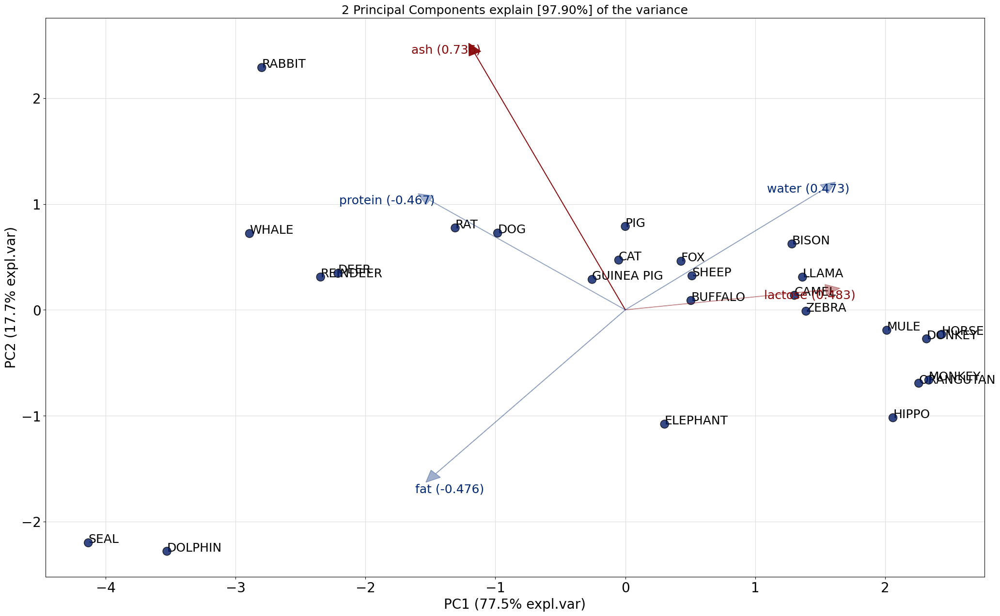

In [ ]:
model.biplot(label=True, legend = True)
for i in np.arange(0,milk.shape[0]):
    plt.text(scores.values[i,0],scores.values[i,1], list(milk.index)[i])
plt.show()

In [ ]:
cancer = pd.read_csv('/content/BreastCancer.csv', index_col=0)
print(cancer)

x = cancer.drop('Class', axis = 1)
y = cancer['Class']

          Clump  UniCell_Size  Uni_CellShape  MargAdh  SEpith  BareN  \
Code                                                                   
61634         5             4              3        1       2      2   
63375         9             1              2        6       4     10   
76389        10             4              7        2       2      8   
95719         6            10             10       10       8     10   
128059        1             1              1        1       2      5   
...         ...           ...            ...      ...     ...    ...   
1369821      10            10             10       10       5     10   
1371026       5            10             10       10       4     10   
1371920       5             1              1        1       2      1   
8233704       4             1              1        1       1      1   
13454352      1             1              3        1       2      1   

          BChromatin  NoemN  Mitoses      Class  
Code         

In [ ]:
import matplotlib.pyplot as plt
from pca import pca

scaler = StandardScaler().set_output(transform = 'pandas')
cancer_scaled = scaler.fit_transform(x)

prcomp = PCA().set_output(transform = 'pandas')
results = prcomp.fit_transform(cancer_scaled)
model.explained_variance_ratio_*100

array([65.45437483,  8.62625123,  5.98724547,  5.13612665,  4.21920122,
        3.39206535,  3.28441735,  2.91485025,  0.98546764])

<Axes: xlabel='Uni_CellShape', ylabel='SEpith'>

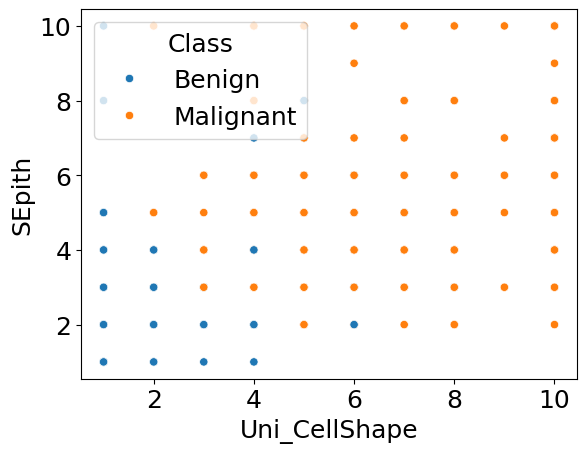

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.scatterplot(x='Uni_CellShape', y = 'SEpith', hue='Class', data = cancer)

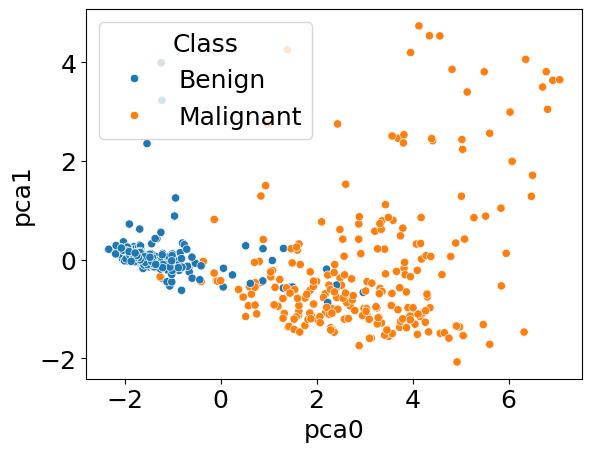

In [ ]:
df_pca = results.copy()
df_pca['Class'] = cancer['Class']
df_pca
sns.scatterplot(x='pca0', y = 'pca1', hue='Class', data = df_pca)
plt.show()

**Using with Supervised Learning**

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline


In [ ]:
X = cancer.drop('Class', axis = 1)
y = cancer['Class']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=24, test_size=0.3, stratify=y)
lr = LogisticRegression()
prcomp = PCA().set_output(transform = 'pandas')      # Here in PCA() we can pass the number of columns we want in our PCA
pipe_pca = Pipeline([('SCL',scaler),('PCA',prcomp)]) # PCA(n_components=5) this will only take the first 5 Columns
X_trn_pca = pipe_pca.fit_transform(X_train)

#Taking 6 columns from pca
lr.fit(X_trn_pca.iloc[:,:6], y_train)
X_tst_pca = pipe_pca.transform(X_test)
y_pred = lr.predict(X_tst_pca.iloc[:,:6])
print(accuracy_score(y_test, y_pred))

0.9761904761904762


In [ ]:
lr.fit(X_trn_pca.iloc[:,:7], y_train)
X_tst_pca = pipe_pca.transform(X_test)
y_pred = lr.predict(X_tst_pca.iloc[:,:7])
print(accuracy_score(y_test, y_pred))

0.9714285714285714


# **07/11/2024**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder

**Grid Search CV**

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold

In [ ]:
cancer = pd.read_csv('/content/BreastCancer.csv', index_col=0)

X = cancer.drop('Class', axis = 1)
y = cancer['Class']
# le = LabelEncoder()
# X['age'] = le.fit_transform(X['age'])
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=24, test_size=0.3, stratify=y)
scaler, prcomp, lr = StandardScaler(), PCA(), LogisticRegression()
kfold = StratifiedKFold(n_splits=5, random_state = 24, shuffle= True)
scaler, prcomp, lr = StandardScaler(), PCA(), LogisticRegression()
kfold = StratifiedKFold(n_splits=5, random_state = 24, shuffle= True)
pipe = Pipeline([('SCL',scaler),('PCA',prcomp),('LR',lr)])
params = {'PCA__n_components':[2,3,4,5,6]}
gcv = GridSearchCV(pipe, param_grid=params, cv=kfold, scoring='roc_auc' )
gcv.fit(X_train, y_train)
print(gcv.best_params_)
print(gcv.best_score_)


{'PCA__n_components': 6}
0.9953932709447415


# **Linear Discriminant Transformation**

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import roc_auc_score


In [ ]:
lda = LinearDiscriminantAnalysis()
pipe_lda = Pipeline([('LDA',lda),('LR',lr)])
pipe_lda.fit(X_train, y_train)
y_pred = pipe_lda.predict(X_test)
print(accuracy_score(y_test, y_pred))

0.9619047619047619


In [ ]:
y_pred_proba = pipe_lda.predict_proba(X_test)[:,1]
print(roc_auc_score(y_test, y_pred_proba))

0.995269726247987


# **Grid Search**

In [ ]:
kfold = StratifiedKFold(n_splits=5, random_state = 24, shuffle= True)
params = {}
gcv = GridSearchCV(pipe_lda, param_grid=params, cv=kfold, scoring='roc_auc' )
gcv.fit(X_train, y_train)
y_pred_proba = pipe_lda.predict_proba(X_test)[:,1]
print(roc_auc_score(y_test, y_pred_proba))
print(gcv.best_score_)

0.995269726247987
0.9935522504456327


In [ ]:
from sklearn.model_selection import cross_val_score
results = cross_val_score(pipe_lda, X, y, cv=kfold, scoring='roc_auc')
print(results.mean())

0.9945307446915699


**SVM (Support Vector MACHINE)**

In [ ]:
from sklearn.svm import SVC
cancer = pd.read_csv('/content/BreastCancer.csv', index_col=0)

X = cancer.drop('Class', axis = 1)
y = cancer['Class']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=24, test_size=0.3, stratify=y)
svm = SVC(kernel = 'linear', probability=True)
svm.fit(X_train, y_train)
y_pred = svm.predict(X_test)
print(accuracy_score(y_test, y_pred))

0.9714285714285714


In [ ]:
y_pred_prob = svm.predict_proba(X_test)[:,1]
print(roc_auc_score(y_test, y_pred_prob))


0.9960748792270531


Grid Search CV


In [ ]:
svm = SVC(kernel = 'linear', probability=True)
kfold = StratifiedKFold(n_splits=5, random_state = 24, shuffle= True)
params = {'C':np.linspace(0.001,5,10)}
gcv = GridSearchCV(svm, param_grid=params, cv=kfold, scoring='roc_auc' )
gcv.fit(X, y)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=24, shuffle=True),
             estimator=SVC(kernel='linear', probability=True),
             param_grid={'C': array([1.00000000e-03, 5.56444444e-01, 1.11188889e+00, 1.66733333e+00,
       2.22277778e+00, 2.77822222e+00, 3.33366667e+00, 3.88911111e+00,
       4.44455556e+00, 5.00000000e+00])},
             scoring='roc_auc')

In [ ]:
print(gcv.best_params_)
print(gcv.best_score_)

{'C': 0.001}
0.9948458438559371


with Polynomial Kernel

In [ ]:
svm = SVC(kernel = 'poly', probability=True)
svm.fit(X_train, y_train)
y_pred = svm.predict(X_test)
print(accuracy_score(y_test, y_pred))
y_pred_prob = svm.predict_proba(X_test)[:,1]
print(roc_auc_score(y_test, y_pred_prob))

0.9714285714285714
0.9974838969404187


In [ ]:
svm = SVC(kernel = 'poly', probability=True)
kfold = StratifiedKFold(n_splits=5, random_state = 24, shuffle= True)
params = {'C':np.linspace(0.001,5,10), 'degree':[2,3,4]}  # Added Degree parameters for polynomial kernel
gcv = GridSearchCV(svm, param_grid=params, cv=kfold, scoring='roc_auc' )
gcv.fit(X, y)
print(gcv.best_params_)
print(gcv.best_score_)

{'C': 0.001, 'degree': 4}
0.9946664923733468


Radial Kernel also called as Gaussian Kernel

In [ ]:
svm = SVC(kernel = 'rbf', probability=True)
svm.fit(X_train, y_train)
y_pred = svm.predict(X_test)
print(accuracy_score(y_test, y_pred))
y_pred_prob = svm.predict_proba(X_test)[:,1]
print(roc_auc_score(y_test, y_pred_prob))

0.9761904761904762
0.9911433172302737


In [ ]:
svm = SVC(kernel = 'rbf', probability=True)
kfold = StratifiedKFold(n_splits=5, random_state = 24, shuffle= True)
params = {'C':np.linspace(0.001,5,10), 'gamma':np.linspace(0.001,5,10)}  # Added Degree parameters for polynomial kernel
gcv = GridSearchCV(svm, param_grid=params, cv=kfold, scoring='roc_auc' )
gcv.fit(X, y)
print(gcv.best_params_)
print(gcv.best_score_)

{'C': 1.6673333333333331, 'gamma': 0.001}
0.9947580674649219


**HR dataset**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.svm import SVC
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer, make_column_selector
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

In [ ]:
hr = pd.read_csv('/content/HR_comma_sep.csv')
hr

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,Department,salary
0,0.38,0.53,2,157,3,0,1,0,sales,low
1,0.80,0.86,5,262,6,0,1,0,sales,medium
2,0.10,0.77,6,247,4,0,1,0,sales,low
3,0.92,0.85,5,259,5,0,1,0,sales,low
4,0.89,1.00,5,224,5,0,1,0,sales,low
...,...,...,...,...,...,...,...,...,...,...
14990,0.40,0.57,2,151,3,0,1,0,support,low
14991,0.37,0.48,2,160,3,0,1,0,support,low
14992,0.37,0.53,2,143,3,0,1,0,support,low
14993,0.11,0.96,6,280,4,0,1,0,support,low


In [ ]:
from sklearn.preprocessing import MinMaxScaler
X = hr.drop('left', axis = 1)
y = hr['left']
scaler_mm = MinMaxScaler()
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=24, test_size=0.3, stratify=y)

ohe = OneHotEncoder(sparse_output=False,drop='first').set_output(transform = 'pandas')
ct = make_column_transformer((ohe,['Department','salary']),remainder='passthrough').set_output(transform = 'pandas')
svm = SVC(kernel = 'linear', probability=True, random_state=24)
pipe = Pipeline([('CT',ct),('SCL',scaler_mm),('SVM',svm)])
pipe.fit(X_train, y_train)
y_pred = pipe.predict(X_test)
print(accuracy_score(y_test, y_pred))

0.7743943098466326


**Polynomial Kernel**

In [ ]:
svm = SVC(kernel = 'poly', probability=True,random_state=24)
kfold = StratifiedKFold(n_splits=5, random_state = 24, shuffle= True)
params = {'SVM__C':np.linspace(0.001,5,3), 'SVM__degree':[2,3]}  # Added Degree parameters for polynomial kernel
pipe = Pipeline([('CT',ct),('SCL',scaler_mm),('SVM',svm)])
# kfold = StratifiedKFold(n_splits=5, random_state = 24, shuffle= True)
gcv = GridSearchCV(pipe, param_grid=params, cv=kfold, scoring='roc_auc', verbose = 3 )
gcv.fit(X, y)
print(gcv.best_params_)
print(gcv.best_score_)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV 1/5] END .......SVM__C=0.001, SVM__degree=2;, score=0.838 total time=  53.3s
[CV 2/5] END .......SVM__C=0.001, SVM__degree=2;, score=0.826 total time=  54.8s
[CV 3/5] END .......SVM__C=0.001, SVM__degree=2;, score=0.828 total time=  54.9s
[CV 4/5] END .......SVM__C=0.001, SVM__degree=2;, score=0.814 total time= 1.1min
[CV 5/5] END .......SVM__C=0.001, SVM__degree=2;, score=0.838 total time= 1.1min
[CV 1/5] END .......SVM__C=0.001, SVM__degree=3;, score=0.833 total time=  55.5s
[CV 2/5] END .......SVM__C=0.001, SVM__degree=3;, score=0.820 total time=  35.9s
[CV 3/5] END .......SVM__C=0.001, SVM__degree=3;, score=0.815 total time=  26.6s
[CV 4/5] END .......SVM__C=0.001, SVM__degree=3;, score=0.806 total time=  28.4s
[CV 5/5] END .......SVM__C=0.001, SVM__degree=3;, score=0.824 total time=  27.6s
[CV 1/5] END SVM__C=2.5004999999999997, SVM__degree=2;, score=0.950 total time=  17.2s
[CV 2/5] END SVM__C=2.5004999999999997, SVM

**Radial Kernel**

In [ ]:
svm = SVC(kernel = 'rbf', probability=True)
kfold = StratifiedKFold(n_splits=5, random_state = 24, shuffle= True)
pipe = Pipeline([('CT',ct),('SCL',scaler_mm),('SVM',svm)])
params = {'SVM__C':np.linspace(0.001,5,3), 'SVM__gamma':np.linspace(0.001,5,3)} # Added Degree parameters for polynomial kernel
gcv = GridSearchCV(pipe, param_grid=params, cv=kfold, scoring='roc_auc' )
gcv.fit(X, y)
print(gcv.best_params_)
print(gcv.best_score_)


{'SVM__C': 5.0, 'SVM__gamma': 5.0}
0.9814093756912985


**Satellite dataset**

In [ ]:
satellite = pd.read_csv('/content/Satellite.csv', sep=';')
satellite

,x.1,x.2,x.3,x.4,x.5,x.6,x.7,x.8,x.9,x.10,...,x.28,x.29,x.30,x.31,x.32,x.33,x.34,x.35,x.36,classes
0,92,115,120,94,84,102,106,79,84,102,...,104,88,121,128,100,84,107,113,87,grey soil
1,84,102,106,79,84,102,102,83,80,102,...,100,84,107,113,87,84,99,104,79,grey soil
2,84,102,102,83,80,102,102,79,84,94,...,87,84,99,104,79,84,99,104,79,grey soil
3,80,102,102,79,84,94,102,79,80,94,...,79,84,99,104,79,84,103,104,79,grey soil
4,84,94,102,79,80,94,98,76,80,102,...,79,84,103,104,79,79,107,109,87,grey soil
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6430,60,83,96,85,64,87,100,88,64,83,...,92,66,87,108,89,63,83,104,85,red soil
6431,64,79,100,85,56,71,96,85,56,68,...,85,66,83,100,85,63,83,100,81,red soil
6432,56,68,91,81,56,64,91,81,53,64,...,81,59,87,96,81,63,83,92,74,vegetation stubble
6433,56,68,87,74,60,71,91,81,60,64,...,74,59,83,92,74,59,83,92,70,vegetation stubble


In [ ]:
X = satellite.drop('classes', axis =1)
y = satellite['classes']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=24, test_size=0.3, stratify=y)

**Linear Kernel**

In [ ]:
svm = SVC(kernel = 'linear', probability=True, random_state=24, decision_function_shape='ovo')  # By default it is ovr
scaler_mm = MinMaxScaler()
pipe = Pipeline([('SCL',scaler_mm),('SVM',svm)])
pipe.fit(X_train, y_train)
y_pred = pipe.predict(X_test)
print(accuracy_score(y_test, y_pred))

0.865872604867944


In [ ]:
from sklearn.metrics import log_loss
y_pred_prob = pipe.predict_proba(X_test)
print(log_loss(y_test, y_pred_prob))

0.35710642766208833


**GridSearch CV linear**

In [ ]:
svm = SVC(kernel = 'linear', probability=True, random_state=24)
pipe = Pipeline([('SCL',scaler_mm),('SVM',svm)])
kfold = StratifiedKFold(n_splits=5, random_state = 24, shuffle= True)
params = {'SVM__C':np.linspace(0.001,5,3),
          'SVM__decision_function_shape':['ovo','ovr']}
gcv = GridSearchCV(pipe, param_grid=params, cv=kfold, scoring='neg_log_loss', verbose = 3 )
gcv.fit(X, y)


Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV 1/5] END SVM__C=0.001, SVM__decision_function_shape=ovo;, score=-0.487 total time=  14.0s
[CV 2/5] END SVM__C=0.001, SVM__decision_function_shape=ovo;, score=-0.492 total time=  14.8s
[CV 3/5] END SVM__C=0.001, SVM__decision_function_shape=ovo;, score=-0.526 total time=  13.9s
[CV 4/5] END SVM__C=0.001, SVM__decision_function_shape=ovo;, score=-0.497 total time=  11.7s
[CV 5/5] END SVM__C=0.001, SVM__decision_function_shape=ovo;, score=-0.472 total time=   7.2s
[CV 1/5] END SVM__C=0.001, SVM__decision_function_shape=ovr;, score=-0.487 total time=   6.4s
[CV 2/5] END SVM__C=0.001, SVM__decision_function_shape=ovr;, score=-0.492 total time=   7.9s
[CV 3/5] END SVM__C=0.001, SVM__decision_function_shape=ovr;, score=-0.526 total time=   6.0s
[CV 4/5] END SVM__C=0.001, SVM__decision_function_shape=ovr;, score=-0.497 total time=   8.4s
[CV 5/5] END SVM__C=0.001, SVM__decision_function_shape=ovr;, score=-0.472 total time=   6.0s


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=24, shuffle=True),
             estimator=Pipeline(steps=[('SCL', MinMaxScaler()),
                                       ('SVM',
                                        SVC(kernel='linear', probability=True,
                                            random_state=24))]),
             param_grid={'SVM__C': array([1.0000e-03, 2.5005e+00, 5.0000e+00]),
                         'SVM__decision_function_shape': ['ovo', 'ovr']},
             scoring='neg_log_loss', verbose=3)

In [ ]:
print(gcv.best_params_)
print(gcv.best_score_)

{'SVM__C': 5.0, 'SVM__decision_function_shape': 'ovo'}
-0.33206246909822645


In [ ]:
svm = SVC(kernel = 'rbf', probability=True)
kfold = StratifiedKFold(n_splits=5, random_state = 24, shuffle= True)
pipe = Pipeline([('SCL',scaler_mm),('SVM',svm)])
params = {'SVM__C':np.linspace(0.001,5,3),
          'SVM__gamma':np.linspace(0.001,5,3),
          'SVM__decision_function_shape':['ovo','ovr']} # Added Degree parameters for polynomial kernel
gcv = GridSearchCV(pipe, param_grid=params, cv=kfold, scoring='neg_log_loss', verbose = 3  )
gcv.fit(X, y)
print(gcv.best_params_)
print(gcv.best_score_)


Fitting 5 folds for each of 18 candidates, totalling 90 fits
[CV 1/5] END SVM__C=0.001, SVM__decision_function_shape=ovo, SVM__gamma=0.001;, score=-0.878 total time=  24.8s
[CV 2/5] END SVM__C=0.001, SVM__decision_function_shape=ovo, SVM__gamma=0.001;, score=-0.819 total time=  21.8s
[CV 3/5] END SVM__C=0.001, SVM__decision_function_shape=ovo, SVM__gamma=0.001;, score=-0.879 total time=  33.1s
[CV 4/5] END SVM__C=0.001, SVM__decision_function_shape=ovo, SVM__gamma=0.001;, score=-0.872 total time=  17.9s
[CV 5/5] END SVM__C=0.001, SVM__decision_function_shape=ovo, SVM__gamma=0.001;, score=-0.849 total time=  12.5s
[CV 1/5] END SVM__C=0.001, SVM__decision_function_shape=ovo, SVM__gamma=2.5004999999999997;, score=-0.629 total time=  12.6s
[CV 2/5] END SVM__C=0.001, SVM__decision_function_shape=ovo, SVM__gamma=2.5004999999999997;, score=-0.652 total time=  12.7s
[CV 3/5] END SVM__C=0.001, SVM__decision_function_shape=ovo, SVM__gamma=2.5004999999999997;, score=-0.623 total time=  12.9s
[CV 

# **Decision Tree**

In [ ]:
cancer = pd.read_csv('/content/BreastCancer.csv', index_col=0)

X = cancer.drop('Class', axis = 1)
y = cancer['Class']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=24, test_size=0.3, stratify=y)

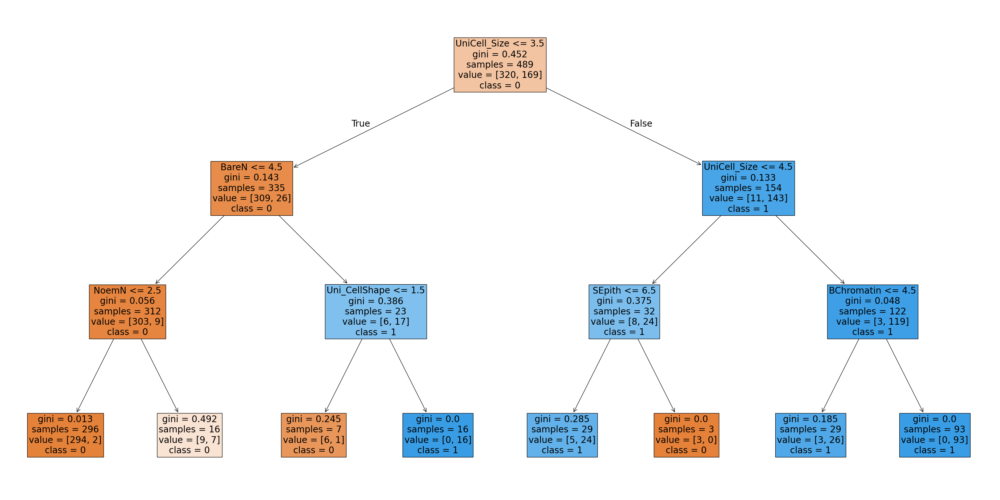

0.9571428571428572


In [ ]:
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree
from sklearn.metrics import accuracy_score
dtc = DecisionTreeClassifier(random_state=24, max_depth=3)
dtc.fit(X_train, y_train)
plt.figure(figsize=(40,20))
plot_tree(dtc, feature_names = list(X.columns), class_names=['0','1'], filled=True, fontsize = 20)
plt.show()
y_pred = dtc.predict(X_test)
print(accuracy_score(y_test, y_pred))

In [ ]:
y_pred_prob = dtc.predict_proba(X_test)[:,1]
print(roc_auc_score(y_test, y_pred_prob))

0.9570249597423512


Grid Search CV

In [ ]:
dtc = DecisionTreeClassifier(random_state=24)
params = {'max_depth':[2,3,4,5,6,None]}
kfold = StratifiedKFold(n_splits=5, random_state = 24, shuffle= True)
gcv = GridSearchCV(dtc, param_grid=params, cv=kfold, scoring='roc_auc' )
gcv.fit(X, y)
print(gcv.best_params_)
print(gcv.best_score_)

{'max_depth': 4}
0.9653115056342652


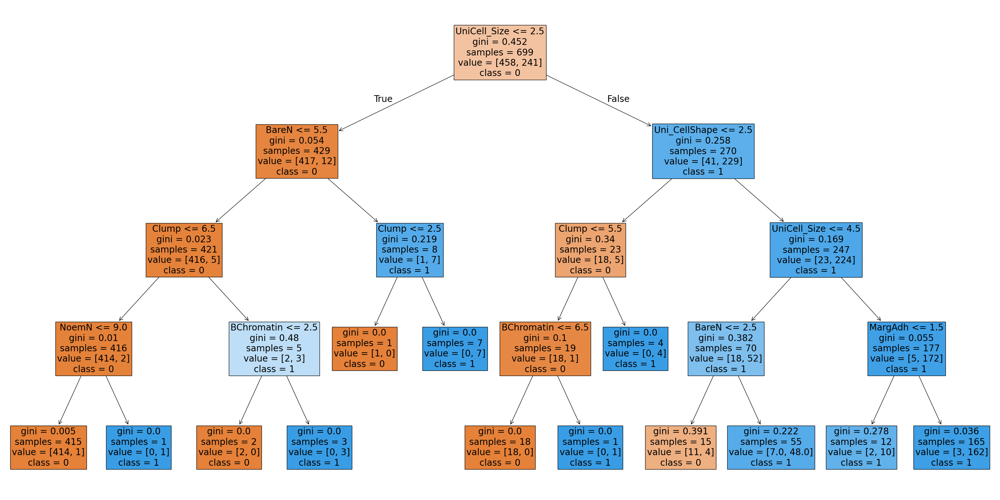

In [ ]:
best_tree = gcv.best_estimator_
plt.figure(figsize=(40,20))
plot_tree(best_tree, feature_names = list(X.columns), class_names=['0','1'], filled=True, fontsize = 20)
plt.show()

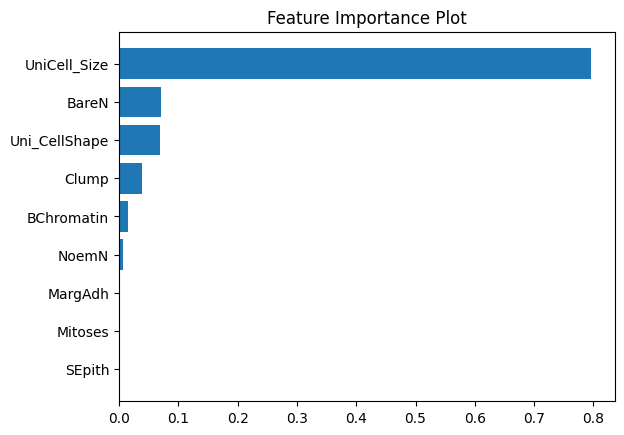

In [ ]:
df_imp = pd.DataFrame({'fearture' :list(X.columns), 'importance': best_tree.feature_importances_})
df_imp.sort_values('importance', inplace=True)
plt.barh(df_imp['fearture'], df_imp['importance'])
plt.title('Feature Importance Plot')
plt.show()

# **8/11/2024**

Hr Dataset

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import plot_tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer, make_column_selector

In [ ]:
hr = pd.read_csv('/content/HR_comma_sep.csv')
hr

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,Department,salary
0,0.38,0.53,2,157,3,0,1,0,sales,low
1,0.80,0.86,5,262,6,0,1,0,sales,medium
2,0.10,0.77,6,247,4,0,1,0,sales,low
3,0.92,0.85,5,259,5,0,1,0,sales,low
4,0.89,1.00,5,224,5,0,1,0,sales,low
...,...,...,...,...,...,...,...,...,...,...
14990,0.40,0.57,2,151,3,0,1,0,support,low
14991,0.37,0.48,2,160,3,0,1,0,support,low
14992,0.37,0.53,2,143,3,0,1,0,support,low
14993,0.11,0.96,6,280,4,0,1,0,support,low


In [ ]:
hr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14995 entries, 0 to 14994
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   satisfaction_level     14995 non-null  float64
 1   last_evaluation        14995 non-null  float64
 2   number_project         14995 non-null  int64  
 3   average_montly_hours   14995 non-null  int64  
 4   time_spend_company     14995 non-null  int64  
 5   Work_accident          14995 non-null  int64  
 6   left                   14995 non-null  int64  
 7   promotion_last_5years  14995 non-null  int64  
 8   Department             14995 non-null  object 
 9   salary                 14995 non-null  object 
dtypes: float64(2), int64(6), object(2)
memory usage: 1.1+ MB


In [ ]:
X= hr.drop('left', axis = 1)
y = hr['left']
# X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=24, test_size=0.3, stratify=y)

In [ ]:
dtc = DecisionTreeClassifier(random_state=24)
ohe = OneHotEncoder(sparse_output=False,drop='first').set_output(transform = 'pandas')
ct = make_column_transformer(('passthrough', make_column_selector(dtype_exclude=object)),
                            (ohe, make_column_selector(dtype_include=object))).set_output(transform = 'pandas')
pipe = Pipeline([('CT',ct),('DT',dtc)])

In [ ]:
params = {'DT__min_samples_split':[2,10,25,50],
          'DT__min_samples_leaf':[1,10,25,50],
          'DT__max_depth':[None,4,6]}
kfold = StratifiedKFold(n_splits=5, random_state = 24, shuffle= True)
gcv = GridSearchCV(pipe, param_grid=params, cv=kfold, scoring='roc_auc' ,verbose = 3)
gcv.fit(X, y)
print(gcv.best_params_)
print(gcv.best_score_)

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV 1/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=2;, score=0.977 total time=   0.1s
[CV 2/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=2;, score=0.972 total time=   0.1s
[CV 3/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=2;, score=0.972 total time=   0.1s
[CV 4/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=2;, score=0.976 total time=   0.1s
[CV 5/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=2;, score=0.978 total time=   0.1s
[CV 1/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=10;, score=0.985 total time=   0.1s
[CV 2/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=10;, score=0.979 total time=   0.1s
[CV 3/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=10;, score=0.980 total time=   0.1s
[CV 4/5] END DT__max_de

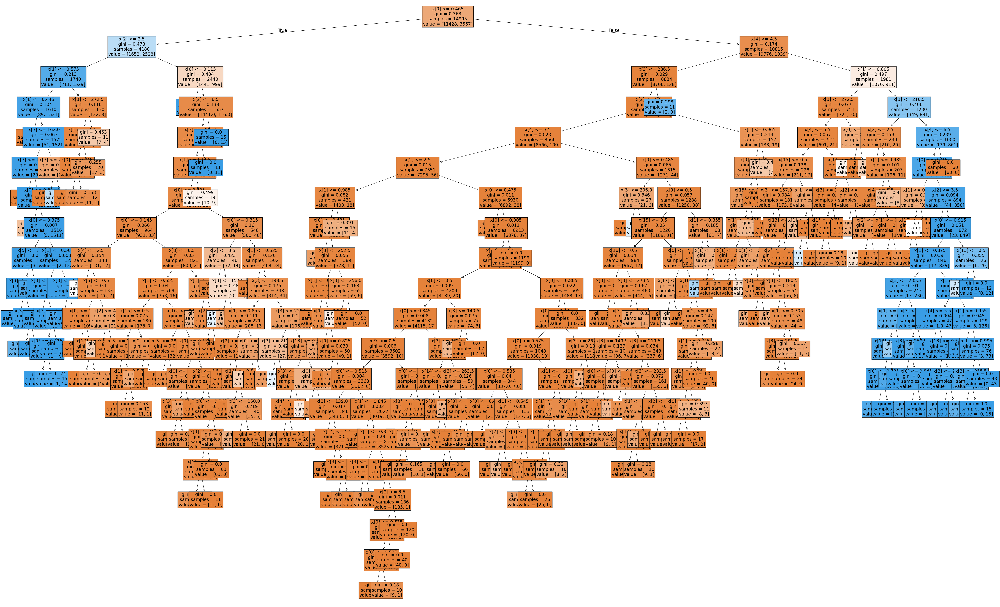

In [ ]:
#Best Tree
best_tree = gcv.best_estimator_.named_steps['DT']
plt.figure(figsize=(80,50))
plot_tree(best_tree, filled=True, fontsize = 20)
plt.show()


In [ ]:
gcv.best_estimator_.named_steps['DT'].feature_importances_

array([5.21808499e-01, 1.46190125e-01, 1.06596857e-01, 7.27943172e-02,
       1.48799111e-01, 3.09761644e-04, 3.66928161e-05, 0.00000000e+00,
       1.10537168e-04, 1.75279213e-04, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 1.07647189e-03, 1.22805395e-04, 9.04012321e-04,
       5.41919537e-04, 5.33609873e-04])

In [ ]:
feature_name = gcv.best_estimator_.named_steps['CT'].get_feature_names_out()
feature_name

array(['passthrough__satisfaction_level', 'passthrough__last_evaluation',
       'passthrough__number_project', 'passthrough__average_montly_hours',
       'passthrough__time_spend_company', 'passthrough__Work_accident',
       'passthrough__promotion_last_5years',
       'onehotencoder__Department_RandD',
       'onehotencoder__Department_accounting',
       'onehotencoder__Department_hr',
       'onehotencoder__Department_management',
       'onehotencoder__Department_marketing',
       'onehotencoder__Department_product_mng',
       'onehotencoder__Department_sales',
       'onehotencoder__Department_support',
       'onehotencoder__Department_technical', 'onehotencoder__salary_low',
       'onehotencoder__salary_medium'], dtype=object)

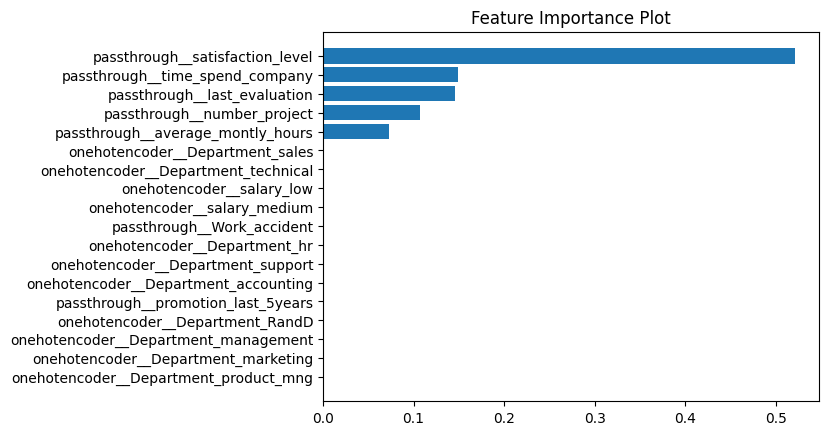

In [ ]:
df_imp = pd.DataFrame({'fearture' :list(feature_name), 'importance': best_tree.feature_importances_})
df_imp.sort_values('importance', inplace=True)
plt.barh(df_imp['fearture'], df_imp['importance'])
plt.title('Feature Importance Plot')
plt.show()

Sattelite dataset

In [ ]:
satelite = pd.read_csv('/content/Satellite.csv', sep=';')
satelite.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 37 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   x.1      6435 non-null   int64 
 1   x.2      6435 non-null   int64 
 2   x.3      6435 non-null   int64 
 3   x.4      6435 non-null   int64 
 4   x.5      6435 non-null   int64 
 5   x.6      6435 non-null   int64 
 6   x.7      6435 non-null   int64 
 7   x.8      6435 non-null   int64 
 8   x.9      6435 non-null   int64 
 9   x.10     6435 non-null   int64 
 10  x.11     6435 non-null   int64 
 11  x.12     6435 non-null   int64 
 12  x.13     6435 non-null   int64 
 13  x.14     6435 non-null   int64 
 14  x.15     6435 non-null   int64 
 15  x.16     6435 non-null   int64 
 16  x.17     6435 non-null   int64 
 17  x.18     6435 non-null   int64 
 18  x.19     6435 non-null   int64 
 19  x.20     6435 non-null   int64 
 20  x.21     6435 non-null   int64 
 21  x.22     6435 non-null   int64 
 22  

In [ ]:
X= satelite.drop('classes', axis = 1)
y = satelite['classes']

dtc = DecisionTreeClassifier(random_state=24)
ohe = OneHotEncoder(sparse_output=False,drop='first').set_output(transform = 'pandas')
ct = make_column_transformer(('passthrough', make_column_selector(dtype_exclude=object)),
                            (ohe, make_column_selector(dtype_include=object))).set_output(transform = 'pandas')
pipe = Pipeline([('CT',ct),('DT',dtc)])

In [ ]:
import warnings
warnings.filterwarnings('ignore')
params = {'DT__min_samples_split':[2,10,25,50],
          'DT__min_samples_leaf':[1,10,25,50],
          'DT__max_depth':[None,4,6]}
kfold = StratifiedKFold(n_splits=5, random_state = 24, shuffle= True)
gcv = GridSearchCV(pipe, param_grid=params, cv=kfold, scoring='neg_log_loss' ,verbose = 3)
gcv.fit(X, y)
print(gcv.best_params_)
print(gcv.best_score_)

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV 1/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=2;, score=-5.349 total time=   0.2s
[CV 2/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=2;, score=-4.817 total time=   0.3s
[CV 3/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=2;, score=-5.573 total time=   0.2s
[CV 4/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=2;, score=-5.265 total time=   0.3s
[CV 5/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=2;, score=-5.293 total time=   0.3s
[CV 1/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=10;, score=-3.915 total time=   0.3s
[CV 2/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=10;, score=-3.512 total time=   0.2s
[CV 3/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=10;, score=-4.375 total time=   0.3s
[CV 4/5] END DT

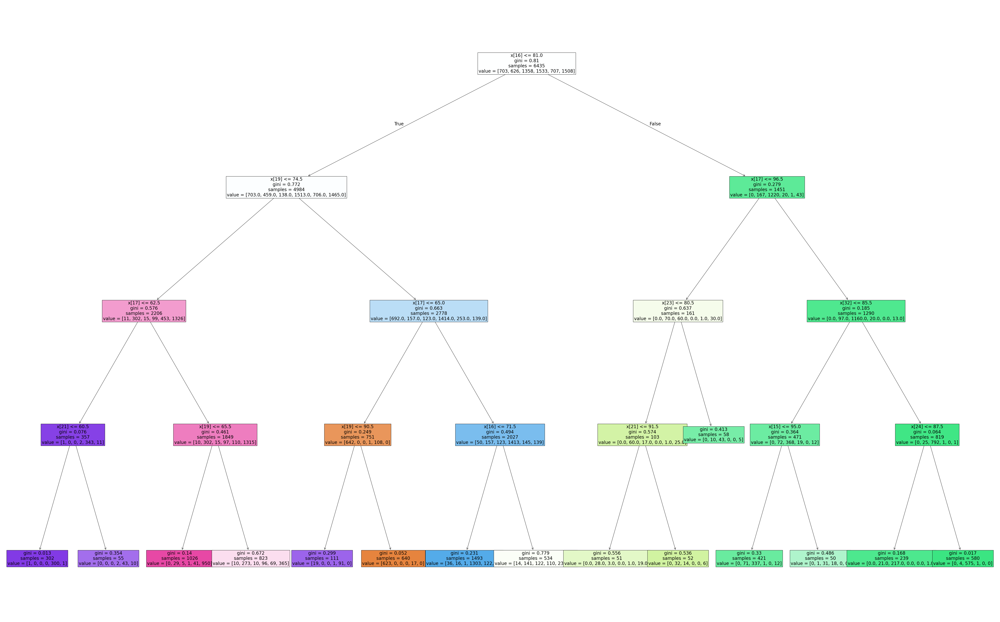

In [ ]:
#Best Tree
best_tree = gcv.best_estimator_.named_steps['DT']
plt.figure(figsize=(80,50))
plot_tree(best_tree, filled=True, fontsize = 20)
plt.show()

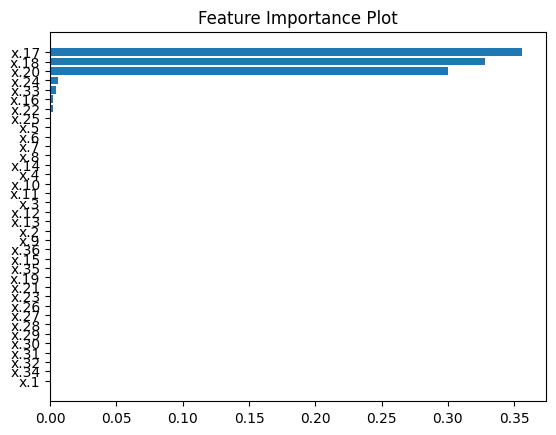

In [ ]:
df_imp = pd.DataFrame({'fearture' :list(X.columns), 'importance': best_tree.feature_importances_})
df_imp.sort_values('importance', inplace=True)
plt.barh(df_imp['fearture'], df_imp['importance'])
plt.title('Feature Importance Plot')
plt.show()

**Decision Tree Regressor**

Concerete Dataset

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import plot_tree
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, r2_score
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold, KFold
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer, make_column_selector


In [ ]:
concrete = pd.read_csv('/content/Concrete_Data.csv')
X = concrete.drop('Strength', axis=1)
y = concrete['Strength']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=24, test_size=0.3)

In [ ]:
dtr = DecisionTreeRegressor(random_state=24)
dtr.fit(X_train, y_train)
y_pred = dtr.predict(X_test)
print(r2_score(y_test, y_pred))

0.83089474226832


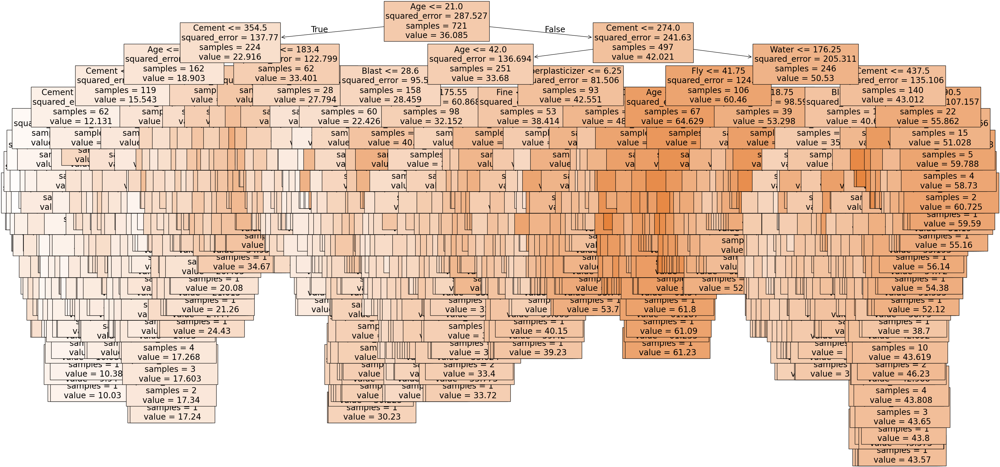

In [ ]:
plt.figure(figsize=(40,20))
plot_tree(dtr, feature_names = list(X.columns), filled=True, fontsize = 20)
plt.show()

**Grid Search**

In [ ]:
params = {'min_samples_split':[2,10,25,50],
          'min_samples_leaf':[1,10,25,50],
          'max_depth':[None,4,6]}
kfold = KFold(n_splits=5, random_state = 24, shuffle= True)
gcv = GridSearchCV(dtr, param_grid=params, cv=kfold, scoring='r2' ,verbose = 3)
gcv.fit(X,y)

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV 1/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2;, score=0.893 total time=   0.0s
[CV 2/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2;, score=0.798 total time=   0.0s
[CV 3/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2;, score=0.883 total time=   0.0s
[CV 4/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2;, score=0.792 total time=   0.0s
[CV 5/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2;, score=0.876 total time=   0.0s
[CV 1/5] END max_depth=None, min_samples_leaf=1, min_samples_split=10;, score=0.872 total time=   0.0s
[CV 2/5] END max_depth=None, min_samples_leaf=1, min_samples_split=10;, score=0.786 total time=   0.0s
[CV 3/5] END max_depth=None, min_samples_leaf=1, min_samples_split=10;, score=0.883 total time=   0.0s
[CV 4/5] END max_depth=None, min_samples_leaf=1, min_samples_split=10;, score=0.811 total time=   0.0s
[CV 5/5] END max

GridSearchCV(cv=KFold(n_splits=5, random_state=24, shuffle=True),
             estimator=DecisionTreeRegressor(random_state=24),
             param_grid={'max_depth': [None, 4, 6],
                         'min_samples_leaf': [1, 10, 25, 50],
                         'min_samples_split': [2, 10, 25, 50]},
             scoring='r2', verbose=3)

In [ ]:
print(gcv.best_params_)
print(gcv.best_score_)

{'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2}
0.8484186724203081


In [ ]:
best_tree = gcv.best_estimator_


array([0.36212703, 0.11167512, 0.01174962, 0.11159204, 0.02560131,
       0.03088099, 0.02427884, 0.32209506])

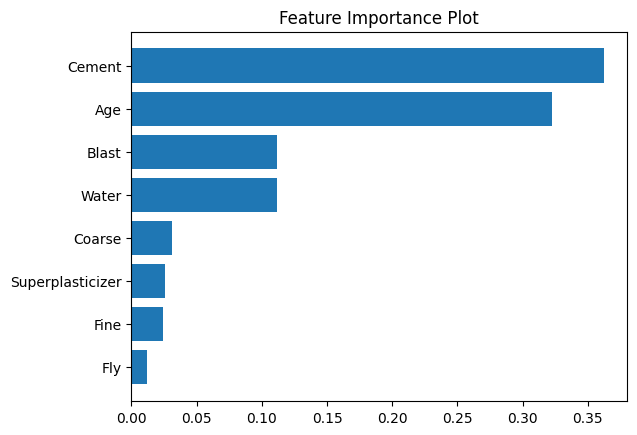

In [ ]:
df_imp = pd.DataFrame({'fearture' :list(X.columns), 'importance': best_tree.feature_importances_})
df_imp.sort_values('importance', inplace=True)
plt.barh(df_imp['fearture'], df_imp['importance'])
plt.title('Feature Importance Plot')
plt.show()

**Insurance dataset**

In [ ]:
insurance = pd.read_csv('/content/insurance.csv')
insurance

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520
...,...,...,...,...,...,...,...
1333,50,male,30.970,3,no,northwest,10600.54830
1334,18,female,31.920,0,no,northeast,2205.98080
1335,18,female,36.850,0,no,southeast,1629.83350
1336,21,female,25.800,0,no,southwest,2007.94500


In [ ]:
insurance.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       1338 non-null   int64  
 1   sex       1338 non-null   object 
 2   bmi       1338 non-null   float64
 3   children  1338 non-null   int64  
 4   smoker    1338 non-null   object 
 5   region    1338 non-null   object 
 6   charges   1338 non-null   float64
dtypes: float64(2), int64(2), object(3)
memory usage: 73.3+ KB


In [ ]:
from sklearn.tree import DecisionTreeRegressor
X = insurance.drop('charges', axis = 1)
y = insurance['charges']

dtr = DecisionTreeRegressor(random_state=24)
ohe = OneHotEncoder(sparse_output=False,drop='first').set_output(transform = 'pandas')
ct = make_column_transformer(('passthrough', make_column_selector(dtype_exclude=object)),
                            (ohe, make_column_selector(dtype_include=object)),
                              verbose_feature_names_out=False).set_output(transform = 'pandas')
pipe = Pipeline([('CT',ct),('DT',dtr)])

In [ ]:
import warnings
warnings.filterwarnings('ignore')
params = {'DT__min_samples_split':[2,10,25,50],
          'DT__min_samples_leaf':[1,10,25,50],
          'DT__max_depth':[None,4,6]}
kfold = KFold(n_splits=5, random_state = 24, shuffle= True)
gcv = GridSearchCV(pipe, param_grid=params, cv=kfold, scoring='r2' ,verbose = 3)
gcv.fit(X, y)
print(gcv.best_params_)
print(gcv.best_score_)

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV 1/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=2;, score=0.769 total time=   0.1s
[CV 2/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=2;, score=0.658 total time=   0.1s
[CV 3/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=2;, score=0.711 total time=   0.0s
[CV 4/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=2;, score=0.768 total time=   0.0s
[CV 5/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=2;, score=0.741 total time=   0.1s
[CV 1/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=10;, score=0.831 total time=   0.0s
[CV 2/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=10;, score=0.767 total time=   0.0s
[CV 3/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=10;, score=0.761 total time=   0.1s
[CV 4/5] END DT__max_de

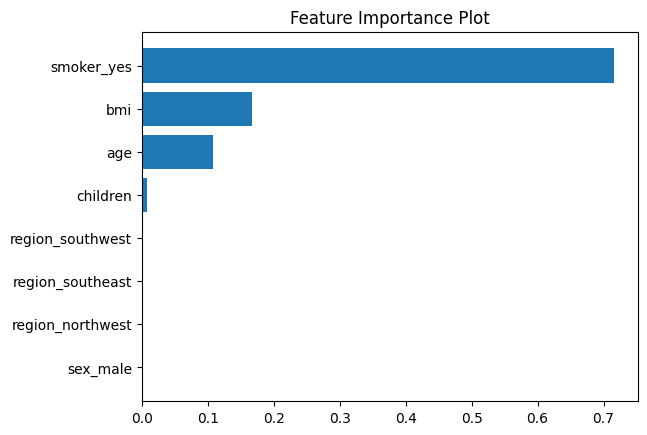

In [ ]:
best_tree = gcv.best_estimator_.named_steps['DT']
df_imp = pd.DataFrame({'fearture' :list(gcv.best_estimator_.named_steps['CT'].get_feature_names_out()), 'importance': best_tree.feature_importances_})
df_imp.sort_values('importance', inplace=True)
plt.barh(df_imp['fearture'], df_imp['importance'])
plt.title('Feature Importance Plot')
plt.show()

**Regression with a Mohs Hardness Dataset From Kaggle**

In [ ]:
train_df = pd.read_csv('/content/train.csv', index_col=0)
test_df = pd.read_csv('/content/test.csv', index_col=0)
train_df.isnull().sum()
test_df.isnull().sum()


,0
allelectrons_Total,0
density_Total,0
allelectrons_Average,0
val_e_Average,0
atomicweight_Average,0
ionenergy_Average,0
el_neg_chi_Average,0
R_vdw_element_Average,0
R_cov_element_Average,0
zaratio_Average,0


In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10407 entries, 0 to 10406
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   allelectrons_Total     10407 non-null  float64
 1   density_Total          10407 non-null  float64
 2   allelectrons_Average   10407 non-null  float64
 3   val_e_Average          10407 non-null  float64
 4   atomicweight_Average   10407 non-null  float64
 5   ionenergy_Average      10407 non-null  float64
 6   el_neg_chi_Average     10407 non-null  float64
 7   R_vdw_element_Average  10407 non-null  float64
 8   R_cov_element_Average  10407 non-null  float64
 9   zaratio_Average        10407 non-null  float64
 10  density_Average        10407 non-null  float64
 11  Hardness               10407 non-null  float64
dtypes: float64(12)
memory usage: 1.0 MB


In [ ]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6939 entries, 10407 to 17345
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   allelectrons_Total     6939 non-null   float64
 1   density_Total          6939 non-null   float64
 2   allelectrons_Average   6939 non-null   float64
 3   val_e_Average          6939 non-null   float64
 4   atomicweight_Average   6939 non-null   float64
 5   ionenergy_Average      6939 non-null   float64
 6   el_neg_chi_Average     6939 non-null   float64
 7   R_vdw_element_Average  6939 non-null   float64
 8   R_cov_element_Average  6939 non-null   float64
 9   zaratio_Average        6939 non-null   float64
 10  density_Average        6939 non-null   float64
dtypes: float64(11)
memory usage: 650.5 KB


In [ ]:
X = train_df.drop('Hardness', axis=1)
y = train_df['Hardness']

In [ ]:
dtr = DecisionTreeRegressor(random_state=24)
params = {'min_samples_split':[2,10,25,50],
          'min_samples_leaf':[1,10,25,50],
          'max_depth':[None,4,6]}
kfold = KFold(n_splits=5, random_state = 24, shuffle= True)
gcv = GridSearchCV(dtr, param_grid=params, cv=kfold, scoring='r2' ,verbose = 3)
gcv.fit(X,y)

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV 1/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2;, score=-0.052 total time=   0.4s
[CV 2/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2;, score=-0.117 total time=   0.4s
[CV 3/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2;, score=-0.058 total time=   0.4s
[CV 4/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2;, score=-0.080 total time=   0.3s
[CV 5/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2;, score=-0.086 total time=   0.3s
[CV 1/5] END max_depth=None, min_samples_leaf=1, min_samples_split=10;, score=0.091 total time=   0.2s
[CV 2/5] END max_depth=None, min_samples_leaf=1, min_samples_split=10;, score=0.049 total time=   0.2s
[CV 3/5] END max_depth=None, min_samples_leaf=1, min_samples_split=10;, score=0.065 total time=   0.2s
[CV 4/5] END max_depth=None, min_samples_leaf=1, min_samples_split=10;, score=0.069 total time=   0.2s
[CV 5/5] EN

GridSearchCV(cv=KFold(n_splits=5, random_state=24, shuffle=True),
             estimator=DecisionTreeRegressor(random_state=24),
             param_grid={'max_depth': [None, 4, 6],
                         'min_samples_leaf': [1, 10, 25, 50],
                         'min_samples_split': [2, 10, 25, 50]},
             scoring='r2', verbose=3)

In [ ]:
print(gcv.best_params_)
print(gcv.best_score_)

{'max_depth': None, 'min_samples_leaf': 50, 'min_samples_split': 2}
0.39799384830214196


In [ ]:
y_pred = gcv.predict(test_df)


In [ ]:
submit = pd.read_csv('/content/sample_submission.csv')
submit['Hardness']=y_pred
submit.to_csv('submission_moh.csv', index=False)

**Voting Classifier**

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import OneHotEncoder
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import roc_auc_score
from sklearn.compose import make_column_transformer, make_column_selector
import warnings
warnings.filterwarnings('ignore')


In [ ]:
cancer = pd.read_csv('/content/BreastCancer.csv', index_col=0)
X = cancer.drop('Class', axis = 1)
y = cancer['Class']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=24, test_size=0.3, stratify=y)


In [ ]:
dtc = DecisionTreeClassifier(random_state=24)
lr = LogisticRegression(random_state=24)
nb = GaussianNB()
voting = VotingClassifier([('DT', dtc), ('LR', lr), ('NB', nb)]) # Just same like Pipeline, but here it won't predict for every algorithm
                                                                # one by one, if we want, we can do that, but that not needed, instead
                                                                #of that we can directly use, voting.fit() and voting.predict()
voting.fit(X_train, y_train)          # By default voting = Hard
y_pred = voting.predict(X_test)
print(accuracy_score(y_test, y_pred))

0.9666666666666667


In [ ]:
# y_pred_prob = voting.predict_proba(X_test)[:,1]
# print(roc_auc_score(y_test, y_pred_prob))                  Hard voting do not have predict_proba

In [ ]:
voting = VotingClassifier([('DT', dtc), ('LR', lr), ('NB', nb)], voting='soft')
voting.fit(X_train, y_train)
y_pred = voting.predict(X_test)
print(accuracy_score(y_test, y_pred))

0.9666666666666667


In [ ]:
y_pred_prob = voting.predict_proba(X_test)[:,1]
print(roc_auc_score(y_test, y_pred_prob))

0.9951690821256038


Grid Search

In [ ]:
params = {'DT__min_samples_split':[2,10,20],
          'DT__min_samples_leaf':[1,10,20],
          'DT__max_depth':[None,2,3],
          'LR__C':np.linspace(0.001,3,5)}
kfold = StratifiedKFold(n_splits=5, random_state = 24, shuffle= True)
gcv = GridSearchCV(voting, param_grid=params, cv=kfold, scoring='roc_auc' ,verbose = 3)
gcv.fit(X,y)

Fitting 5 folds for each of 135 candidates, totalling 675 fits
[CV 1/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=2, LR__C=0.001;, score=0.997 total time=   0.1s
[CV 2/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=2, LR__C=0.001;, score=0.995 total time=   0.1s
[CV 3/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=2, LR__C=0.001;, score=0.994 total time=   0.0s
[CV 4/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=2, LR__C=0.001;, score=0.990 total time=   0.0s
[CV 5/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=2, LR__C=0.001;, score=0.993 total time=   0.1s
[CV 1/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=2, LR__C=0.75075;, score=0.995 total time=   0.1s
[CV 2/5] END DT__max_depth=None, DT__min_samples_leaf=1, DT__min_samples_split=2, LR__C=0.75075;, score=0.995 total time=   0.1s
[CV 3/5] END DT__max_depth=None, DT__min_sam

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=24, shuffle=True),
             estimator=VotingClassifier(estimators=[('DT',
                                                     DecisionTreeClassifier(random_state=24)),
                                                    ('LR',
                                                     LogisticRegression(random_state=24)),
                                                    ('NB', GaussianNB())],
                                        voting='soft'),
             param_grid={'DT__max_depth': [None, 2, 3],
                         'DT__min_samples_leaf': [1, 10, 20],
                         'DT__min_samples_split': [2, 10, 20],
                         'LR__C': array([1.00000e-03, 7.50750e-01, 1.50050e+00, 2.25025e+00, 3.00000e+00])},
             scoring='roc_auc', verbose=3)

In [ ]:
print(gcv.best_params_)
print(gcv.best_score_)

{'DT__max_depth': None, 'DT__min_samples_leaf': 1, 'DT__min_samples_split': 2, 'LR__C': 0.001}
0.9937986416496842


HR Analytics Dataset

In [ ]:
hr = pd.read_csv('/content/HR_comma_sep.csv')
hr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14995 entries, 0 to 14994
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   satisfaction_level     14995 non-null  float64
 1   last_evaluation        14995 non-null  float64
 2   number_project         14995 non-null  int64  
 3   average_montly_hours   14995 non-null  int64  
 4   time_spend_company     14995 non-null  int64  
 5   Work_accident          14995 non-null  int64  
 6   left                   14995 non-null  int64  
 7   promotion_last_5years  14995 non-null  int64  
 8   Department             14995 non-null  object 
 9   salary                 14995 non-null  object 
dtypes: float64(2), int64(6), object(2)
memory usage: 1.1+ MB


In [ ]:
X = hr.drop('left', axis = 1)
y = hr['left']


In [ ]:
ohe = OneHotEncoder(sparse_output=False,drop='first').set_output(transform = 'pandas')
ct = make_column_transformer(('passthrough', make_column_selector(dtype_exclude=object)),
                            (ohe, make_column_selector(dtype_include=object))).set_output(transform = 'pandas')

In [ ]:
dtc = DecisionTreeClassifier(random_state=24)
lr = LogisticRegression(random_state=24)
nb = GaussianNB()

voting = VotingClassifier([('DT', dtc), ('LR', lr), ('NB', nb)], voting='soft')
pipe = Pipeline([('CT',ct),('vote',voting)])
kfold = StratifiedKFold(n_splits=5, random_state = 24, shuffle= True)


In [ ]:
pipe.get_params()

{'memory': None,
 'steps': [('CT',
   ColumnTransformer(transformers=[('passthrough', 'passthrough',
                                    <sklearn.compose._column_transformer.make_column_selector object at 0x78d69b39df00>),
                                   ('onehotencoder',
                                    OneHotEncoder(drop='first',
                                                  sparse_output=False),
                                    <sklearn.compose._column_transformer.make_column_selector object at 0x78d69b39df30>)])),
  ('vote',
   VotingClassifier(estimators=[('DT', DecisionTreeClassifier(random_state=24)),
                                ('LR', LogisticRegression(random_state=24)),
                                ('NB', GaussianNB())],
                    voting='soft'))],
 'verbose': False,
 'CT': ColumnTransformer(transformers=[('passthrough', 'passthrough',
                                  <sklearn.compose._column_transformer.make_column_selector object at 0x78d69b39

In [ ]:
params = {'vote__DT__min_samples_split':[2,10,20],
          'vote__DT__min_samples_leaf':[1,10,20],
          'vote__DT__max_depth':[None,2,3],
          'vote__LR__C':np.linspace(0.001,3,5)}
gcv = GridSearchCV(pipe, param_grid=params, cv=kfold, scoring='roc_auc' ,verbose = 3)
gcv.fit(X,y)

Fitting 5 folds for each of 135 candidates, totalling 675 fits
[CV 1/5] END vote__DT__max_depth=None, vote__DT__min_samples_leaf=1, vote__DT__min_samples_split=2, vote__LR__C=0.001;, score=0.986 total time=   0.6s
[CV 2/5] END vote__DT__max_depth=None, vote__DT__min_samples_leaf=1, vote__DT__min_samples_split=2, vote__LR__C=0.001;, score=0.978 total time=   0.5s
[CV 3/5] END vote__DT__max_depth=None, vote__DT__min_samples_leaf=1, vote__DT__min_samples_split=2, vote__LR__C=0.001;, score=0.978 total time=   0.5s
[CV 4/5] END vote__DT__max_depth=None, vote__DT__min_samples_leaf=1, vote__DT__min_samples_split=2, vote__LR__C=0.001;, score=0.984 total time=   0.6s
[CV 5/5] END vote__DT__max_depth=None, vote__DT__min_samples_leaf=1, vote__DT__min_samples_split=2, vote__LR__C=0.001;, score=0.985 total time=   0.6s
[CV 1/5] END vote__DT__max_depth=None, vote__DT__min_samples_leaf=1, vote__DT__min_samples_split=2, vote__LR__C=0.75075;, score=0.975 total time=   0.5s
[CV 2/5] END vote__DT__max_de

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=24, shuffle=True),
             estimator=Pipeline(steps=[('CT',
                                        ColumnTransformer(transformers=[('passthrough',
                                                                         'passthrough',
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x78d69b39df00>),
                                                                        ('onehotencoder',
                                                                         OneHotEncoder(drop='first',
                                                                                       sparse_output=False),
                                                                         <sklearn.compose._column_transformer....
                                                                      DecisionTreeClassifier(random_state=24)),
                                                                     ('LR',
                                                                      LogisticRegression(random_state=24)),
                                                                     ('NB',
                                                                      GaussianNB())],
                                                         voting='soft'))]),
             param_grid={'vote__DT__max_depth': [None, 2, 3],
                         'vote__DT__min_samples_leaf': [1, 10, 20],
                         'vote__DT__min_samples_split': [2, 10, 20],
                         'vote__LR__C': array([1.00000e-03, 7.50750e-01, 1.50050e+00, 2.25025e+00, 3.00000e+00])},
             scoring='roc_auc', verbose=3)

In [ ]:
print(gcv.best_params_)
print(gcv.best_score_)

{'vote__DT__max_depth': None, 'vote__DT__min_samples_leaf': 1, 'vote__DT__min_samples_split': 2, 'vote__LR__C': 0.001}
0.9823185296079966


In [ ]:
ambuja = pd.read_csv('/content/Concrete_Data.csv')
ambuja.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1030 entries, 0 to 1029
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Cement            1030 non-null   float64
 1   Blast             1030 non-null   float64
 2   Fly               1030 non-null   float64
 3   Water             1030 non-null   float64
 4   Superplasticizer  1030 non-null   float64
 5   Coarse            1030 non-null   float64
 6   Fine              1030 non-null   float64
 7   Age               1030 non-null   int64  
 8   Strength          1030 non-null   float64
dtypes: float64(8), int64(1)
memory usage: 72.5 KB


In [ ]:
X= ambuja.drop('Strength', axis = 1)
y = ambuja['Strength']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=24, test_size=0.3)

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
lr = LinearRegression()
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
print(r2_score(y_test, y_pred))

0.5771752777048793


In [ ]:
dtr = DecisionTreeRegressor(random_state=24)
dtr.fit(X_train, y_train)
y_pred = dtr.predict(X_test)
print(r2_score(y_test, y_pred))

0.83089474226832


In [ ]:
from sklearn.linear_model import Ridge, Lasso, ElasticNet
el = ElasticNet(random_state=24)
el.fit(X_train, y_train)
y_pred = el.predict(X_test)
print(r2_score(y_test, y_pred))


0.5766806310401152


In [ ]:
from sklearn.ensemble import VotingRegressor
dtr = DecisionTreeRegressor(random_state=24)
lr= LinearRegression()
el = ElasticNet(random_state=24)
voting = VotingRegressor([('DT', dtr), ('LR', lr), ('EL', el)])
voting.fit(X_train, y_train)
y_pred = voting.predict(X_test)
print(r2_score(y_test, y_pred))

0.7641542071921111


Weighted Average

In [ ]:
voting = VotingRegressor([('DT', dtr), ('LR', lr), ('EL', el)],
                         weights=[0.8,0.15,0.05])
voting.fit(X_train, y_train)
y_pred = voting.predict(X_test)
print(r2_score(y_test, y_pred))

0.8539371544839935


In [ ]:
dtr1 = DecisionTreeRegressor(random_state=24, max_depth=None)
dtr2 = DecisionTreeRegressor(random_state=24, max_depth=3)
dtr3 = DecisionTreeRegressor(random_state=24, max_depth=4)
voting = VotingRegressor([('DT1', dtr1), ('DT2', dtr2), ('DT3', dtr3)],
                         weights=[0.8,0.1,0.1])
voting.fit(X_train, y_train)
y_pred = voting.predict(X_test)
print(r2_score(y_test, y_pred))

0.8460893197846506


**Medical Cost Personal**

In [ ]:
medical = pd.read_csv('/content/insurance.csv')
medical.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       1338 non-null   int64  
 1   sex       1338 non-null   object 
 2   bmi       1338 non-null   float64
 3   children  1338 non-null   int64  
 4   smoker    1338 non-null   object 
 5   region    1338 non-null   object 
 6   charges   1338 non-null   float64
dtypes: float64(2), int64(2), object(3)
memory usage: 73.3+ KB


In [ ]:
X = medical.drop('charges', axis = 1)
y = medical['charges']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=24, test_size=0.3)

In [ ]:
ohe = OneHotEncoder(sparse_output=False,drop='first').set_output(transform = 'pandas')
ct = make_column_transformer(('passthrough', make_column_selector(dtype_exclude=object)),
                            (ohe, make_column_selector(dtype_include=object))).set_output(transform = 'pandas')

In [ ]:
# Linear Regression
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
lr = LinearRegression()
pipe = Pipeline([('CT',ct),('LR',lr)])
pipe.fit(X_train, y_train)
y_pred = pipe.predict(X_test)
print(r2_score(y_test, y_pred))

0.7665391799816872


In [ ]:
# ElasticNet
from sklearn.linear_model import Ridge, Lasso, ElasticNet
el = ElasticNet(random_state=24)
pipe = Pipeline([('CT',ct),('EL',el)])
pipe.fit(X_train, y_train)
y_pred = pipe.predict(X_test)
print(r2_score(y_test, y_pred))


0.3660810552616446


In [ ]:
#Decision Tree Regression
dtr = DecisionTreeRegressor(random_state=24)
pipe = Pipeline([('CT',ct),('DT',dtr)])
pipe.fit(X_train, y_train)
y_pred = pipe.predict(X_test)
print(r2_score(y_test, y_pred))


0.6904870488483905


In [ ]:
# Voting without weighted avg
voting = VotingRegressor([('DT', dtr), ('LR', lr), ('EL', el)])
pipe = Pipeline([('CT',ct),('vote',voting)])
pipe.fit(X_train, y_train)
y_pred = pipe.predict(X_test)
print(r2_score(y_test, y_pred))

0.7495467414729551


In [ ]:
# Voting with weighted avg
voting = VotingRegressor([('DT', dtr), ('LR', lr), ('EL', el)],
                         weights=[0.499999,0.788888,0.077777])
pipe = Pipeline([('CT',ct),('vote',voting)])
pipe.fit(X_train, y_train)
y_pred = pipe.predict(X_test)
print(r2_score(y_test, y_pred))

0.8028810019466792


# **09/11/2024**

In [ ]:
!pip install ISLP

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 21.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 349.3/349.3 kB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 522.0/522.0 kB 21.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.4/36.4 MB 13.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 27.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 891.4/891.4 kB 30.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.5/94.5 kB 6.3 MB/s eta 0:00:00
  Created wheel for autograd-gamma: filename=autograd_gamma-0.5.0-py3-none-any.whl size=4031 sha256=0bf7f1e0608394facdcc9bd4a8949b6ca29255d753794860327040a6a09e0c0c
  Stored in directory: /root/.cache/pip/wheels/25/cc/e0/ef2969164144c899fedb22b338f6703e2b9cf46eeebf254991
Successfully built autograd-gamma
  Attempting un

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import ISLP
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression, ElasticNet
from sklearn.ensemble import VotingRegressor
from sklearn.metrics import r2_score

In [ ]:
from ISLP import load_data
credit = load_data('Credit')
credit.set_index('ID', inplace=True)
credit.info()

<class 'pandas.core.frame.DataFrame'>
Index: 400 entries, 1 to 400
Data columns (total 11 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   Income     400 non-null    float64 
 1   Limit      400 non-null    int64   
 2   Rating     400 non-null    int64   
 3   Cards      400 non-null    int64   
 4   Age        400 non-null    int64   
 5   Education  400 non-null    int64   
 6   Gender     400 non-null    category
 7   Student    400 non-null    category
 8   Married    400 non-null    category
 9   Ethnicity  400 non-null    category
 10  Balance    400 non-null    int64   
dtypes: category(4), float64(1), int64(6)
memory usage: 27.1 KB


In [ ]:
credit

,Income,Limit,Rating,Cards,Age,Education,Gender,Student,Married,Ethnicity,Balance
ID,,,,,,,,,,,
1,14.891,3606,283,2,34,11,Male,No,Yes,Caucasian,333
2,106.025,6645,483,3,82,15,Female,Yes,Yes,Asian,903
3,104.593,7075,514,4,71,11,Male,No,No,Asian,580
4,148.924,9504,681,3,36,11,Female,No,No,Asian,964
5,55.882,4897,357,2,68,16,Male,No,Yes,Caucasian,331
...,...,...,...,...,...,...,...,...,...,...,...
396,12.096,4100,307,3,32,13,Male,No,Yes,Caucasian,560
397,13.364,3838,296,5,65,17,Male,No,No,African American,480
398,57.872,4171,321,5,67,12,Female,No,Yes,Caucasian,138


In [ ]:
X = credit.drop('Balance', axis = 1)
y = credit['Balance']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=24, test_size=0.3)

In [ ]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer, make_column_selector
from sklearn.pipeline import Pipeline
ohe = OneHotEncoder(sparse_output=False,drop='first').set_output(transform = 'pandas')
ct =  make_column_transformer(('passthrough', make_column_selector(dtype_exclude='category')),
                            (ohe, make_column_selector(dtype_include='category'))).set_output(transform = 'pandas')

In [ ]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import roc_auc_score
from sklearn.neighbors import KNeighborsRegressor
import warnings
warnings.filterwarnings('ignore')
dtr = DecisionTreeRegressor(random_state=24)
el = ElasticNet(random_state=24)
knn = KNeighborsRegressor()
voting = VotingRegressor([('DT', dtr), ('EL', el), ('KNN', knn)],
                         weights=[0.45,0.5,0.1])
pipe = Pipeline([('CT',ct),('vote',voting)])
kfold = StratifiedKFold(n_splits=5, random_state = 24, shuffle= True)
params = {'vote__DT__min_samples_split':[2,10,25,50],
          'vote__DT__min_samples_leaf':[1,10,25,50],
          'vote__DT__max_depth':[None,4,6],
          'vote__KNN__n_neighbors':[2,4,5,7],
          'vote__EL__alpha':np.linspace(0.001,3,3)}
gcv = GridSearchCV(pipe, param_grid=params, cv=kfold, scoring='r2' ,verbose = 3)
gcv.fit(X,y)

Fitting 5 folds for each of 576 candidates, totalling 2880 fits
[CV 1/5] END vote__DT__max_depth=None, vote__DT__min_samples_leaf=1, vote__DT__min_samples_split=2, vote__EL__alpha=0.001, vote__KNN__n_neighbors=2;, score=0.956 total time=   0.1s
[CV 2/5] END vote__DT__max_depth=None, vote__DT__min_samples_leaf=1, vote__DT__min_samples_split=2, vote__EL__alpha=0.001, vote__KNN__n_neighbors=2;, score=0.962 total time=   0.1s
[CV 3/5] END vote__DT__max_depth=None, vote__DT__min_samples_leaf=1, vote__DT__min_samples_split=2, vote__EL__alpha=0.001, vote__KNN__n_neighbors=2;, score=0.954 total time=   0.0s
[CV 4/5] END vote__DT__max_depth=None, vote__DT__min_samples_leaf=1, vote__DT__min_samples_split=2, vote__EL__alpha=0.001, vote__KNN__n_neighbors=2;, score=0.957 total time=   0.1s
[CV 5/5] END vote__DT__max_depth=None, vote__DT__min_samples_leaf=1, vote__DT__min_samples_split=2, vote__EL__alpha=0.001, vote__KNN__n_neighbors=2;, score=0.946 total time=   0.0s
[CV 1/5] END vote__DT__max_dept

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=24, shuffle=True),
             estimator=Pipeline(steps=[('CT',
                                        ColumnTransformer(transformers=[('passthrough',
                                                                         'passthrough',
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x7ccf3fea1b40>),
                                                                        ('onehotencoder',
                                                                         OneHotEncoder(drop='first',
                                                                                       sparse_output=False),
                                                                         <sklearn.compose._column_transformer....
                                                                     DecisionTreeRegressor(random_state=24)),
                                                                    ('EL',
                                                                     ElasticNet(random_state=24)),
                                                                    ('KNN',
                                                                     KNeighborsRegressor())],
                                                        weights=[0.45, 0.5,
                                                                 0.1]))]),
             param_grid={'vote__DT__max_depth': [None, 4, 6],
                         'vote__DT__min_samples_leaf': [1, 10, 25, 50],
                         'vote__DT__min_samples_split': [2, 10, 25, 50],
                         'vote__EL__alpha': array([1.0000e-03, 1.5005e+00, 3.0000e+00]),
                         'vote__KNN__n_neighbors': [2, 4, 5, 7]},
             scoring='r2', verbose=3)

In [ ]:
print(gcv.best_params_)
print(gcv.best_score_)

{'vote__DT__max_depth': None, 'vote__DT__min_samples_leaf': 1, 'vote__DT__min_samples_split': 2, 'vote__EL__alpha': 0.001, 'vote__KNN__n_neighbors': 2}
0.9581243336769626


## **Bagging : Bootstrap Aggregating**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression, ElasticNet
from sklearn.ensemble import VotingRegressor, BaggingRegressor
from sklearn.metrics import r2_score

In [ ]:
cancer = pd.read_csv('/content/BreastCancer.csv', index_col=0)
cancer.info()

<class 'pandas.core.frame.DataFrame'>
Index: 699 entries, 61634 to 13454352
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Clump          699 non-null    int64 
 1   UniCell_Size   699 non-null    int64 
 2   Uni_CellShape  699 non-null    int64 
 3   MargAdh        699 non-null    int64 
 4   SEpith         699 non-null    int64 
 5   BareN          699 non-null    int64 
 6   BChromatin     699 non-null    int64 
 7   NoemN          699 non-null    int64 
 8   Mitoses        699 non-null    int64 
 9   Class          699 non-null    object
dtypes: int64(9), object(1)
memory usage: 60.1+ KB


In [ ]:
X = cancer.drop('Class', axis = 1)
y = cancer['Class']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=24, test_size=0.3, stratify=y)


In [ ]:
from sklearn.ensemble import BaggingClassifier
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(random_state=24)
bagg = BaggingClassifier(estimator=lr, random_state=24)
bagg.fit(X_train, y_train)
y_pred = bagg.predict(X_test)
print(accuracy_score(y_test, y_pred))

0.9714285714285714


In [ ]:
from sklearn.svm import SVC
svm = SVC(probability = True,random_state=24)
bagg = BaggingClassifier(estimator=svm,n_estimators=15, random_state=24)
bagg.fit(X_train, y_train)
y_pred = bagg.predict(X_test)
print(accuracy_score(y_test, y_pred))

0.9714285714285714


**Glass Identification Dataset**

In [ ]:
glass = pd.read_csv('/content/Glass.csv')
glass.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 214 entries, 0 to 213
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   RI      214 non-null    float64
 1   Na      214 non-null    float64
 2   Mg      214 non-null    float64
 3   Al      214 non-null    float64
 4   Si      214 non-null    float64
 5   K       214 non-null    float64
 6   Ca      214 non-null    float64
 7   Ba      214 non-null    float64
 8   Fe      214 non-null    float64
 9   Type    214 non-null    object 
dtypes: float64(9), object(1)
memory usage: 16.8+ KB


,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
0,1.52101,13.64,4.49,1.10,71.78,0.06,8.75,0.0,0.0,building_windows_float_processed
1,1.51761,13.89,3.60,1.36,72.73,0.48,7.83,0.0,0.0,building_windows_float_processed
2,1.51618,13.53,3.55,1.54,72.99,0.39,7.78,0.0,0.0,building_windows_float_processed
3,1.51766,13.21,3.69,1.29,72.61,0.57,8.22,0.0,0.0,building_windows_float_processed
4,1.51742,13.27,3.62,1.24,73.08,0.55,8.07,0.0,0.0,building_windows_float_processed


In [ ]:
X = glass.drop('Type', axis = 1)
y = glass['Type']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=24, test_size=0.3, stratify=y)

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
X_train.shape

(149, 9)

In [ ]:
from sklearn.ensemble import BaggingClassifier
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(random_state=24)
bagg = BaggingClassifier(estimator=lr, max_samples=0.75 ,random_state=24)
bagg.fit(X_train, y_train)
y_pred = bagg.predict(X_test)
print(accuracy_score(y_test, y_pred))

0.6461538461538462


In [ ]:
from sklearn.svm import SVC
svm = SVC(probability = True,random_state=24)
bagg = BaggingClassifier(estimator=svm, random_state=24)
bagg.fit(X_train, y_train)
y_pred = bagg.predict(X_test)
print(accuracy_score(y_test, y_pred))

0.676923076923077


In [ ]:
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier(random_state=24)
bagg = BaggingClassifier(estimator=dtc,max_samples=0.7,random_state=24)
bagg.fit(X_train, y_train)
y_pred = bagg.predict(X_test)
print(accuracy_score(y_test, y_pred))

0.7230769230769231


In [ ]:
# GridSearch CV
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import roc_auc_score, log_loss
from sklearn.neighbors import KNeighborsRegressor
import warnings
warnings.filterwarnings('ignore')
svm = SVC(probability = True,random_state=24)
lr = LogisticRegression(random_state=24)
dtc = DecisionTreeClassifier(random_state=24)
bagg = BaggingClassifier(random_state=24)
params = {'estimator':[svm, lr, dtc],
          'n_estimators':[10,50,100]}
kfold = StratifiedKFold(n_splits=5, random_state = 24, shuffle= True)
gcv = GridSearchCV(bagg, param_grid=params, cv=kfold, scoring='neg_log_loss' ,verbose = 3)
gcv.fit(X,y)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV 1/5] END estimator=SVC(probability=True, random_state=24), n_estimators=10;, score=-1.018 total time=   0.3s
[CV 2/5] END estimator=SVC(probability=True, random_state=24), n_estimators=10;, score=-1.138 total time=   0.2s
[CV 3/5] END estimator=SVC(probability=True, random_state=24), n_estimators=10;, score=-1.119 total time=   0.2s
[CV 4/5] END estimator=SVC(probability=True, random_state=24), n_estimators=10;, score=-1.018 total time=   0.2s
[CV 5/5] END estimator=SVC(probability=True, random_state=24), n_estimators=10;, score=-1.138 total time=   0.2s
[CV 1/5] END estimator=SVC(probability=True, random_state=24), n_estimators=50;, score=-1.021 total time=   0.8s
[CV 2/5] END estimator=SVC(probability=True, random_state=24), n_estimators=50;, score=-1.120 total time=   0.9s
[CV 3/5] END estimator=SVC(probability=True, random_state=24), n_estimators=50;, score=-1.111 total time=   0.9s
[CV 4/5] END estimator=SVC(probabili

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=24, shuffle=True),
             estimator=BaggingClassifier(random_state=24),
             param_grid={'estimator': [SVC(probability=True, random_state=24),
                                       LogisticRegression(random_state=24),
                                       DecisionTreeClassifier(random_state=24)],
                         'n_estimators': [10, 50, 100]},
             scoring='neg_log_loss', verbose=3)

In [ ]:
print(gcv.best_params_)
print(gcv.best_score_)

{'estimator': LogisticRegression(random_state=24), 'n_estimators': 50}
-0.955424684809911


In [ ]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import roc_auc_score
from sklearn.neighbors import KNeighborsRegressor
import warnings
warnings.filterwarnings('ignore')

dtc = DecisionTreeClassifier(random_state=24)
bagg = BaggingClassifier(estimator=dtc,random_state=24)
params = {'n_estimators':[10,50,100],
          'estimator__max_depth':[3,4,5],
          'estimator__min_samples_split':[2, 5, 7, 10],
          'estimator__min_samples_leaf': [1,3,5,10]}
kfold = StratifiedKFold(n_splits=5, random_state = 24, shuffle= True)
gcv = GridSearchCV(bagg, param_grid=params, cv=kfold, scoring='neg_log_loss' ,verbose = 1)
gcv.fit(X,y)

Fitting 5 folds for each of 144 candidates, totalling 720 fits


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=24, shuffle=True),
             estimator=BaggingClassifier(estimator=DecisionTreeClassifier(random_state=24),
                                         random_state=24),
             param_grid={'estimator__max_depth': [3, 4, 5],
                         'estimator__min_samples_leaf': [1, 3, 5, 10],
                         'estimator__min_samples_split': [2, 5, 7, 10],
                         'n_estimators': [10, 50, 100]},
             scoring='neg_log_loss', verbose=1)

In [ ]:
print(gcv.best_params_)
print(gcv.best_score_)

{'estimator__max_depth': 5, 'estimator__min_samples_leaf': 3, 'estimator__min_samples_split': 2, 'n_estimators': 50}
-0.7141334001527174


**Yeild Regression Dataset**

In [ ]:
yeild_train = pd.read_csv('/content/train.csv')
yeild_train.head()


,id,clonesize,honeybee,bumbles,andrena,osmia,MaxOfUpperTRange,MinOfUpperTRange,AverageOfUpperTRange,MaxOfLowerTRange,MinOfLowerTRange,AverageOfLowerTRange,RainingDays,AverageRainingDays,fruitset,fruitmass,seeds,yield
0,0,25.0,0.50,0.25,0.75,0.50,69.7,42.1,58.2,50.2,24.3,41.2,24.0,0.39,0.425011,0.417545,32.460887,4476.81146
1,1,25.0,0.50,0.25,0.50,0.50,69.7,42.1,58.2,50.2,24.3,41.2,24.0,0.39,0.444908,0.422051,33.858317,5548.12201
2,2,12.5,0.25,0.25,0.63,0.63,86.0,52.0,71.9,62.0,30.0,50.8,24.0,0.39,0.552927,0.470853,38.341781,6869.77760
3,3,12.5,0.25,0.25,0.63,0.50,77.4,46.8,64.7,55.8,27.0,45.8,24.0,0.39,0.565976,0.478137,39.467561,6880.77590
4,4,25.0,0.50,0.25,0.63,0.63,77.4,46.8,64.7,55.8,27.0,45.8,24.0,0.39,0.579677,0.494165,40.484512,7479.93417


In [ ]:
X = yeild_train.drop('yield', axis = 1)
y = yeild_train['yield']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=24, test_size=0.3)
X.shape

(15289, 17)

In [ ]:
lr = LinearRegression()
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
print(r2_score(y_test, y_pred))

0.8027013324420206


In [ ]:
lr = LinearRegression()
bagg = BaggingRegressor(estimator=lr, random_state=24)
bagg.fit(X_train, y_train)
y_pred = bagg.predict(X_test)
print(r2_score(y_test, y_pred))

0.7995992784058359


In [ ]:
from sklearn.model_selection import KFold
from sklearn.metrics import r2_score
kfold = KFold(n_splits=5, random_state = 24, shuffle= True)
params = {'n_estimators':[10,20,50]}
gcv = GridSearchCV(bagg, param_grid=params, cv=kfold, scoring='r2' ,verbose = 3)
gcv.fit(X,y)


Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV 1/5] END ...................n_estimators=10;, score=0.806 total time=   0.5s
[CV 2/5] END ...................n_estimators=10;, score=0.739 total time=   0.4s
[CV 3/5] END ...................n_estimators=10;, score=0.810 total time=   0.5s
[CV 4/5] END ...................n_estimators=10;, score=0.787 total time=   0.4s
[CV 5/5] END ...................n_estimators=10;, score=0.809 total time=   0.5s
[CV 1/5] END ...................n_estimators=20;, score=0.805 total time=   0.9s
[CV 2/5] END ...................n_estimators=20;, score=0.744 total time=   0.9s
[CV 3/5] END ...................n_estimators=20;, score=0.810 total time=   0.5s
[CV 4/5] END ...................n_estimators=20;, score=0.796 total time=   0.4s
[CV 5/5] END ...................n_estimators=20;, score=0.812 total time=   0.5s
[CV 1/5] END ...................n_estimators=50;, score=0.805 total time=   1.3s
[CV 2/5] END ...................n_estimators=50;,

GridSearchCV(cv=KFold(n_splits=5, random_state=24, shuffle=True),
             estimator=BaggingRegressor(estimator=LinearRegression(),
                                        random_state=24),
             param_grid={'n_estimators': [10, 20, 50]}, scoring='r2',
             verbose=3)

In [ ]:
print(grid.best_params_)
print(grid.best_score_)

{'model__n_estimators': 20, 'scaler': StandardScaler()}
0.7940922837177092


In [ ]:
print(X.columns)


Index(['id', 'clonesize', 'honeybee', 'bumbles', 'andrena', 'osmia',
       'MaxOfUpperTRange', 'MinOfUpperTRange', 'AverageOfUpperTRange',
       'MaxOfLowerTRange', 'MinOfLowerTRange', 'AverageOfLowerTRange',
       'RainingDays', 'AverageRainingDays', 'fruitset', 'fruitmass', 'seeds'],
      dtype='object')


In [ ]:
test1 = pd.read_csv('/content/test.csv')
test1.columns

Index(['id', 'clonesize', 'honeybee', 'bumbles', 'andrena', 'osmia',
       'MaxOfUpperTRange', 'MinOfUpperTRange', 'AverageOfUpperTRange',
       'MaxOfLowerTRange', 'MinOfLowerTRange', 'AverageOfLowerTRange',
       'RainingDays', 'AverageRainingDays', 'fruitset', 'fruitmass', 'seeds'],
      dtype='object')

In [ ]:
submit = pd.read_csv('/content/sample_submission.csv')
submit['yield'] = y_pred
submit.to_csv('submit_new.csv', index=False)

In [ ]:
#sammak bhau
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.pipeline import Pipeline
scl_std = StandardScaler()
scl_mm= MinMaxScaler()

lr = LinearRegression()
bagg = BaggingRegressor(estimator=lr,random_state=24)
kfold = KFold(n_splits=5, shuffle=True, random_state=24)
pipe = Pipeline([('scaler', None), ('model', bagg)])
params = {'model__n_estimators': [10, 20, 50],'scaler':[scl_mm,scl_std,None]}
grid = GridSearchCV(pipe, param_grid=params, cv=kfold, scoring='r2')
grid.fit(X, y)

GridSearchCV(cv=KFold(n_splits=5, random_state=24, shuffle=True),
             estimator=Pipeline(steps=[('scaler', None),
                                       ('model',
                                        BaggingRegressor(estimator=LinearRegression(),
                                                         random_state=24))]),
             param_grid={'model__n_estimators': [10, 20, 50],
                         'scaler': [MinMaxScaler(), StandardScaler(), None]},
             scoring='r2')

In [ ]:
print(grid.best_params_)
print(grid.best_score_)

{'model__n_estimators': 20, 'scaler': StandardScaler()}
0.7940922837177092


In [ ]:
best_model = grid.best_estimator_

In [ ]:
test = pd.read_csv('/content/test.csv', index_col=0)
test.head()

,clonesize,honeybee,bumbles,andrena,osmia,MaxOfUpperTRange,MinOfUpperTRange,AverageOfUpperTRange,MaxOfLowerTRange,MinOfLowerTRange,AverageOfLowerTRange,RainingDays,AverageRainingDays,fruitset,fruitmass,seeds
id,,,,,,,,,,,,,,,,
15289,25.0,0.25,0.25,0.25,0.25,86.0,52.0,71.9,62.0,30.0,50.8,24.0,0.39,0.399367,0.408088,31.394569
15290,12.5,0.25,0.25,0.75,0.63,94.6,57.2,79.0,68.2,33.0,55.9,1.0,0.10,0.488048,0.442866,36.846956
15291,12.5,0.25,0.25,0.63,0.63,86.0,52.0,71.9,62.0,30.0,50.8,16.0,0.26,0.583379,0.487057,40.037644
15292,25.0,0.50,0.38,0.38,0.63,86.0,52.0,71.9,62.0,30.0,50.8,16.0,0.26,0.433014,0.422847,33.116091
15293,37.5,0.75,0.25,0.25,0.25,94.6,57.2,79.0,68.2,33.0,55.9,24.0,0.39,0.360996,0.388860,29.558019


In [ ]:
y_pred = best_model.predict(test)
y_pred
submit = pd.read_csv('/content/sample_submission.csv')
submit['yield'] = y_pred
submit.to_csv('submit_lr.csv', index=False)

# Taking data from Kaggle


In [ ]:
!pip install kaggle

In [ ]:
!mkdir ~p ~/.kaggle
!cp kaggle.json ~/.kaggle/

mkdir: cannot create directory ‘~p’: File exists
mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [ ]:
!chmod 600 ~/.kaggle/kaggle.json

**Smokers Dataset**

In [ ]:
import pandas as pd

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression, ElasticNet
from sklearn.ensemble import VotingRegressor, BaggingRegressor
from sklearn.metrics import r2_score

In [ ]:
train = pd.read_csv('/content/train.csv')
train.head()

# **Random Forest Classifier**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier, plot_tree
from sklearn.linear_model import LinearRegression, ElasticNet
from sklearn.ensemble import VotingRegressor, BaggingRegressor
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestClassifier


In [ ]:
cancer = pd.read_csv('/content/BreastCancer.csv', index_col=0)
X = cancer.drop('Class', axis=1)
y = cancer['Class']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=24, test_size=0.3, stratify=y)

In [ ]:
rf = RandomForestClassifier(n_estimators=10, random_state=24)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
accuracy_score(y_test, y_pred)

0.9666666666666667

In [ ]:
y_pred_prob = rf.predict_proba(X_test)[:,1]
roc_auc_score(y_test, y_pred_prob)

0.9938607085346216

In [ ]:
dtc = DecisionTreeClassifier(random_state=24)
dtc.fit(X_train, y_train)
df_imp = pd.DataFrame({'Feature':list(X.columns),
                       'Importance':dtc.feature_importances_})
df_imp

,Feature,Importance
0,Clump,0.033364
1,UniCell_Size,0.709219
2,Uni_CellShape,0.043738
3,MargAdh,0.003229
4,SEpith,0.024588
5,BareN,0.134625
6,BChromatin,0.025771
7,NoemN,0.025466
8,Mitoses,0.000000


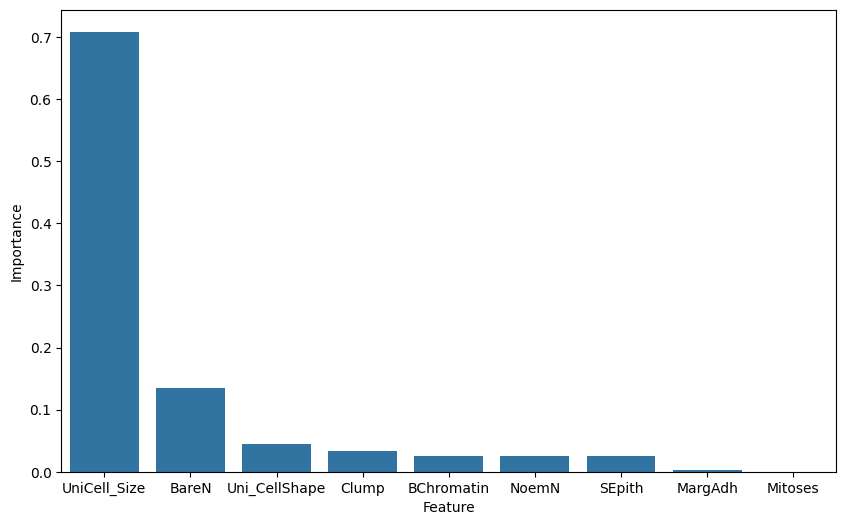

In [ ]:
plt.figure(figsize=(10,6))
sns.barplot(x='Feature', y='Importance',data=df_imp.sort_values(by='Importance', ascending=False))
plt.show()

In [ ]:
glass = pd.read_csv('/content/Glass.csv')
X = glass.drop('Type', axis=1)
y = glass['Type']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=24, test_size=0.3, stratify=y)

In [ ]:
rfc = RandomForestClassifier(n_estimators=100, random_state=24)
rfc.fit(X_train, y_train)
y_pred = rfc.predict(X_test)
accuracy_score(y_test, y_pred)
#

0.7538461538461538

In [ ]:
y_pred_prob = rfc.predict_proba(X_test)[:,1]
roc_auc_score(y_test, y_pred_prob)

ValueError: multi_class must be in ('ovo', 'ovr')

In [ ]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import roc_auc_score, log_loss
from sklearn.neighbors import KNeighborsRegressor
import warnings
warnings.filterwarnings('ignore')
params = {'max_features':[3,4,5], 'n_estimators':[10,50,100]}
kfold = StratifiedKFold(n_splits=5, random_state=24, shuffle=True)
gcv = GridSearchCV(rfc, param_grid=params, cv=kfold, scoring='accuracy')
gcv.fit(X,y)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=24, shuffle=True),
             estimator=RandomForestClassifier(random_state=24),
             param_grid={'max_features': [3, 4, 5],
                         'n_estimators': [10, 50, 100]},
             scoring='accuracy')

In [ ]:
print(gcv.best_params_)
print(gcv.best_score_)

{'max_features': 3, 'n_estimators': 100}
0.8179401993355482


In [ ]:
df_imp = pd.DataFrame({'Feature':list(X.columns),
                       'Importance':rfc.feature_importances_})
df_imp = df_imp.sort_values(by='Importance', ascending=True)
df_imp


,Feature,Importance
8,Fe,0.032580
4,Si,0.078660
5,K,0.083345
7,Ba,0.090164
0,RI,0.117470
1,Na,0.128698
2,Mg,0.149311
3,Al,0.158074
6,Ca,0.161699


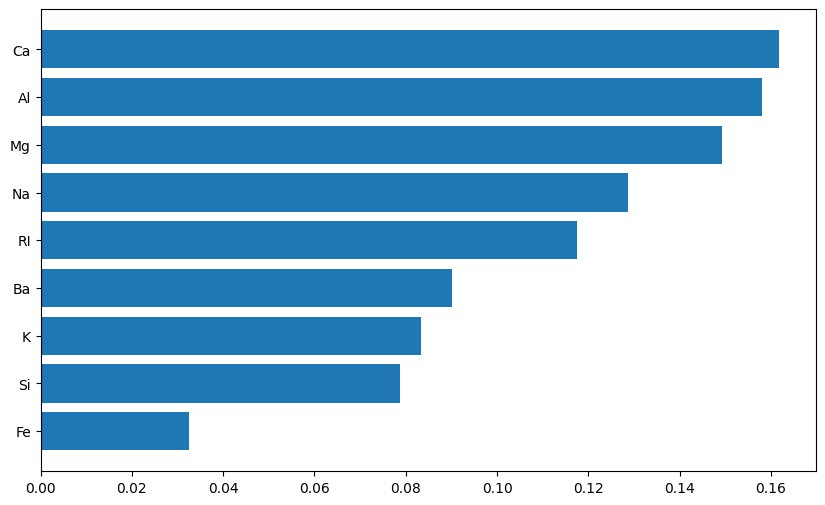

In [ ]:
plt.figure(figsize=(10,6))
plt.barh(df_imp['Feature'], df_imp['Importance'],data=df_imp)
plt.show()